## Import

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor

In [3]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler
from physics.Data_visualiser import Data_visualiser

In [4]:
pre_path = "../../../../../../../"
physical_model = "PARSEC"
path_to_data = pre_path + "data/PARSEC/"
path_to_results = pre_path + "results/model_B/default_models/"
path_to_predictions = pre_path + "predictions/model_B/default_models/"
tag = "mass_smaller_3"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["label"]

In [5]:
override = False
use_preds = True
save = True
show = True

## Data preparation

This notebook contains the results of the model which are trained using all the data from MIST and filtered on the phases

Reading PARSEC dataframe from PARSEC_rescaled_iso_full_data.csv file...


,logAge,logTe,logg,label,metallicity,Mass,Rpol
0,5.00000,3.4744,2.965,0.0,-0.25,0.090,0.213783
1,5.00000,3.4752,2.963,0.0,-0.25,0.092,0.219060
2,5.00000,3.4780,2.956,0.0,-0.25,0.098,0.236789
3,5.00000,3.4789,2.954,0.0,-0.25,0.100,0.242293
4,5.00000,3.4819,2.950,0.0,-0.25,0.106,0.257918
...,...,...,...,...,...,...,...
681298,10.25002,3.4812,0.032,7.0,0.50,0.801,2.156549
681299,10.25002,3.4776,-0.004,7.0,0.50,0.801,2.175802
681300,10.25002,3.4742,-0.038,7.0,0.50,0.800,2.194514
681301,10.25002,3.4701,-0.077,7.0,0.50,0.800,2.215902


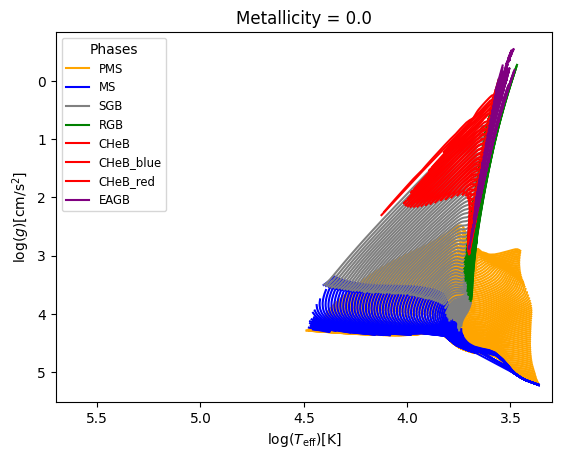

In [6]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['logAge', 'logTe', 'logg', 'label', 'metallicity', 'Mass', 'Rpol'], 
                              physical_model, rescale=True)

iso_df = iso_handler.get_isochrone_dataframe()
display(iso_df)
data_visualiser = Data_visualiser(iso_df, physical_model)
data_visualiser.plot_Kiel([], [0.0])

In [7]:
print_uniques("Mass", iso_df)
# print_uniques_count("Mass", iso_df)

Mass : 12076 unique values, range [0.09, 13.952]


,logAge,logTe,logg,label,metallicity,Mass,Rpol
0,5.60000,4.4269,4.356,1.0,-0.25,9.714,0.535041
1,5.65000,4.4266,4.355,1.0,-0.25,9.714,0.535800
2,5.70000,4.4263,4.353,1.0,-0.25,9.714,0.536558
3,5.75000,4.4061,4.358,1.0,-0.25,8.856,0.514282
4,5.75000,4.4260,4.352,1.0,-0.25,9.714,0.537441
...,...,...,...,...,...,...,...
321691,10.25002,3.6561,2.334,4.0,0.50,0.805,1.005181
321692,10.25002,3.6560,2.333,4.0,0.50,0.805,1.005609
321693,10.25002,3.6559,2.331,4.0,0.50,0.805,1.006466
321694,10.25002,3.6558,2.330,4.0,0.50,0.805,1.006894


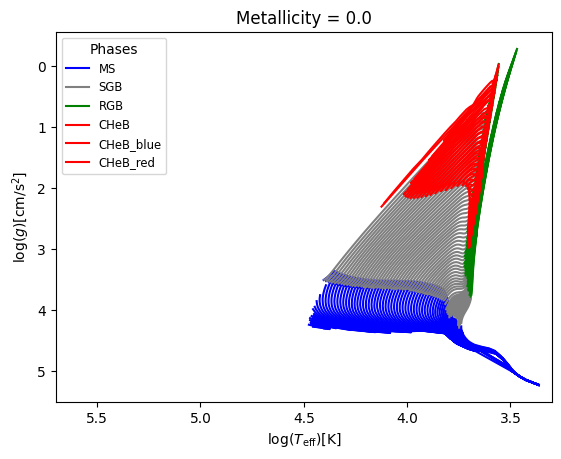

In [8]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'label':[1, 2, 3, 4, 5, 6]})
display(phase_filtered_iso_df)
data_visualiser_phase_filtered = Data_visualiser(phase_filtered_iso_df, physical_model)
data_visualiser_phase_filtered.plot_Kiel([], [0.0])

In [9]:
print_uniques("Mass", phase_filtered_iso_df)
# print_uniques_count("star_mass", phase_filtered_iso_df)

Mass : 11135 unique values, range [0.09, 13.952]


,logAge,logTe,logg,label,metallicity,Mass,Rpol
0,6.80001,4.1048,4.436,1.0,-0.25,2.687,0.215638
1,6.85001,4.1046,4.435,1.0,-0.25,2.687,0.216166
2,6.90001,4.1043,4.434,1.0,-0.25,2.687,0.216694
3,6.90001,4.1083,4.434,1.0,-0.25,2.725,0.220108
4,6.95001,4.1041,4.433,1.0,-0.25,2.687,0.217221
...,...,...,...,...,...,...,...
243958,10.25002,3.6561,2.334,4.0,0.50,0.805,1.005181
243959,10.25002,3.6560,2.333,4.0,0.50,0.805,1.005609
243960,10.25002,3.6559,2.331,4.0,0.50,0.805,1.006466
243961,10.25002,3.6558,2.330,4.0,0.50,0.805,1.006894


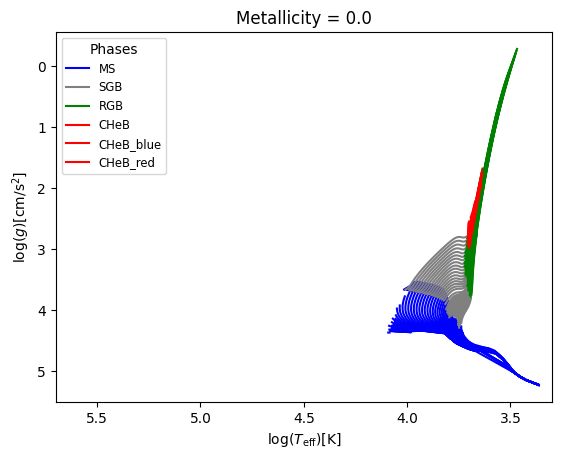

In [10]:
phase_mass_filtered_iso_df = Data_preparator.filter_data(iso_df, {'label':[1, 2, 3, 4, 5, 6], "Mass" : ("<", 3)})
display(phase_mass_filtered_iso_df)
data_visualiser_phase_age_filtered = Data_visualiser(phase_mass_filtered_iso_df, physical_model)
data_visualiser_phase_age_filtered.plot_Kiel([], [0.0])

In [11]:
print_all_uniques(phase_mass_filtered_iso_df)

logAge  : Range : 6.8 - 10.25, Mean : 9.4807, Median : 9.5

logTe  : Range : 3.36 - 4.1907, Mean : 3.732, Median : 3.7204

logg  : Range : -0.38 - 5.345, Mean : 2.8946, Median : 2.504

Values in label column : 1.0, 2.0, 3.0, 4.0, 5.0, 6.0 

Values in metallicity column : -0.25, -0.5, -0.75, -1.0, -1.25, -1.5, -1.75, -2.0, -2.25, -2.5, -2.75, 0.0, 0.25, 0.5 

Mass  : Range : 0.09 - 2.999, Mean : 1.3031, Median : 1.178

Rpol  : Range : -0.98 - 2.3632, Mean : 0.8085, Median : 1.0017



In [12]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_mass_filtered_iso_df, x_cols=['logAge', 'metallicity', 'Mass'], 
                               y_cols=['logTe', 'logg', 'Rpol'], categories_cols=['label'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the logTe parameter : 3.3621 - 4.1907
Median value in train data for the logTe parameter: 3.7204
Mean value in train data for the logTe parameter: 3.732215182104366

Range in train data for the logg parameter : -0.384 - 5.345
Median value in train data for the logg parameter: 2.504
Mean value in train data for the logg parameter: 2.895365422031786

Range in train data for the Rpol parameter : -0.9763360818022064 - 2.363235804483694
Median value in train data for the Rpol parameter: 1.0017337128090005
Mean value in train data for the Rpol parameter: 0.8081824956202829

Testing set statistics:
Range in test data for the logTe parameter : 3.3622 - 4.1907
Median value in test data for the logTe parameter: 3.7204
Mean value in test data for the logTe parameter: 3.731551343640865

Range in test data for the logg parameter : -0.323 - 5.345
Median value in test data for the logg parameter: 2.504
Mean value in test data for the logg parameter: 2.

## Model training

### Linear regression

In [13]:
lr_evaluator = Model_evaluator("linear_regression", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.1907
  RVE :  0.4252524861822299
  RMSE :  0.14224797949784304
  MAE :  0.1252941437867672
  MedAE :  0.10865869006110951
  CORR :  0.7428268179996913
  MAX_ER :  0.32000842330395507
  Percentiles : 
    75th percentile :  0.17007656653396763
    90th percentile :  0.22873900249072854
    95th percentile :  0.2540608950529443
    99th percentile :  0.2870978905180533

T_eff results for the label category with a value of 2.0
  value range :  3.6813 - 4.1397
  RVE :  0.3554085864147183
  RMSE :  0.10163849124145655
  MAE :  0.08213297366502408
  MedAE :  0.07118473120414981
  CORR :  0.5966831965905013
  MAX_ER :  0.3040571798406537
  Percentiles : 
    75th percentile :  0.11261137881432781
    90th percentile :  0.17127486022288144
    95th percentile :  0.2061128527743005
    99th percentile :  0.25214763812752294

T_eff result

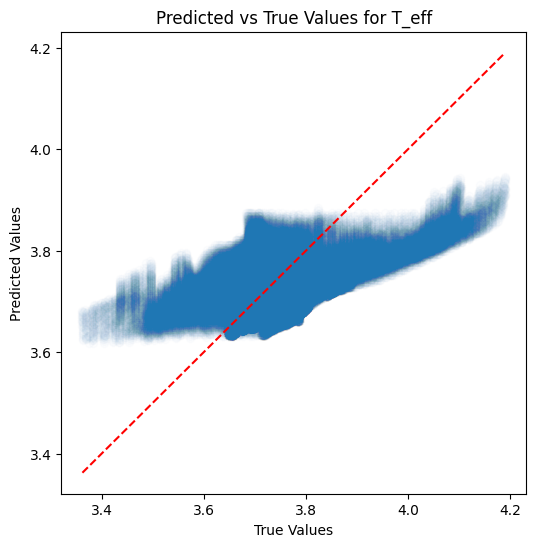

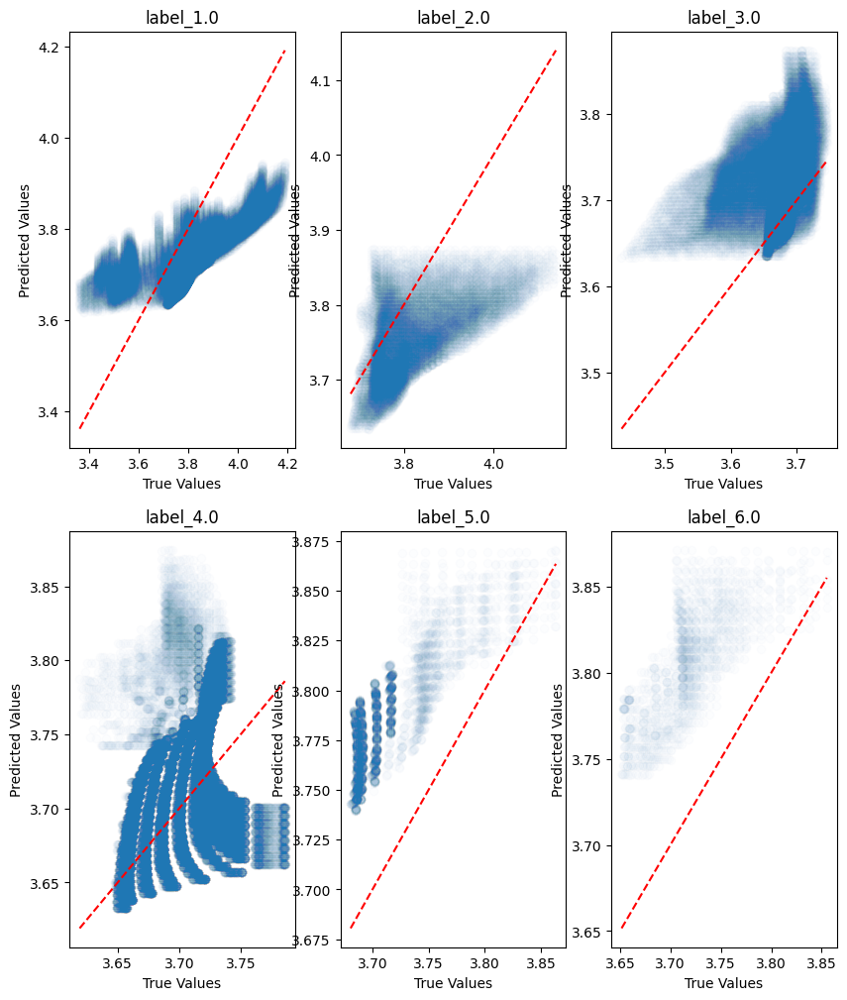

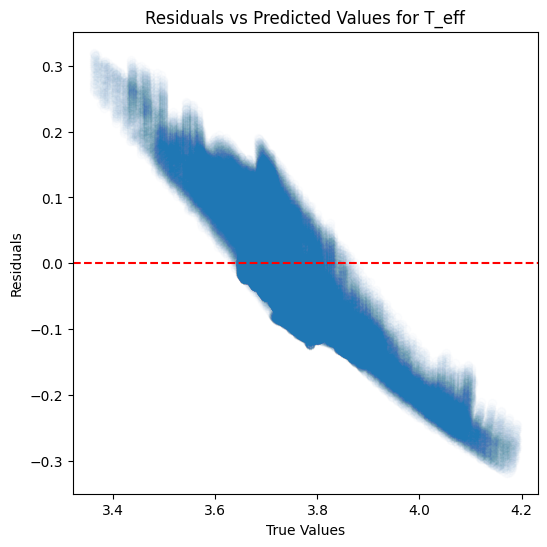

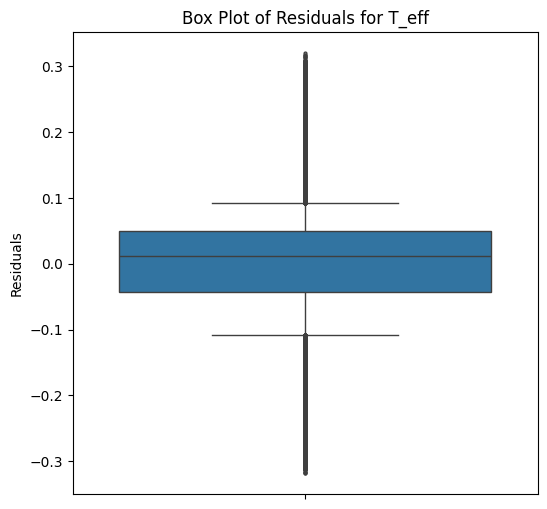

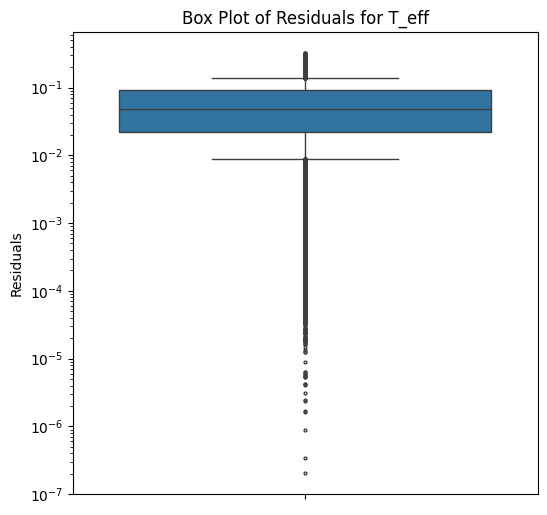

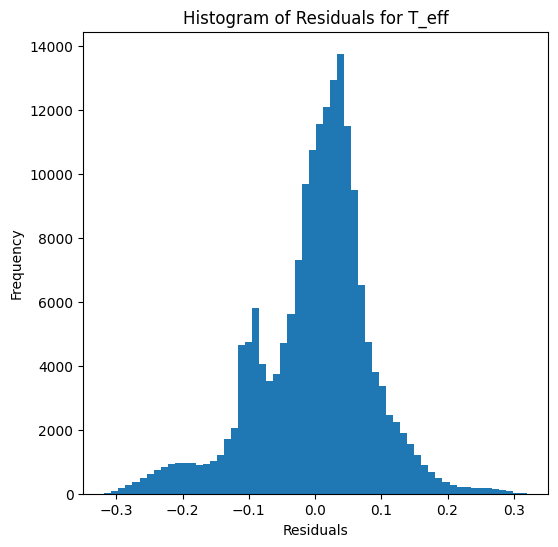

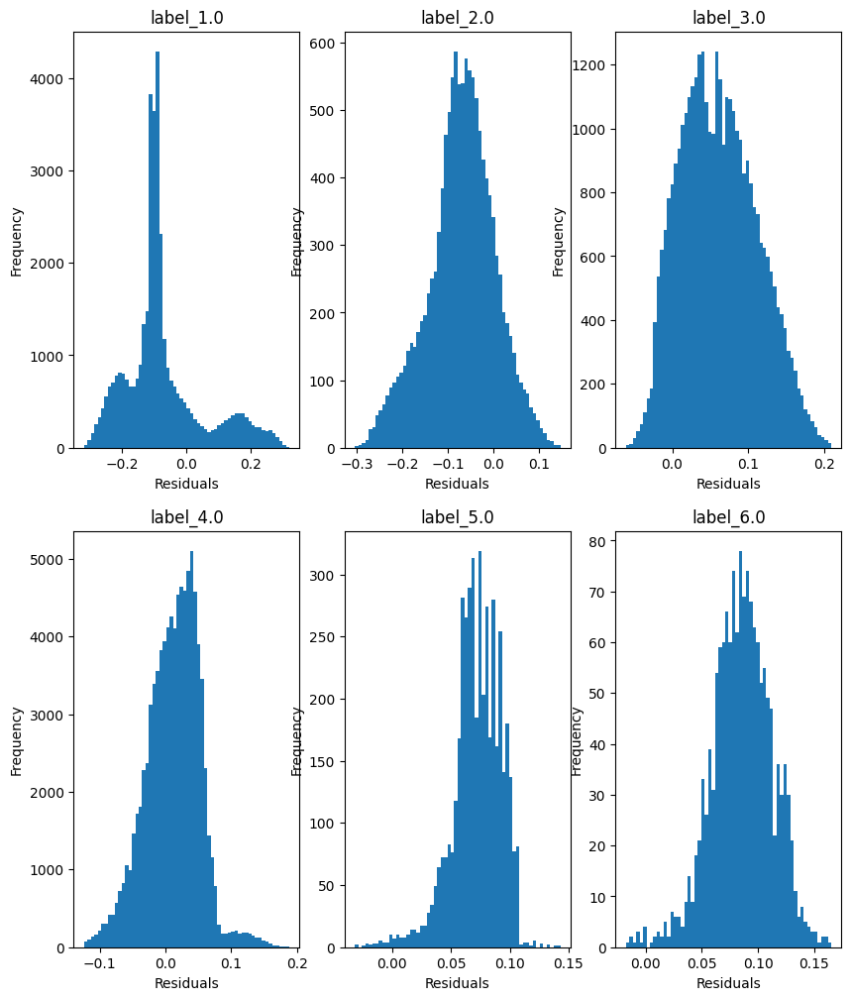

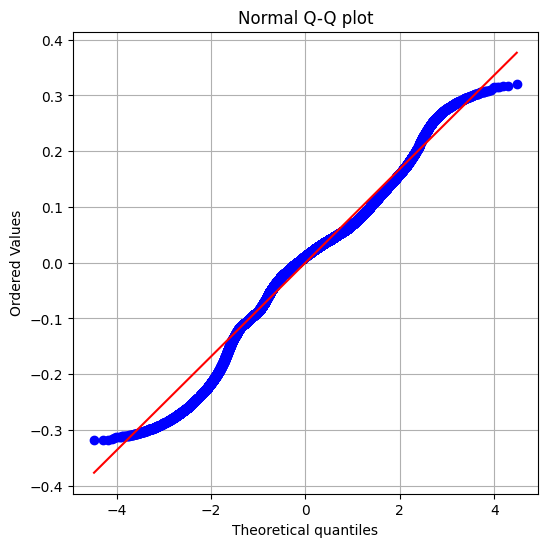

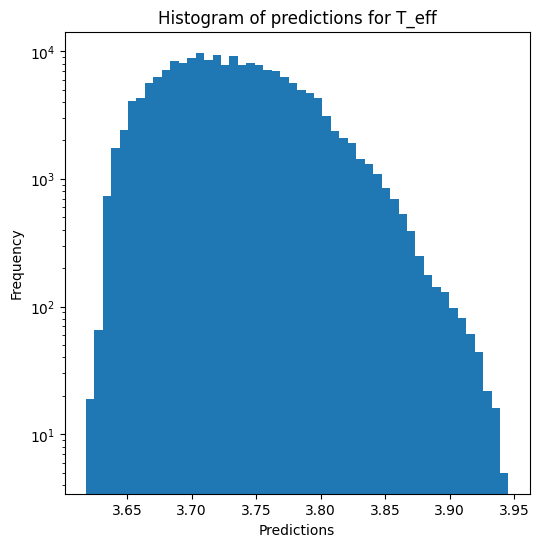

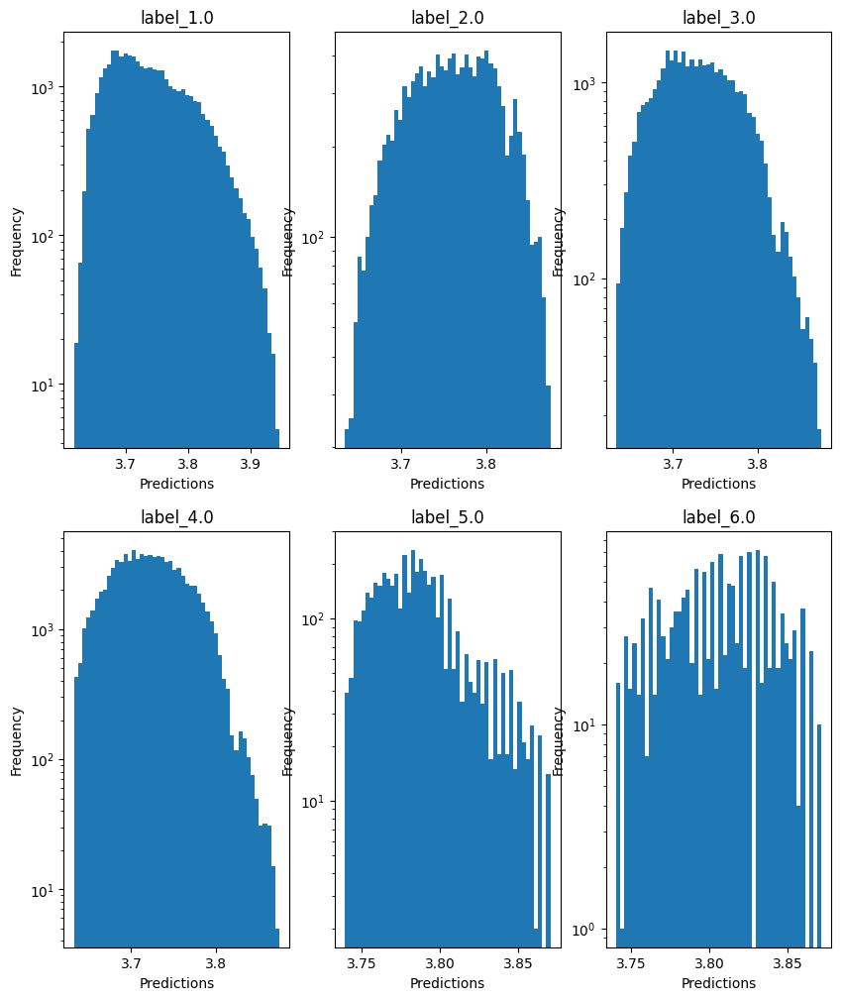

no negative values

log_g results for the label category with a value of 1.0
  value range :  3.465 - 5.345
  RVE :  -3.275418831406798
  RMSE :  1.2034244710801263
  MAE :  1.0842145783746058
  MedAE :  1.1140769299772573
  CORR :  0.5893814048738154
  MAX_ER :  2.223276704591555
  Percentiles : 
    75th percentile :  1.4902017813391575
    90th percentile :  1.7785992761073974
    95th percentile :  1.877144054757352
    99th percentile :  2.0276856592558743

log_g results for the label category with a value of 2.0
  value range :  2.456 - 4.299
  RVE :  -0.027980441684109847
  RMSE :  0.9174628418935944
  MAE :  0.8411477623788803
  MedAE :  0.828322316142847
  CORR :  0.32866941676222167
  MAX_ER :  1.9747558791773958
  Percentiles : 
    75th percentile :  1.0846106699262044
    90th percentile :  1.3396045890768382
    95th percentile :  1.4971411399215806
    99th percentile :  1.7178336735164417

log_g results for the label category with a value of 3.0
  value range :  -0.384 

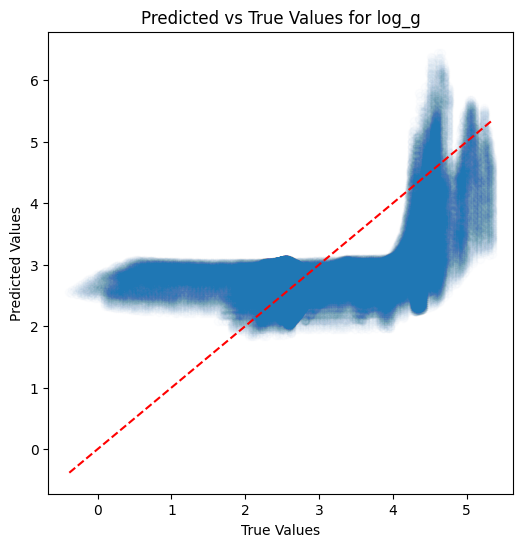

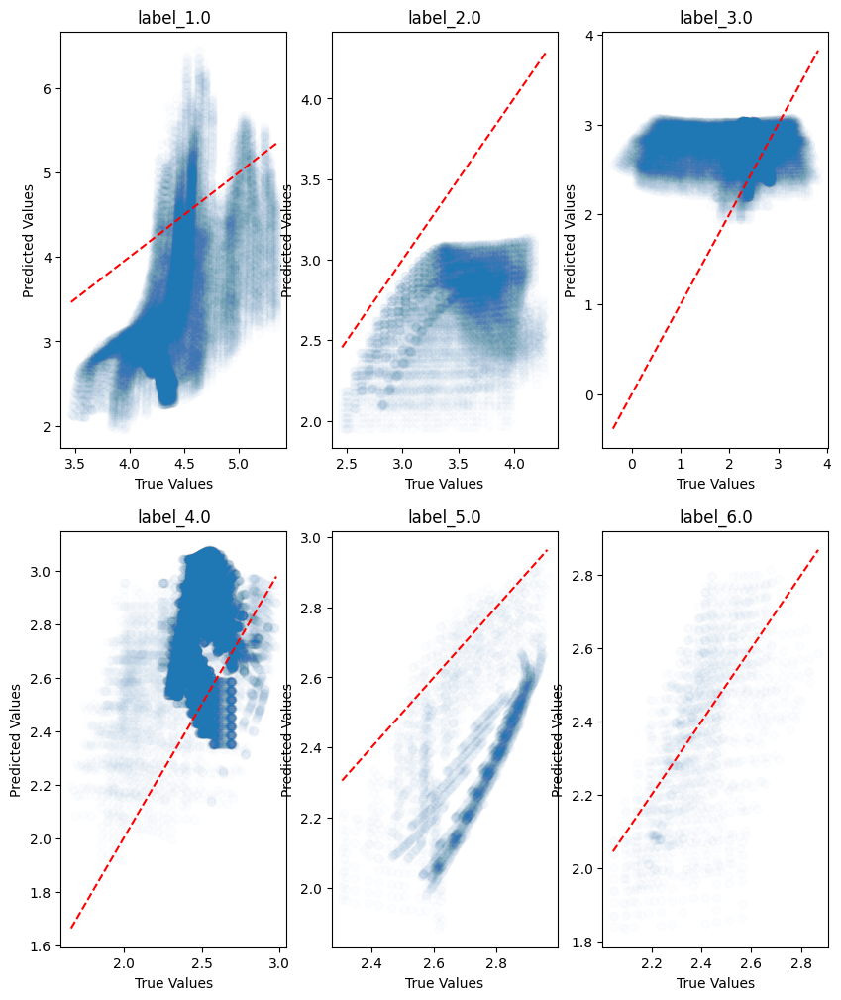

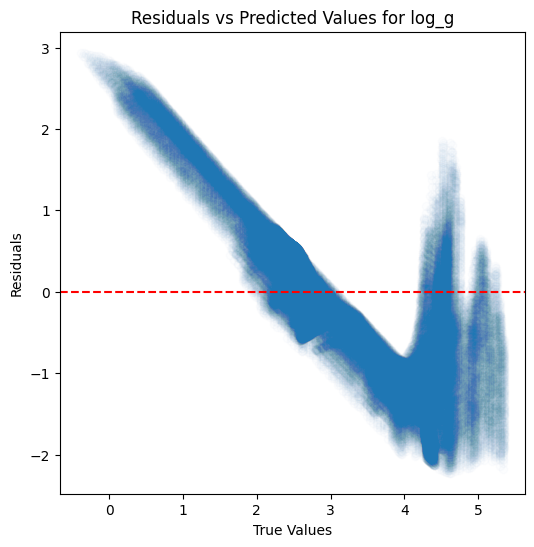

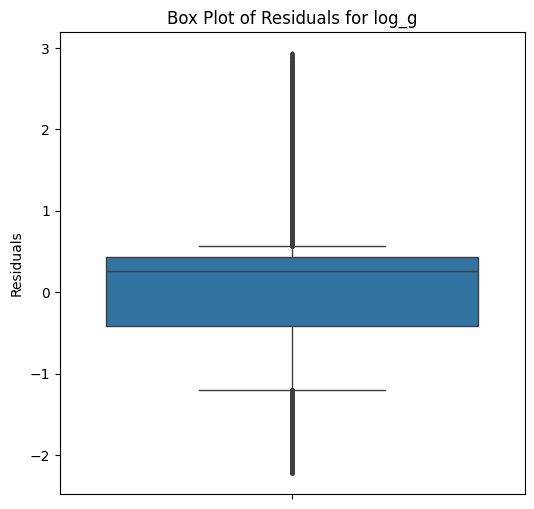

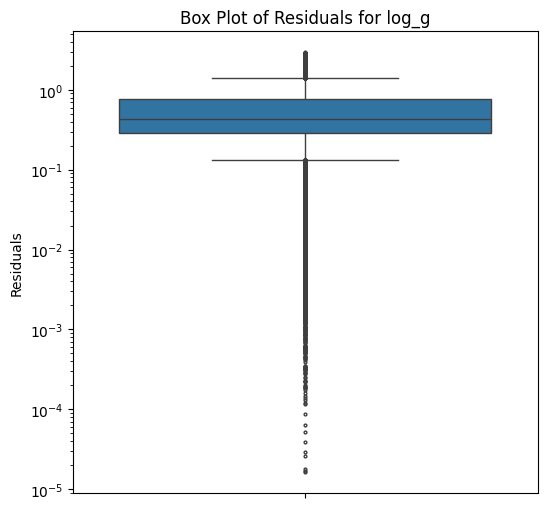

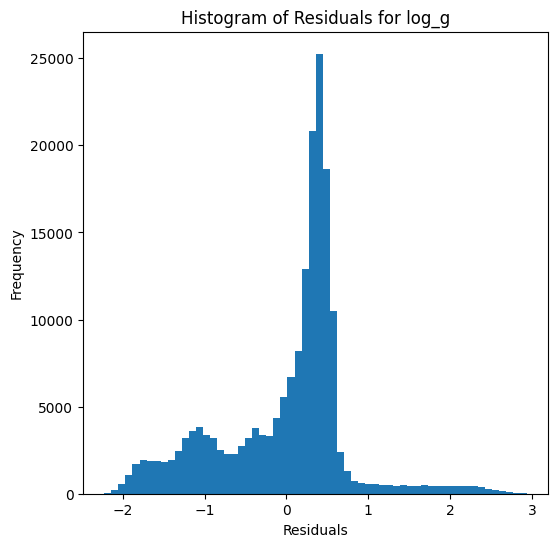

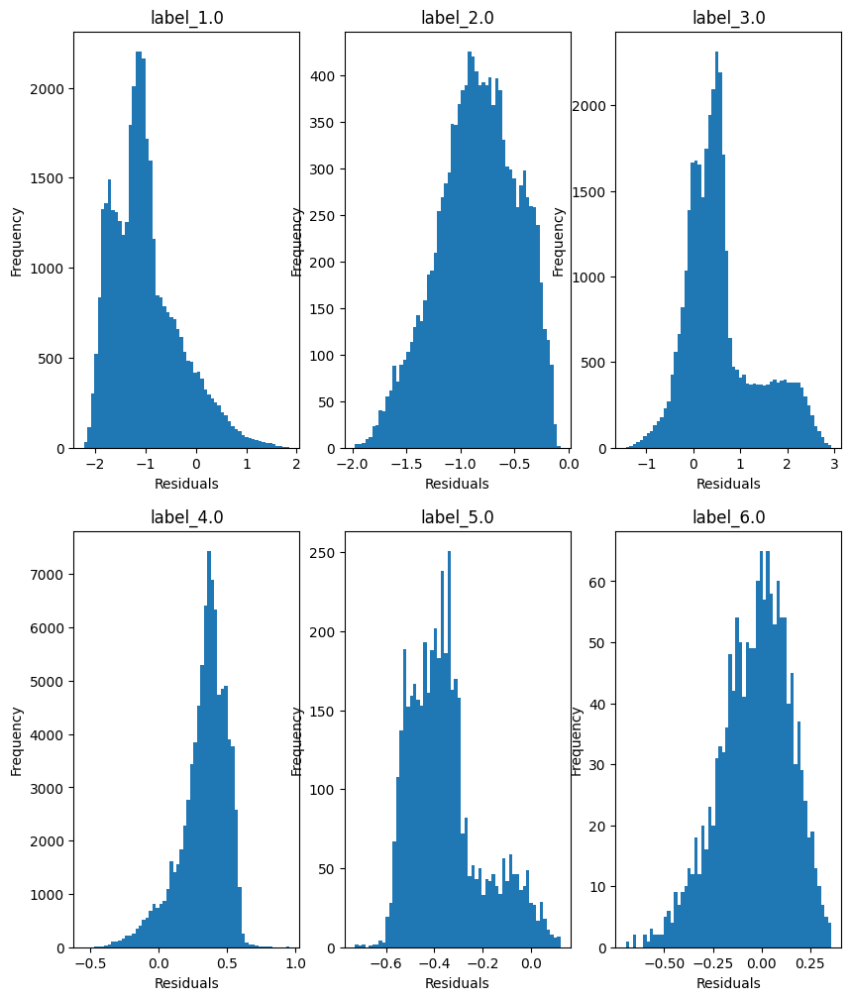

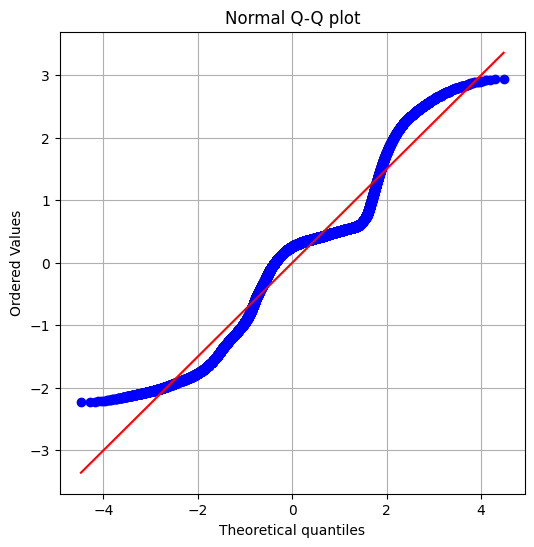

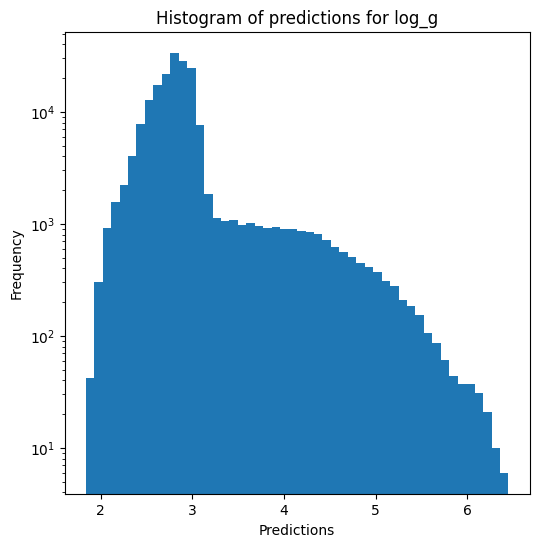

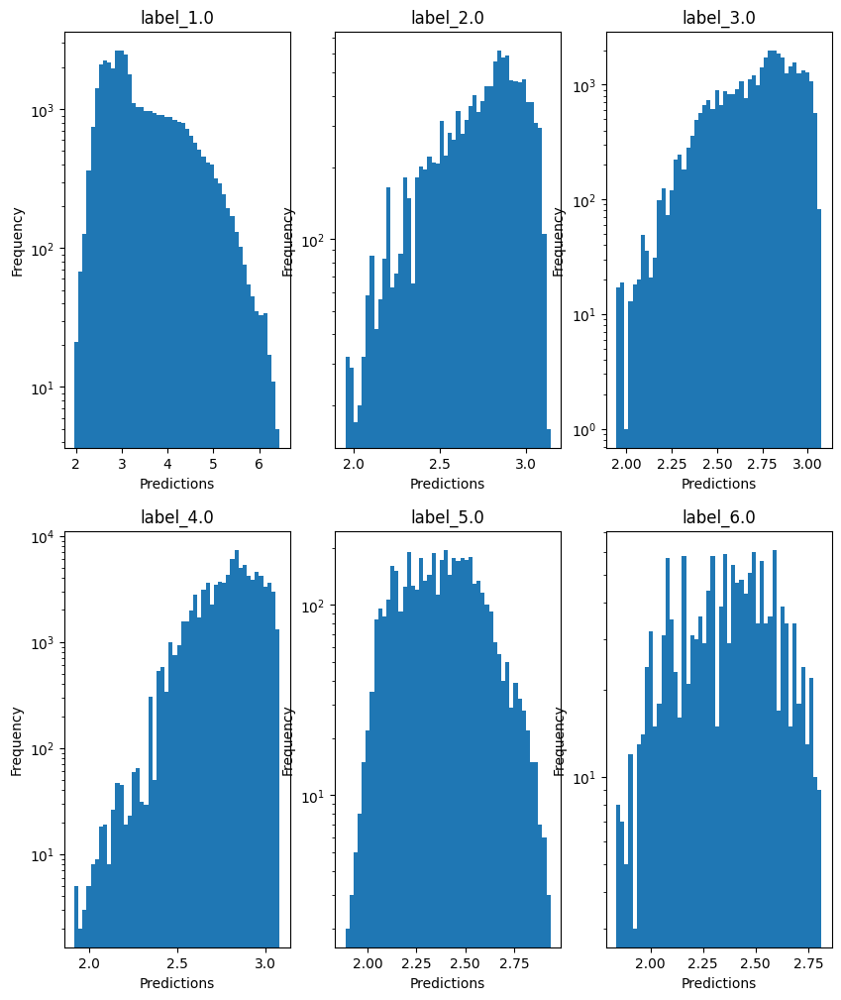


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 0.7228806106869394
  RVE :  -0.38728983206769274
  RMSE :  0.6238573686801736
  MAE :  0.560992030142771
  MedAE :  0.560119894578202
  CORR :  0.6192330441146768
  MAX_ER :  1.4371270520309136
  Percentiles : 
    75th percentile :  0.7768798896042655
    90th percentile :  0.9216937481102104
    95th percentile :  0.9804427130792154
    99th percentile :  1.0933178448963679

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 1.2289134059946882
  RVE :  0.408572591522509
  RMSE :  0.4662014379721217
  MAE :  0.42671744861168726
  MedAE :  0.41432745731367254
  CORR :  0.6610338587317061
  MAX_ER :  1.0813481030120495
  Percentiles : 
    75th percentile :  0.5470030612787895
    90th percentile :  0.689421109543053
    95th percentile :  0.7720919841104013
    99th percentile :  0.8894860496726762

radius results for the label category with a v

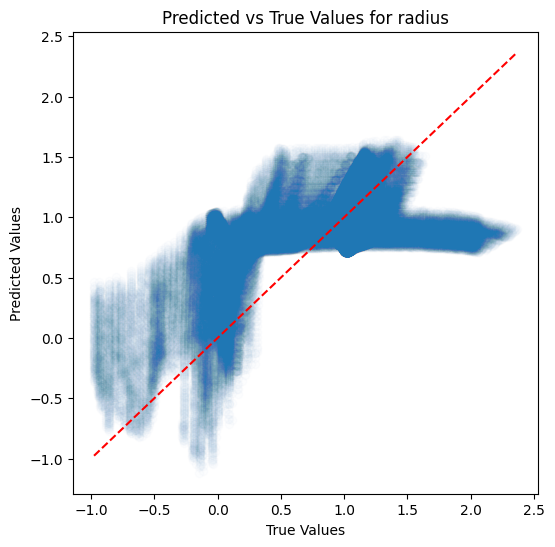

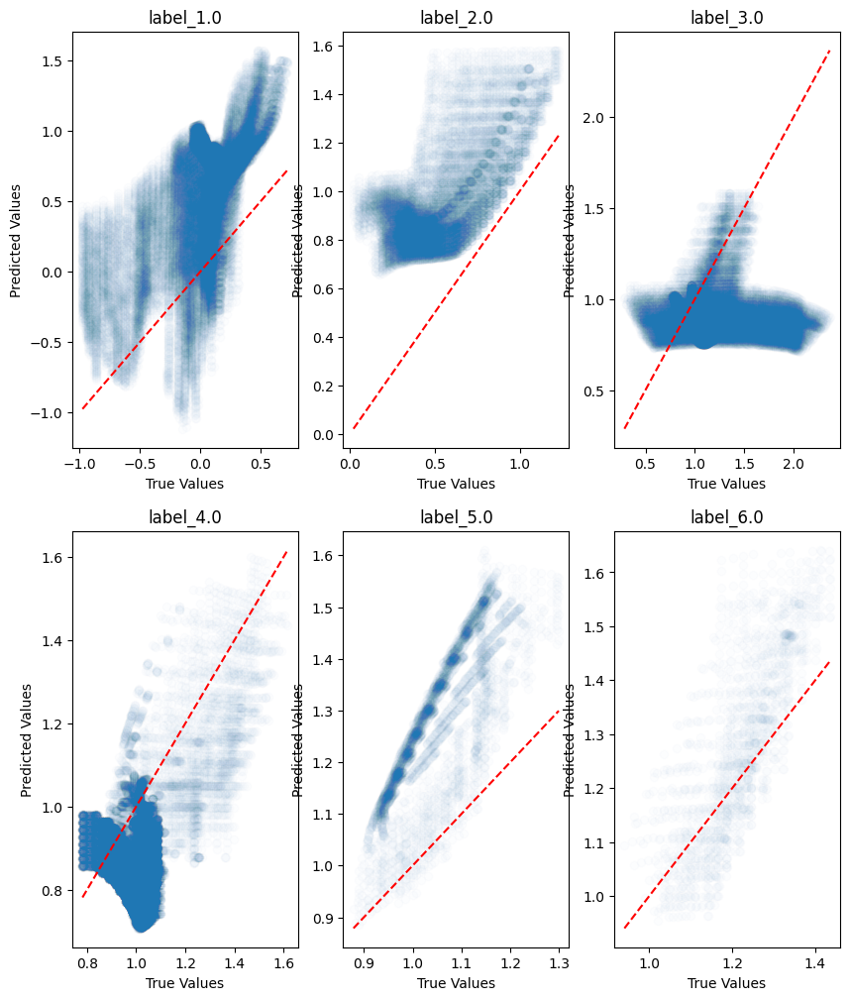

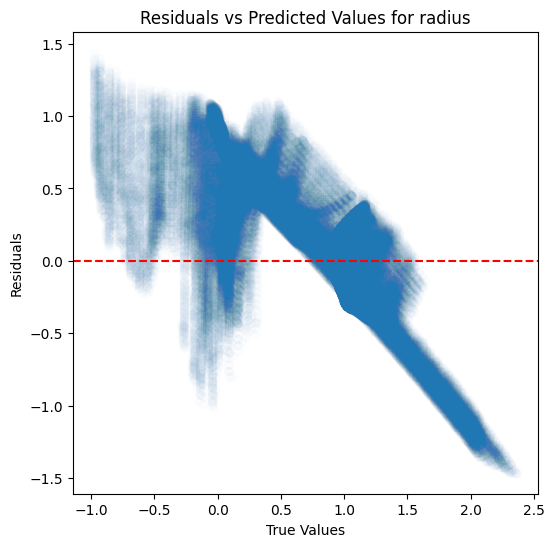

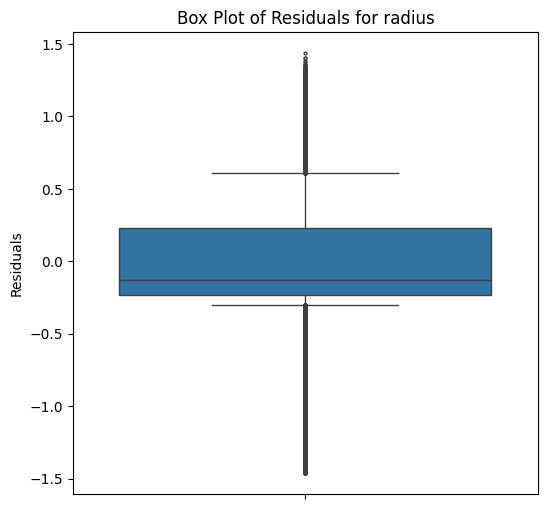

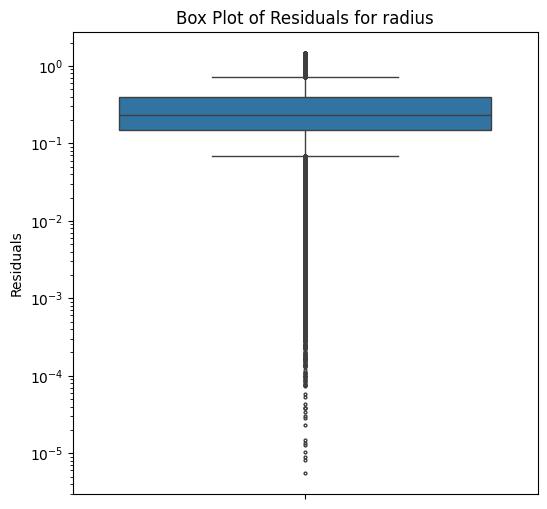

...

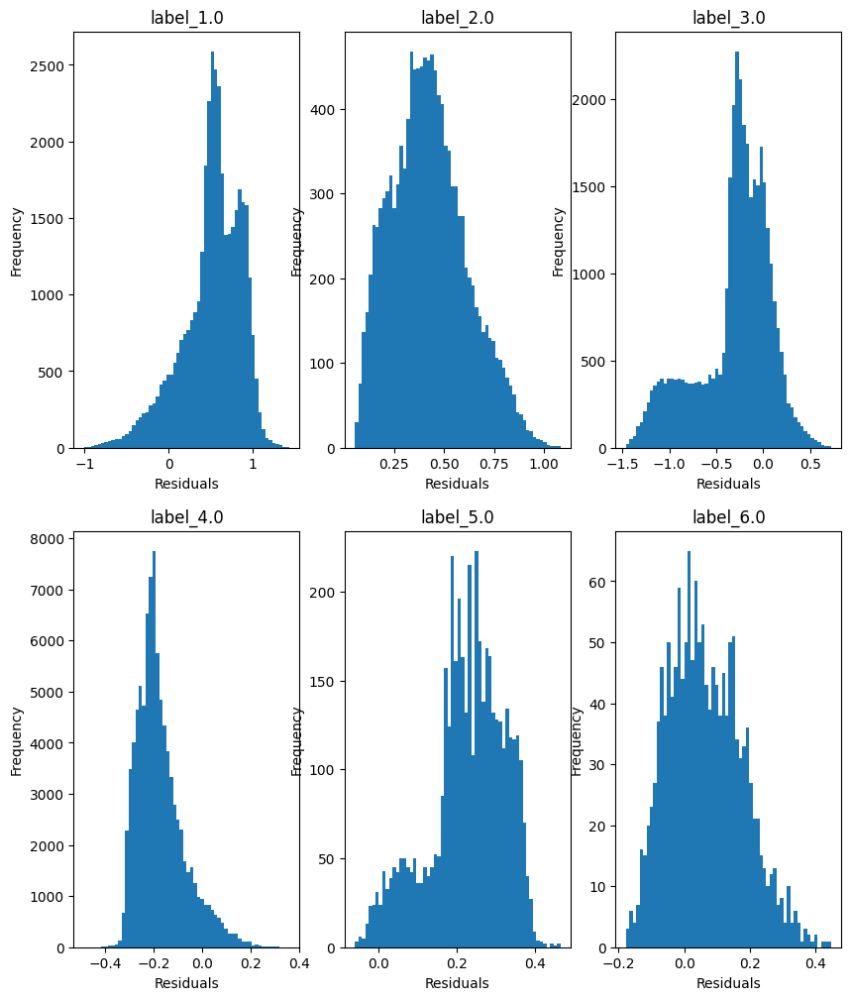

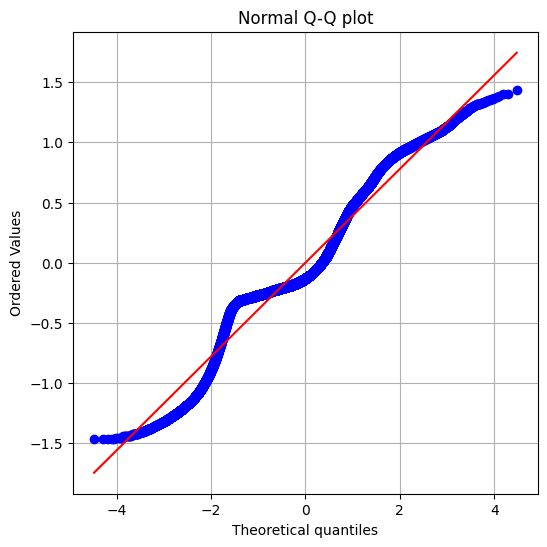

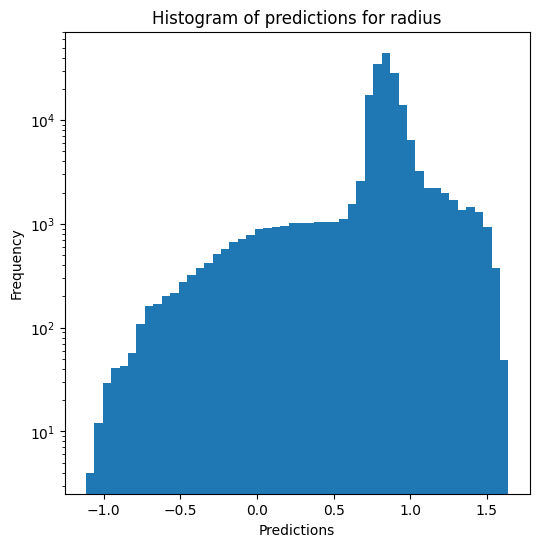

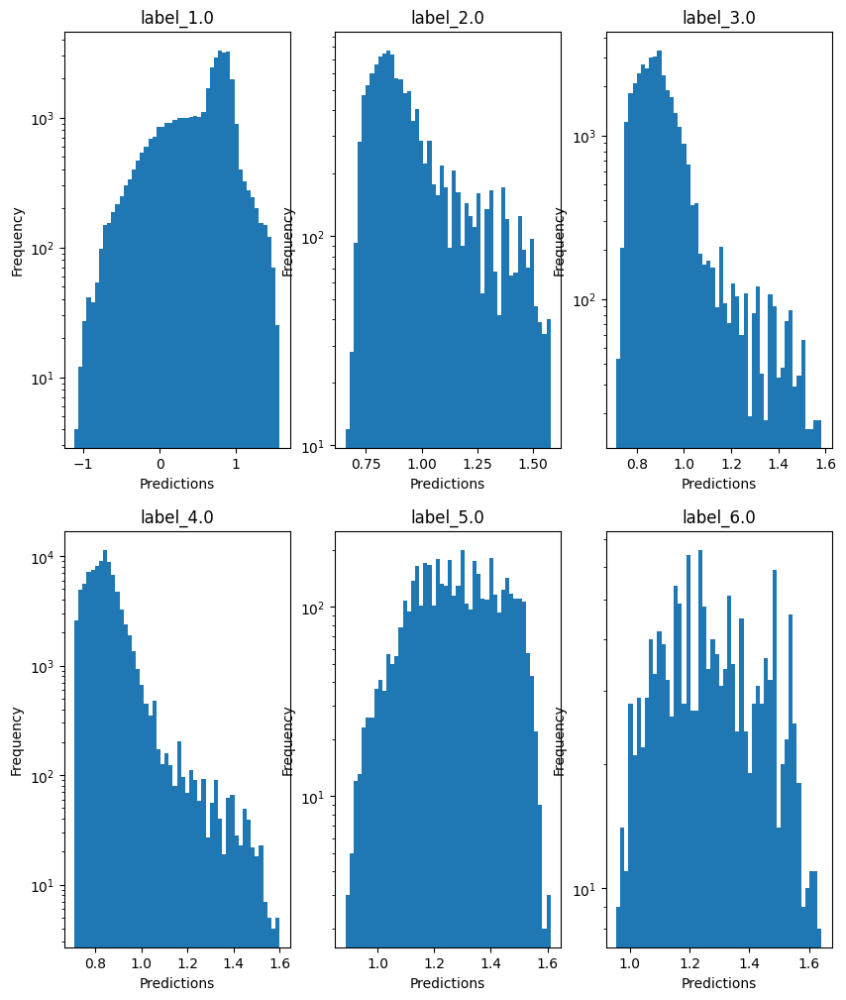

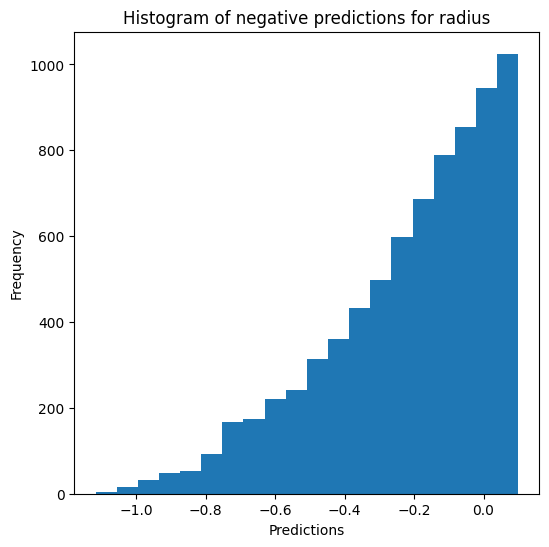

Saving results...


In [14]:
lr_evaluator.evaluate_Kfold_results(LinearRegression, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show) # override=True, use_preds=False

### Decision tree

In [15]:
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Evaluating predictions...


c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\numpy\lib\_function_base_impl.py:4671: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.1907
  RVE :  0.975213198122586
  RMSE :  0.025525608230402626
  MAE :  0.005852321173799819
  MedAE :  6.666666666665932e-05
  CORR :  0.9879085497518846
  MAX_ER :  0.3836999999999997
  Percentiles : 
    75th percentile :  0.0005999999999999339
    90th percentile :  0.008500000000000174
    95th percentile :  0.02460000000000038
    99th percentile :  0.12535067241379302

T_eff results for the label category with a value of 2.0
  value range :  3.6813 - 4.1397
  RVE :  0.6049838323957871
  RMSE :  0.06317765357377349
  MAE :  0.03278852938657706
  MedAE :  0.009400000000000297
  CORR :  0.8925416933006906
  MAX_ER :  0.2875000000000001
  Percentiles : 
    75th percentile :  0.029549999999999965
    90th percentile :  0.11346500000000029
    95th percentile :  0.16940999999999984
    99th percentile :  0.23819999999999997

T_eff results for the label category with a value of 3.0

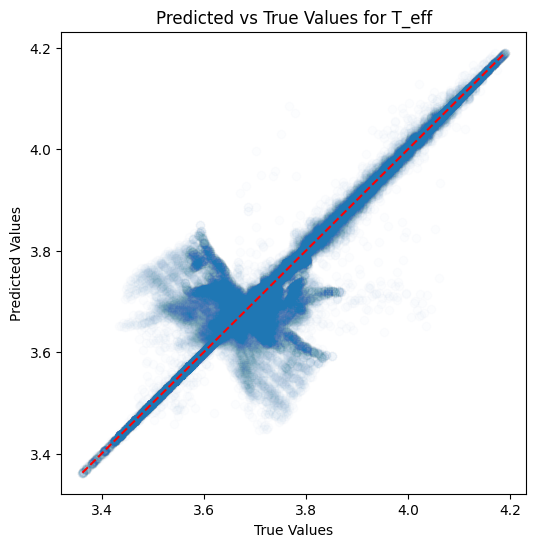

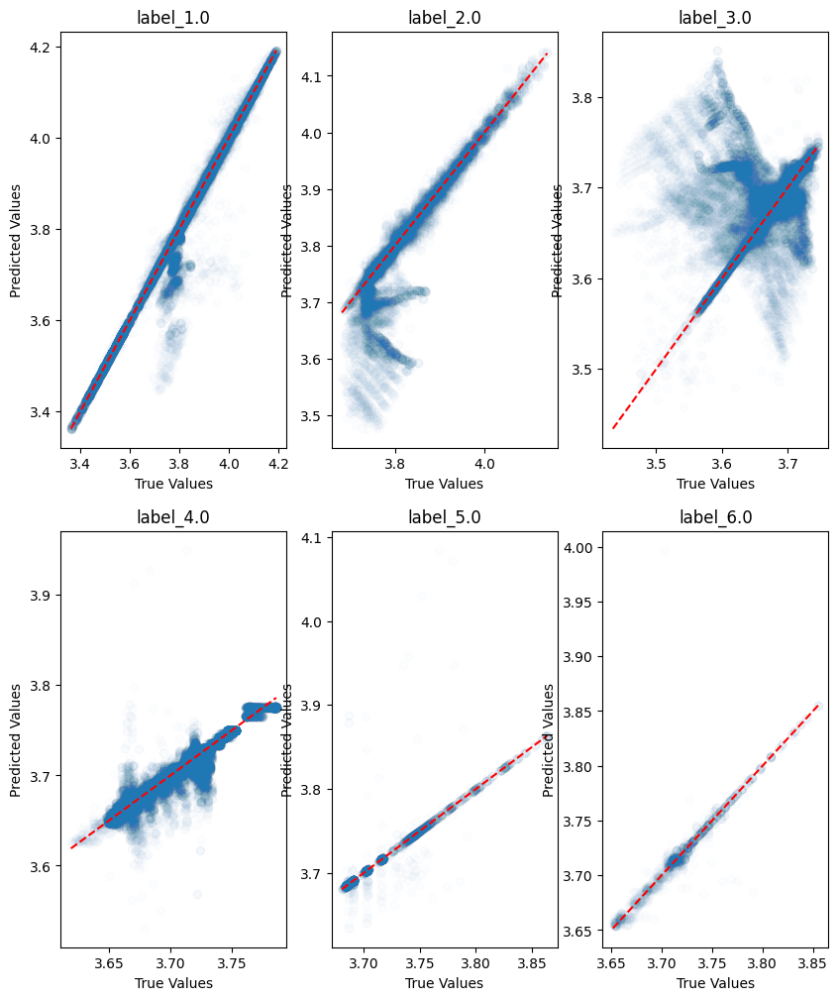

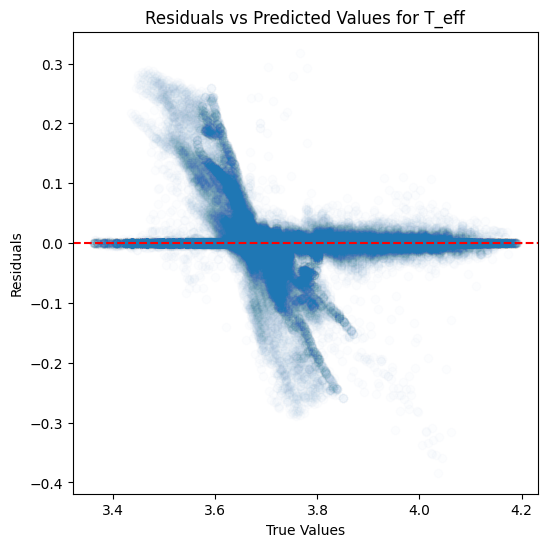

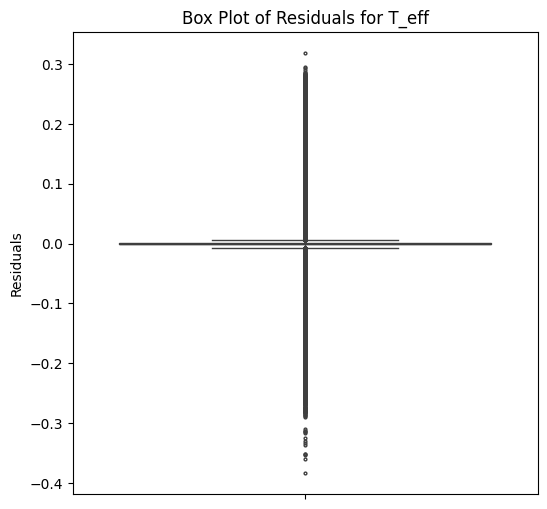

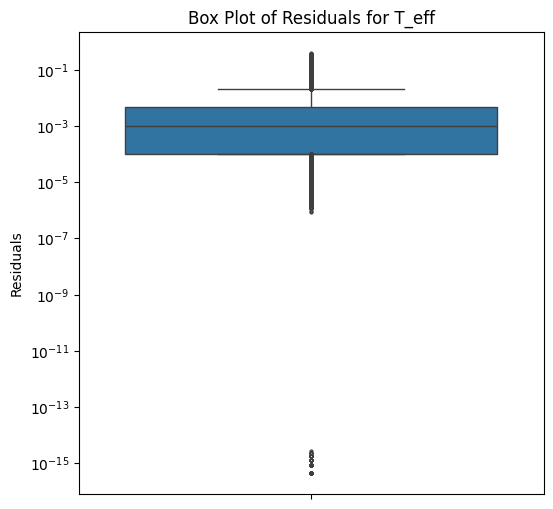

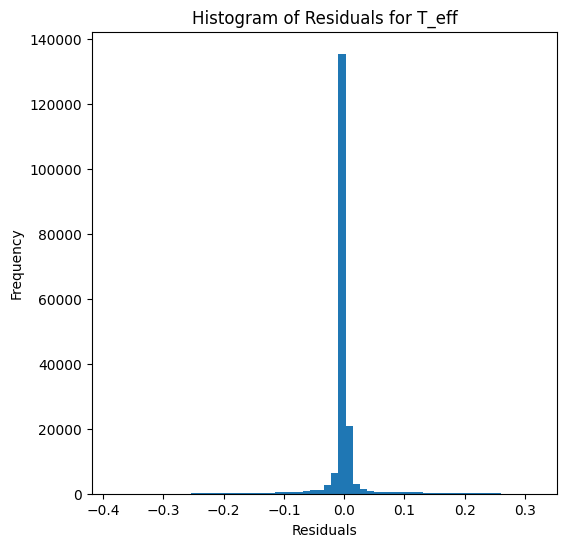

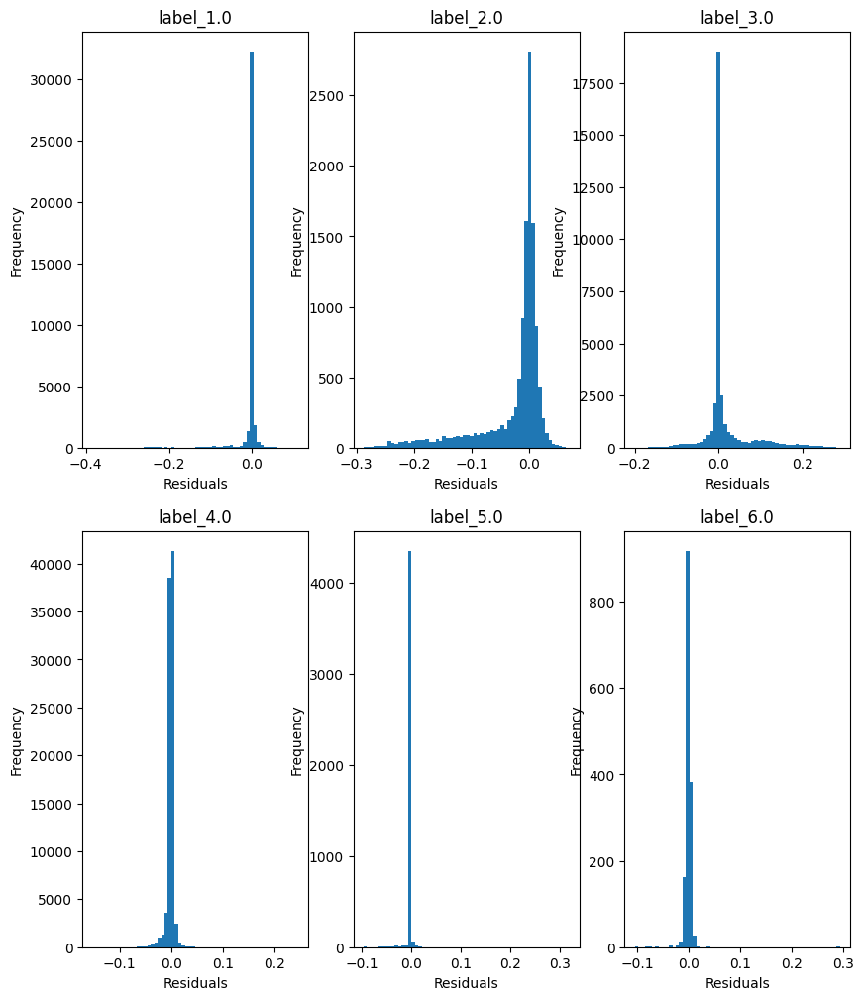

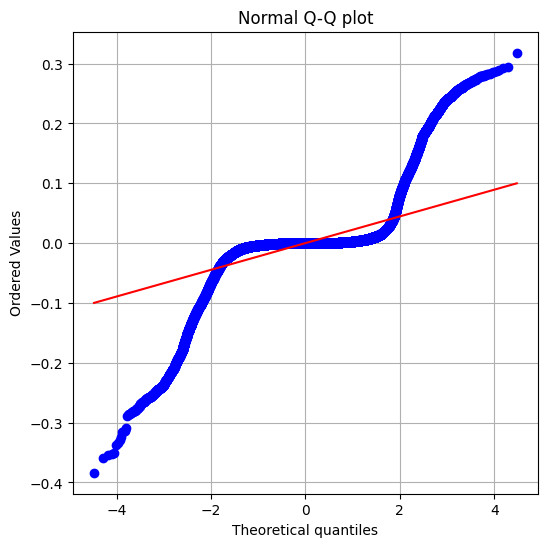

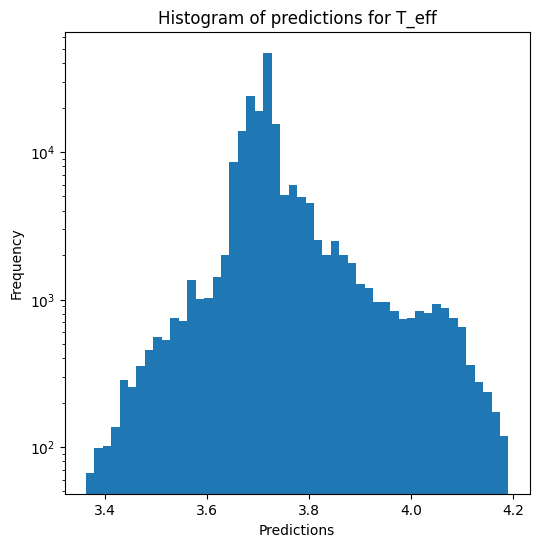

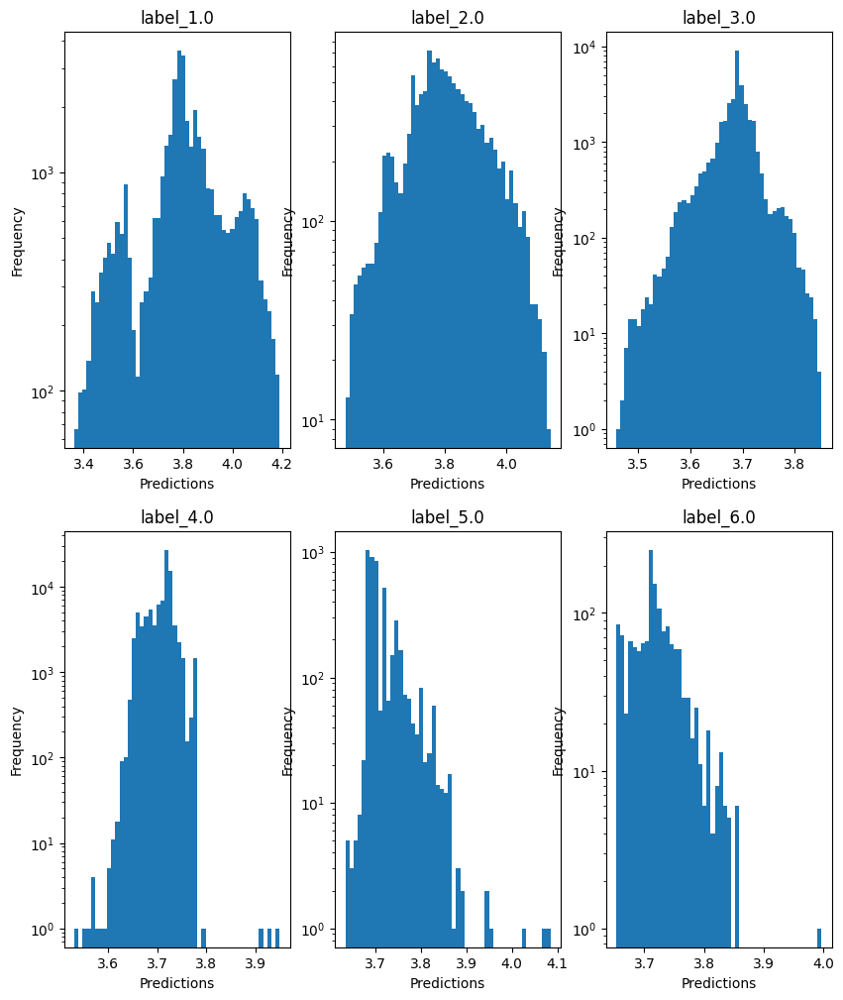

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\numpy\lib\_function_base_impl.py:4671: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)



log_g results for the label category with a value of 1.0
  value range :  3.465 - 5.345
  RVE :  -0.4913583627937592
  RMSE :  0.40044279595694104
  MAE :  0.07341851606825935
  MedAE :  0.0009999999999994458
  CORR :  0.6684831846270675
  MAX_ER :  4.75
  Percentiles : 
    75th percentile :  0.0039999999999995595
    90th percentile :  0.020000000000000462
    95th percentile :  0.06494999999999662
    99th percentile :  1.9444749999999986

log_g results for the label category with a value of 2.0
  value range :  2.456 - 4.299
  RVE :  -5.81812692567734
  RMSE :  1.0463984851401869
  MAE :  0.4757052385721764
  MedAE :  0.03200000000000003
  CORR :  0.04590994627709065
  MAX_ER :  4.218000000000001
  Percentiles : 
    75th percentile :  0.13406249999999997
    90th percentile :  1.7185000000000001
    95th percentile :  2.965
    99th percentile :  3.604

log_g results for the label category with a value of 3.0
  value range :  -0.384 - 3.823
  RVE :  -0.880261906687066
  RMSE :  1

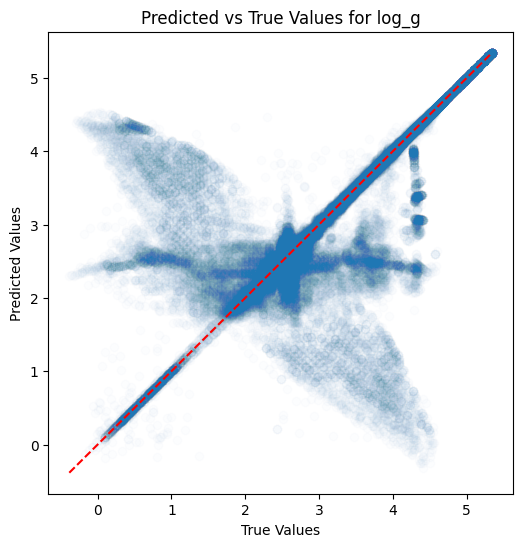

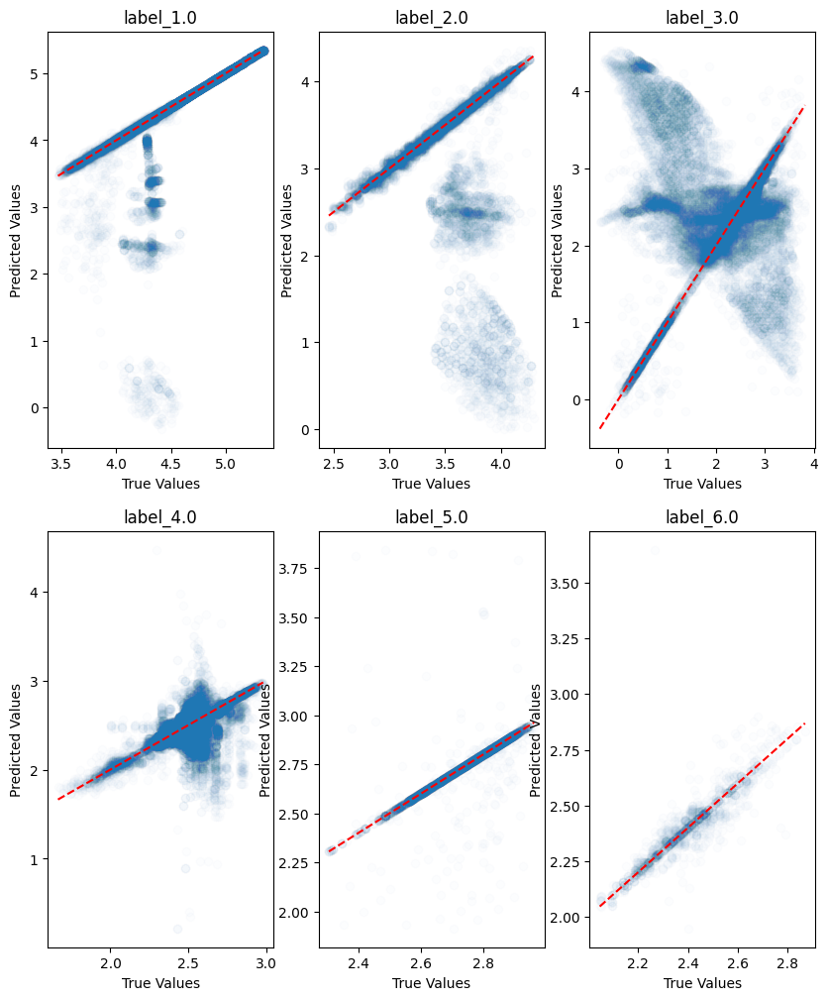

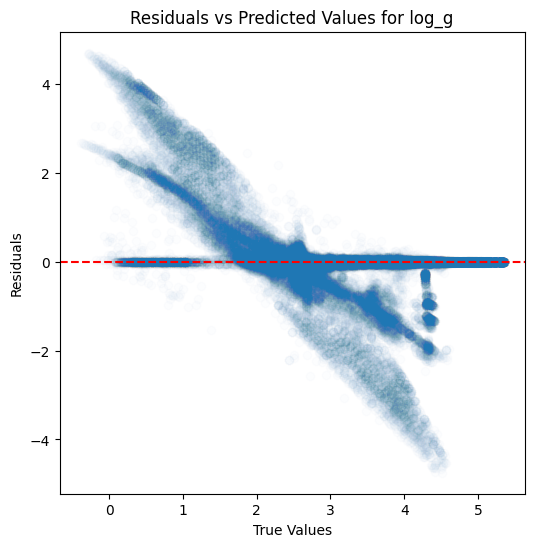

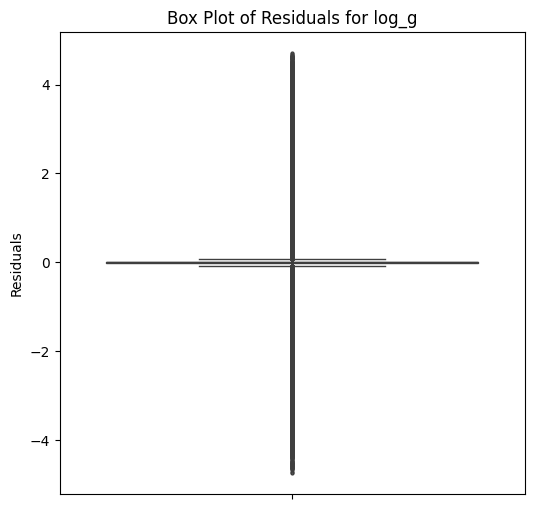

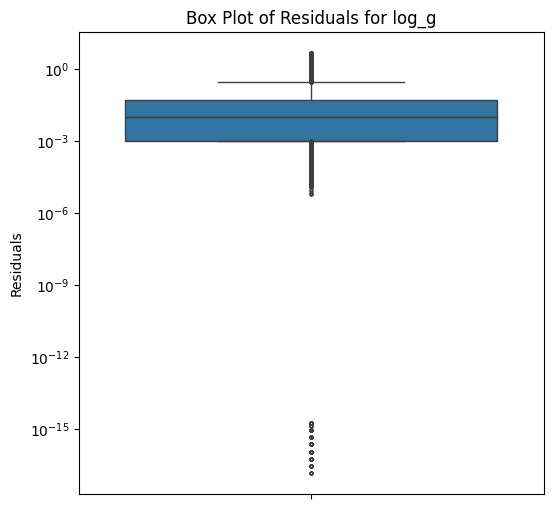

...

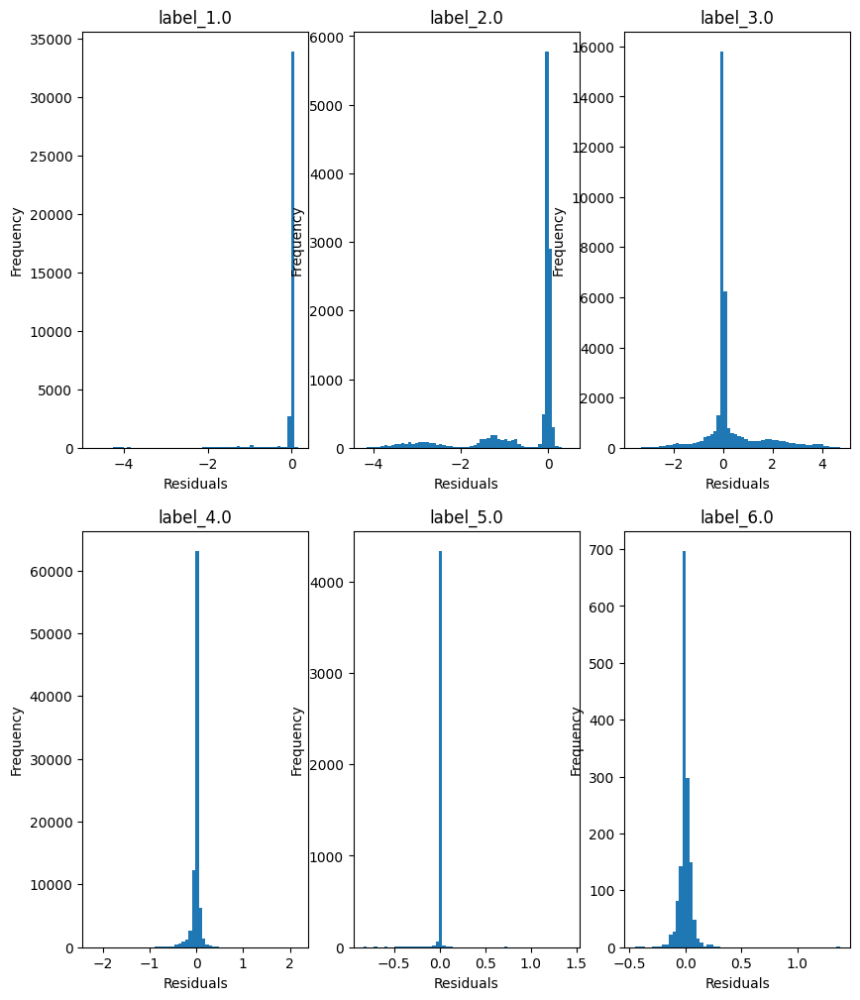

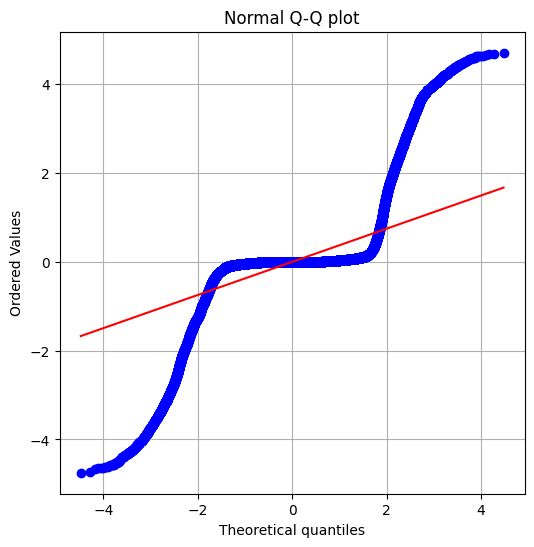

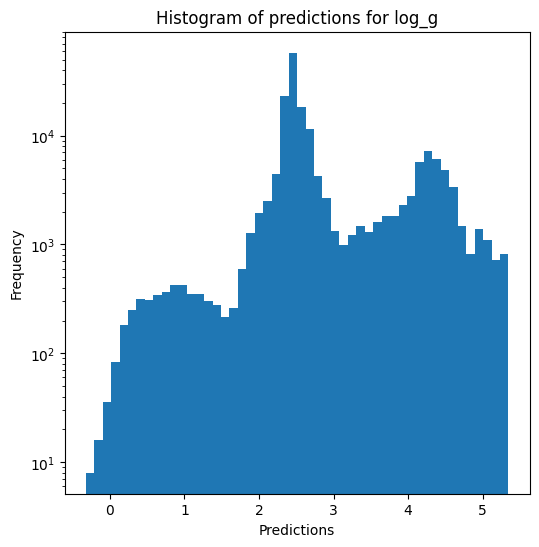

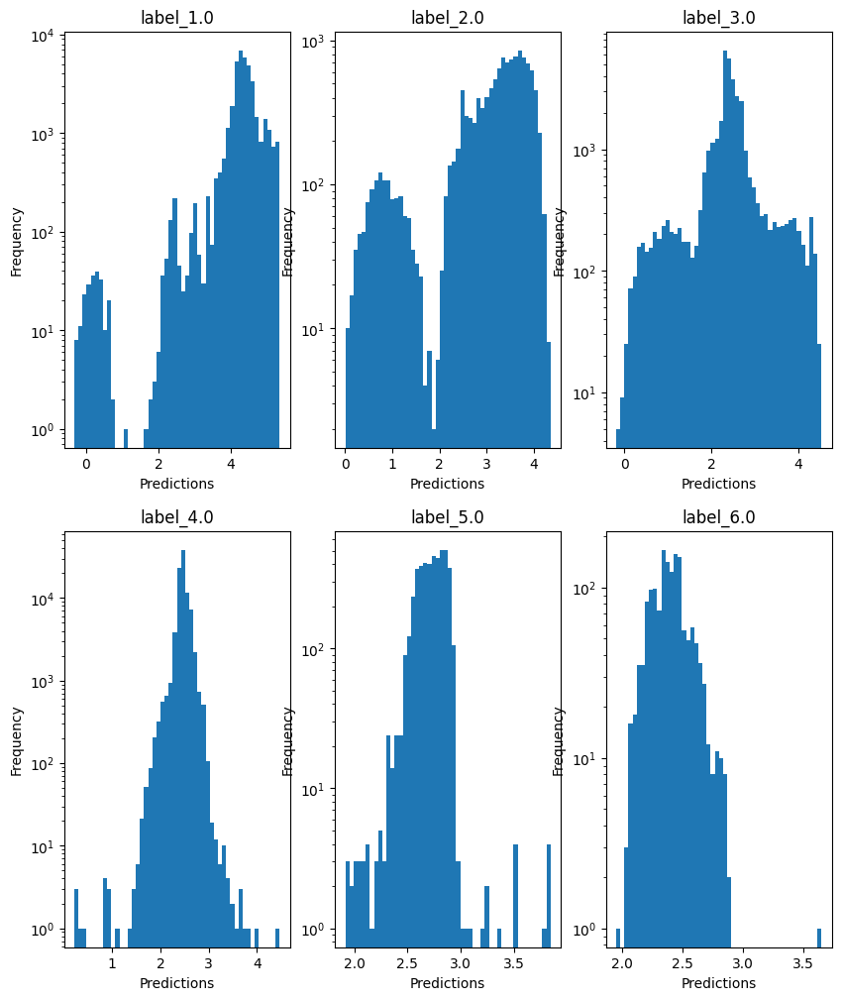

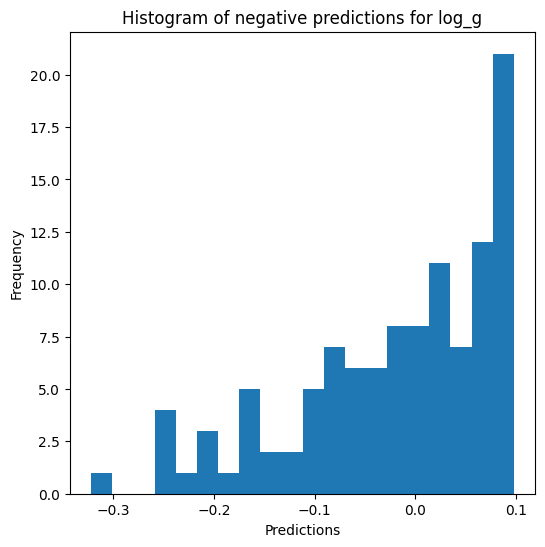

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\numpy\lib\_function_base_impl.py:4671: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)



radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 0.7228806106869394
  RVE :  0.5692154631580525
  RMSE :  0.2002492504816667
  MAE :  0.03698449906826638
  MedAE :  0.0004485157721801081
  CORR :  0.841483379572012
  MAX_ER :  2.3751855303079865
  Percentiles : 
    75th percentile :  0.002327830203710024
    90th percentile :  0.011444429203981699
    95th percentile :  0.0341169537626877
    99th percentile :  0.9722009136954167

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 1.2289134059946882
  RVE :  -2.732952353195582
  RMSE :  0.5231844849065922
  MAE :  0.23789707005160315
  MedAE :  0.01610977354066312
  CORR :  0.09611120123386492
  MAX_ER :  2.108165755165133
  Percentiles : 
    75th percentile :  0.0671170104202343
    90th percentile :  0.8592353717677005
    95th percentile :  1.4830744340702935
    99th percentile :  1.8022902363520805

radius results for the label category

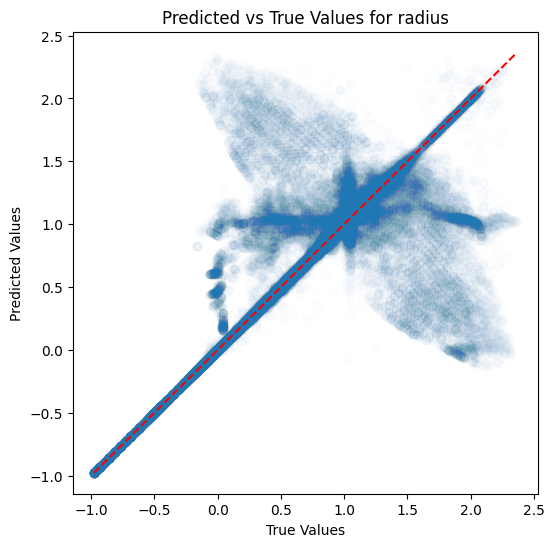

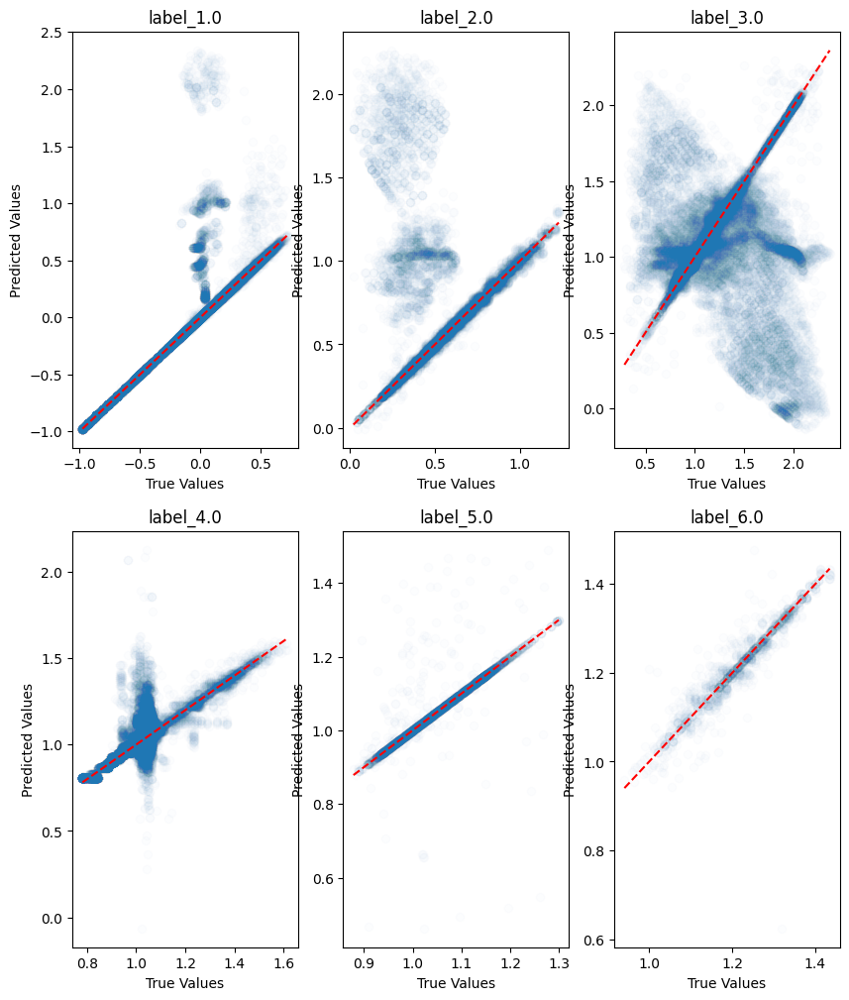

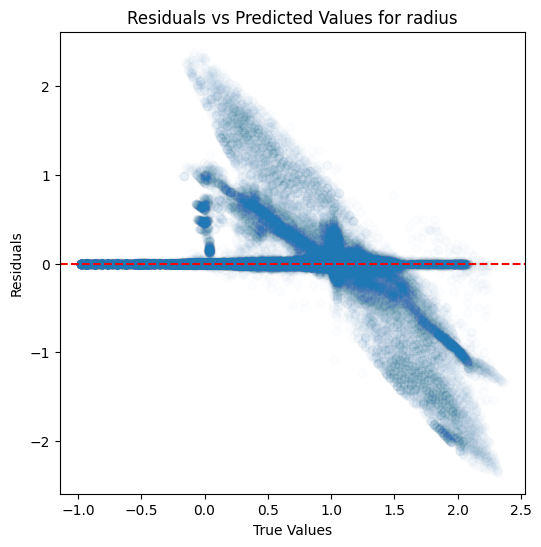

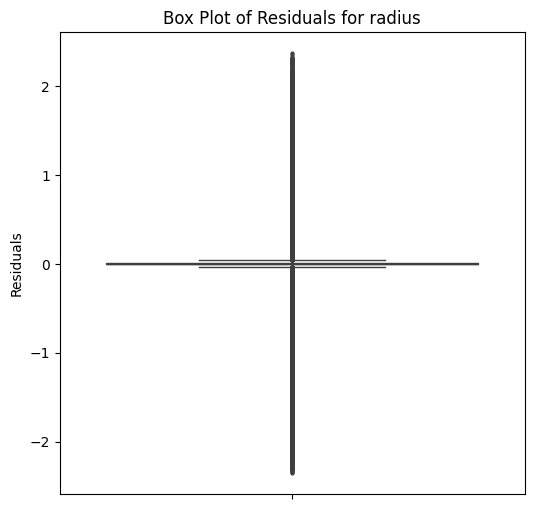

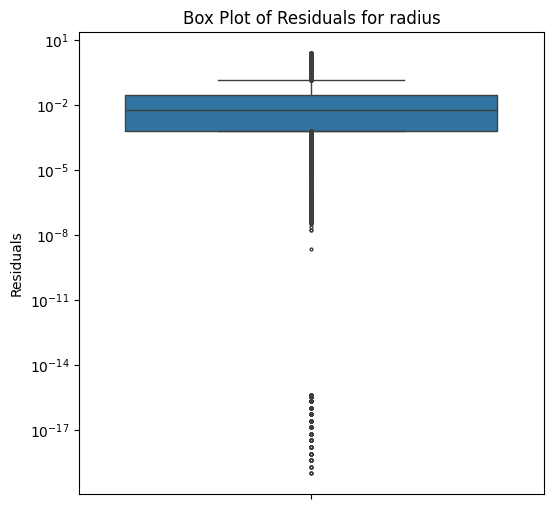

...

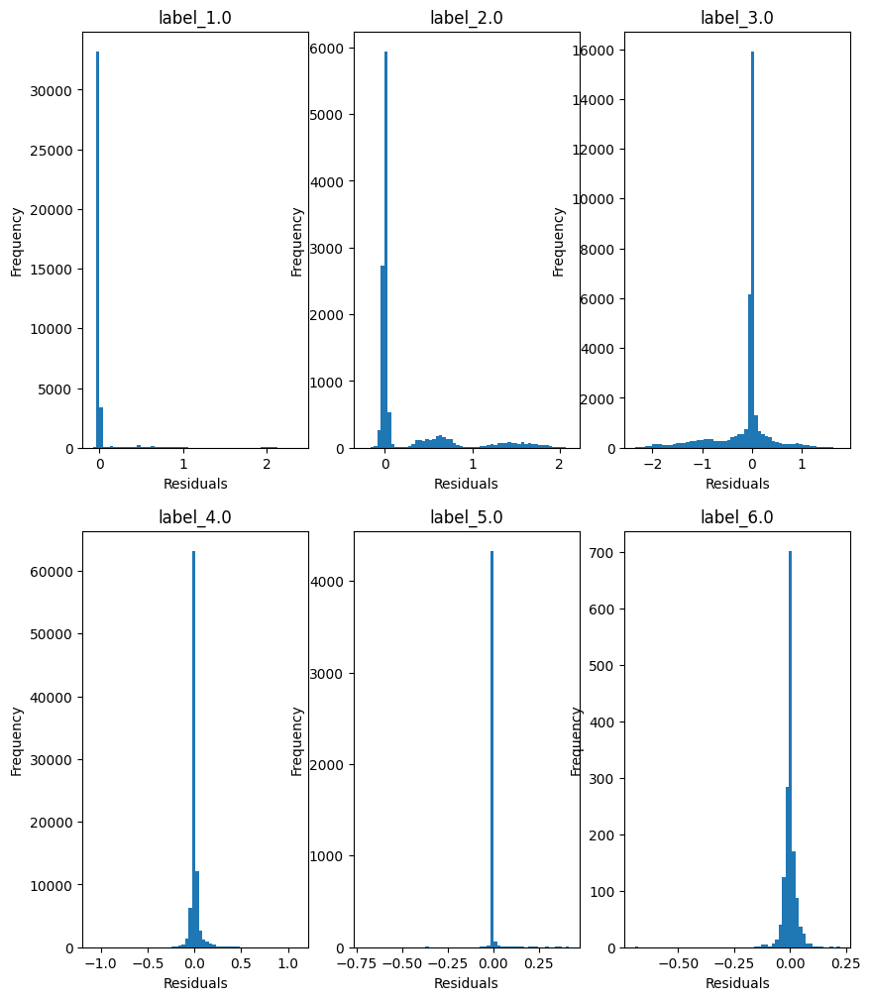

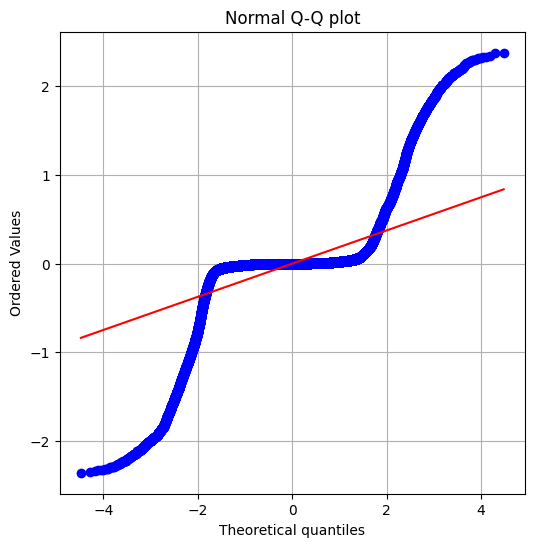

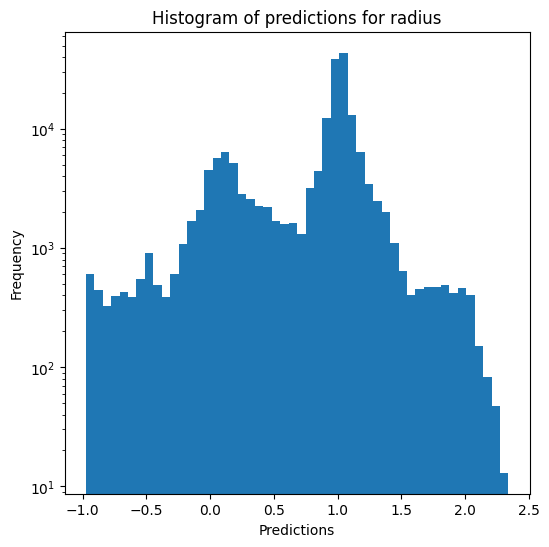

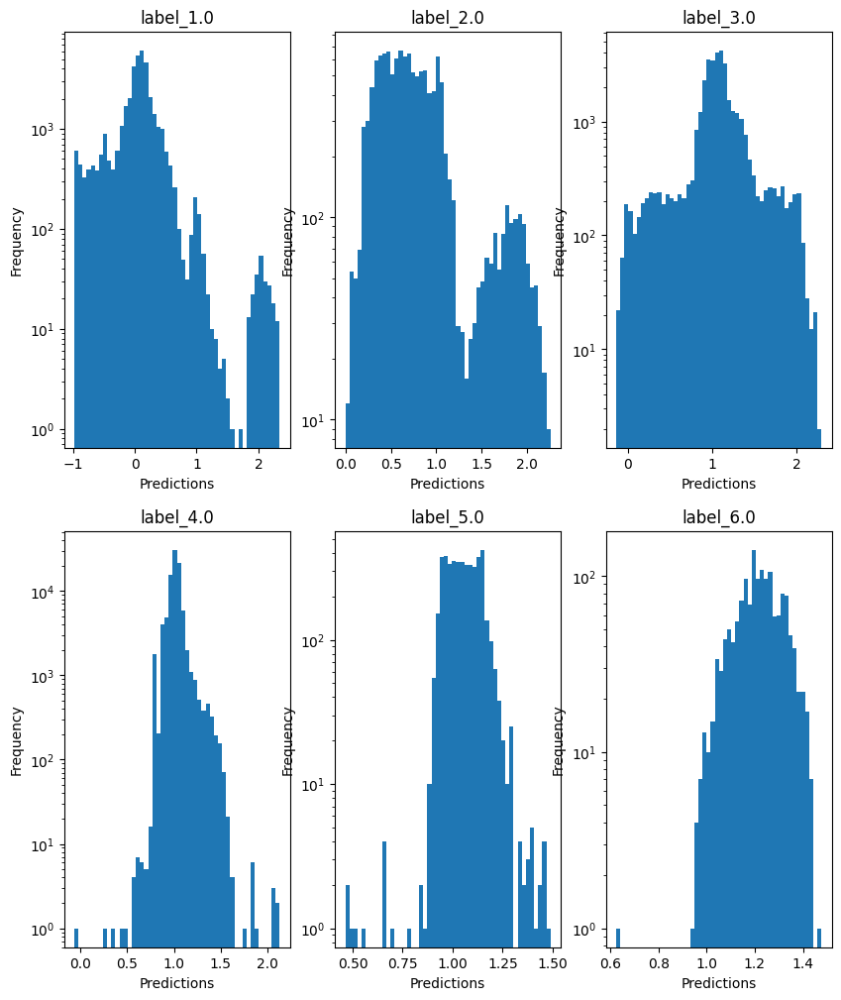

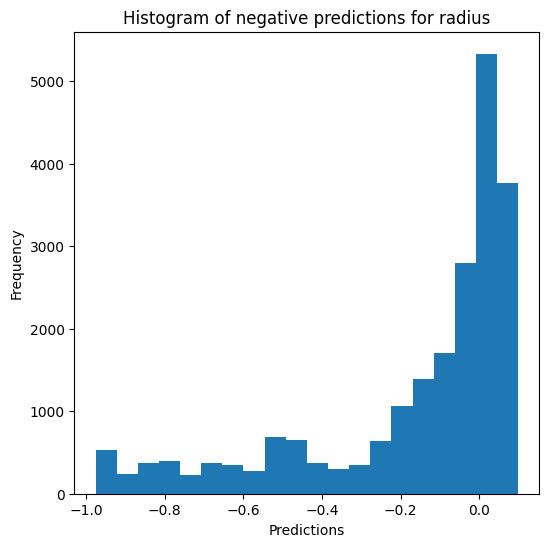

Saving results...


In [16]:
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show)

### K-nearest neighbours

In [17]:
knn_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.1907
  RVE :  0.9782428408568564
  RMSE :  0.02416811908066164
  MAE :  0.009073475638292344
  MedAE :  0.0018599999999997507
  CORR :  0.9892128560826348
  MAX_ER :  0.4295
  Percentiles : 
    75th percentile :  0.006479999999999819
    90th percentile :  0.02524000000000055
    95th percentile :  0.044079999999999675
    99th percentile :  0.11518040000000014

T_eff results for the label category with a value of 2.0
  value range :  3.6813 - 4.1397
  RVE :  0.7699945838955977
  RMSE :  0.051237771238936095
  MAE :  0.034125246006389776
  MedAE :  0.01910999999999996
  CORR :  0.9309697248307426
  MAX_ER :  0.2595200000000002
  Percentiles : 
    75th percentile :  0.047325000000000395
    90th percentile :  0.09140000000000059
    95th percentile :  0.11968300000000061
    99th percentile :  0.16174599999999997

T_eff results

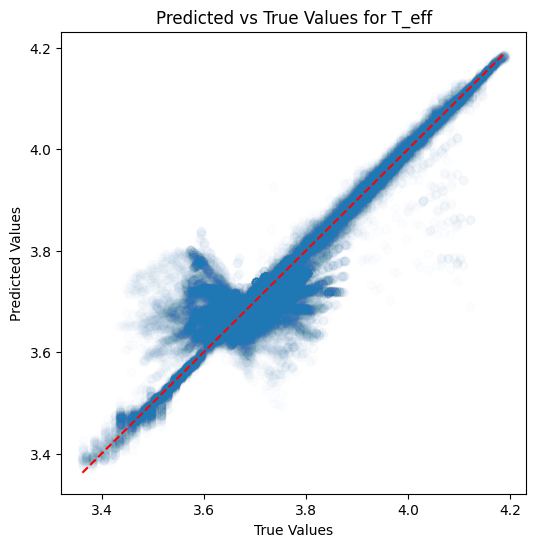

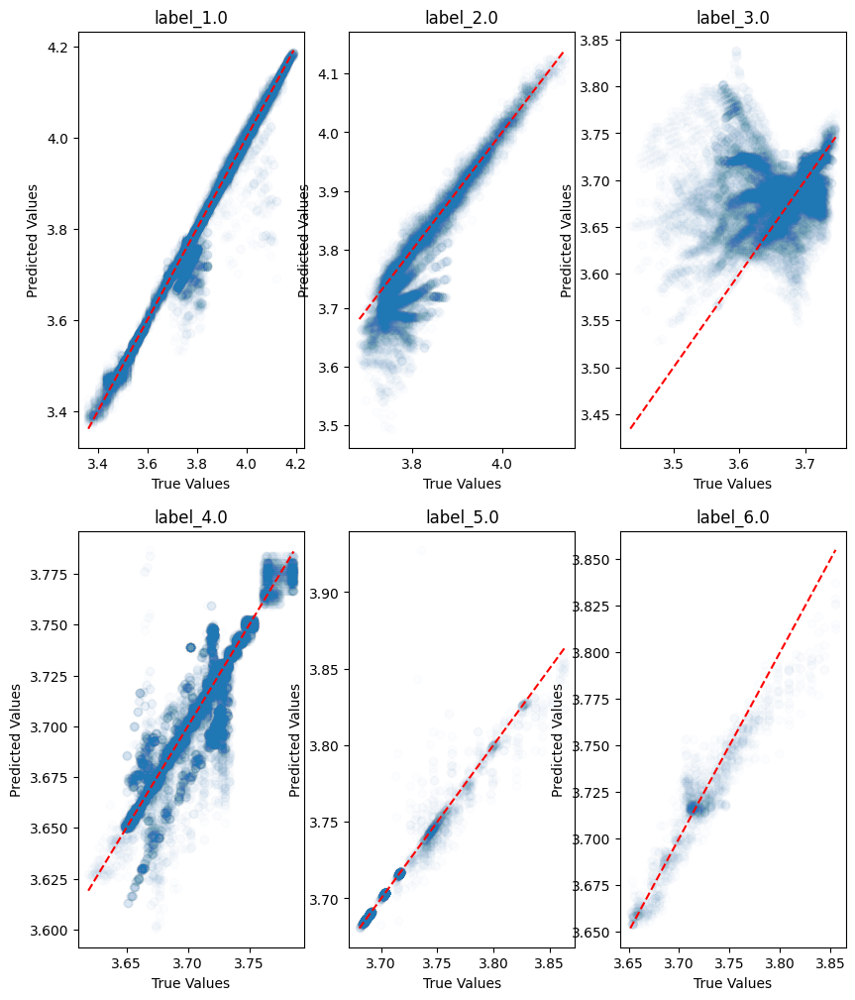

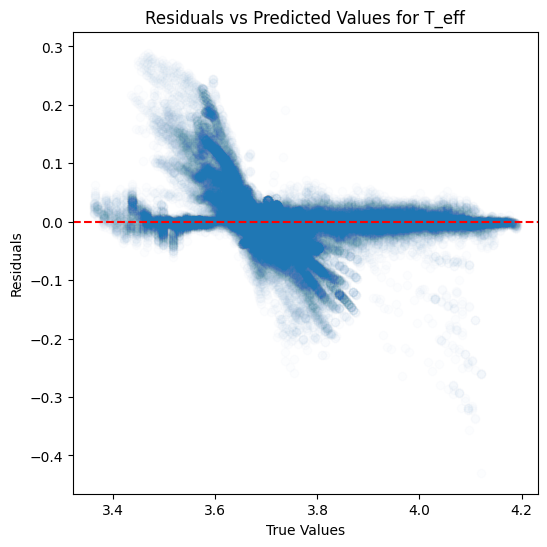

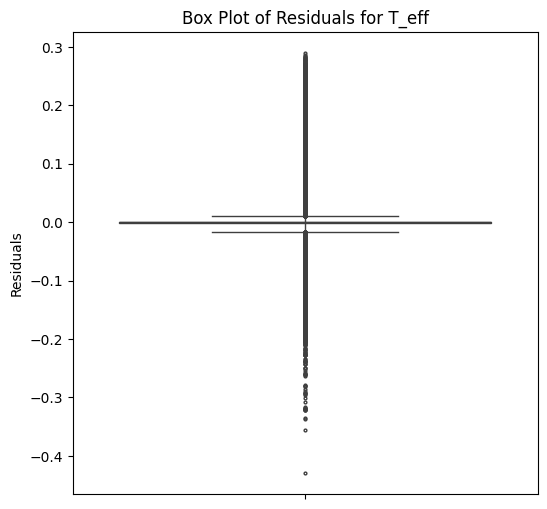

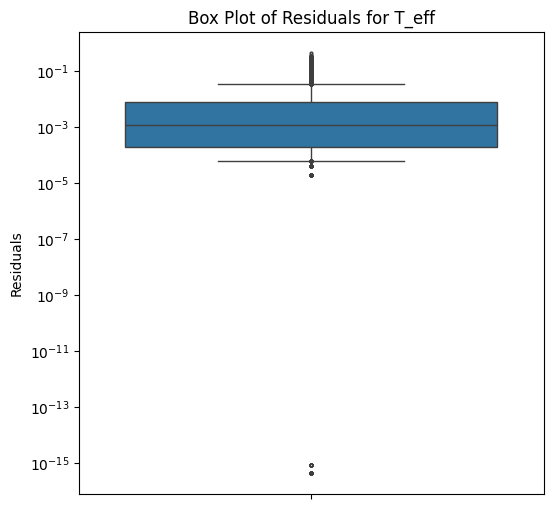

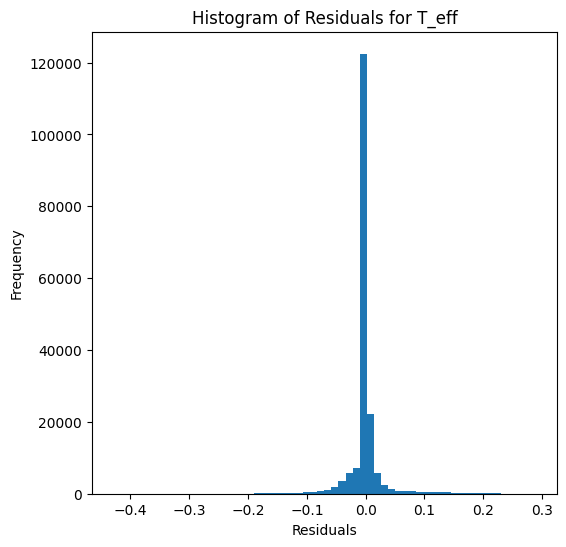

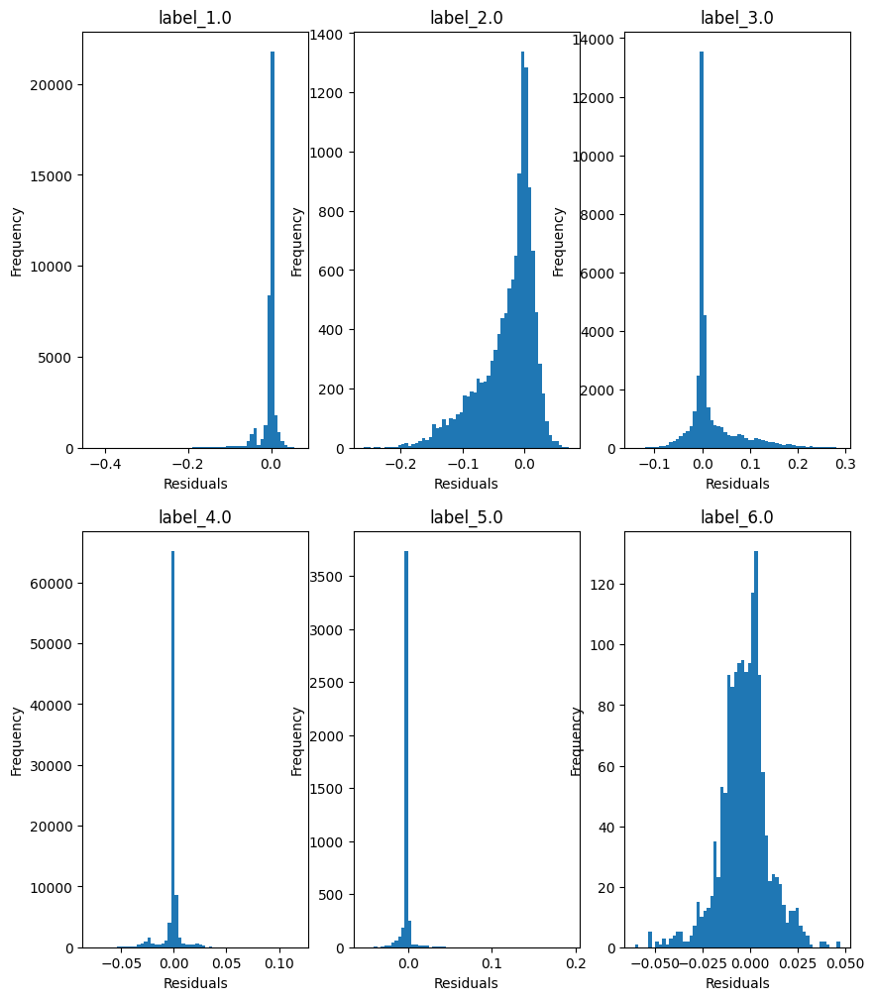

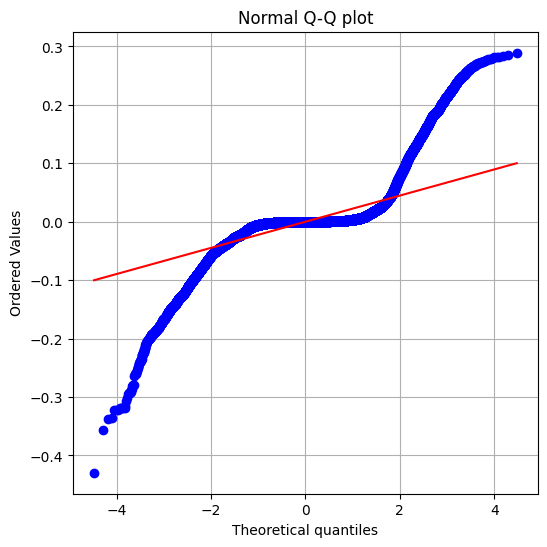

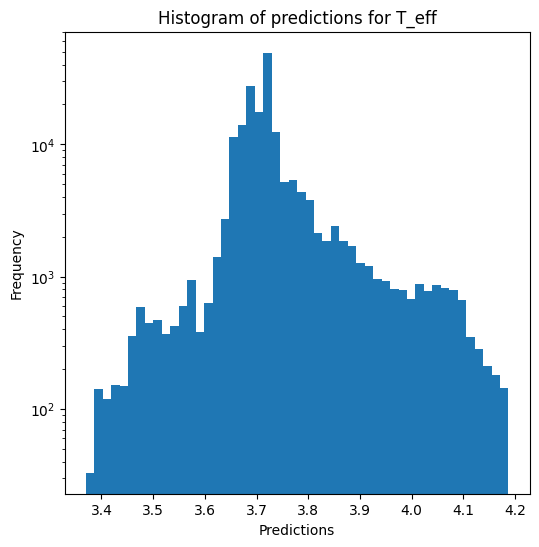

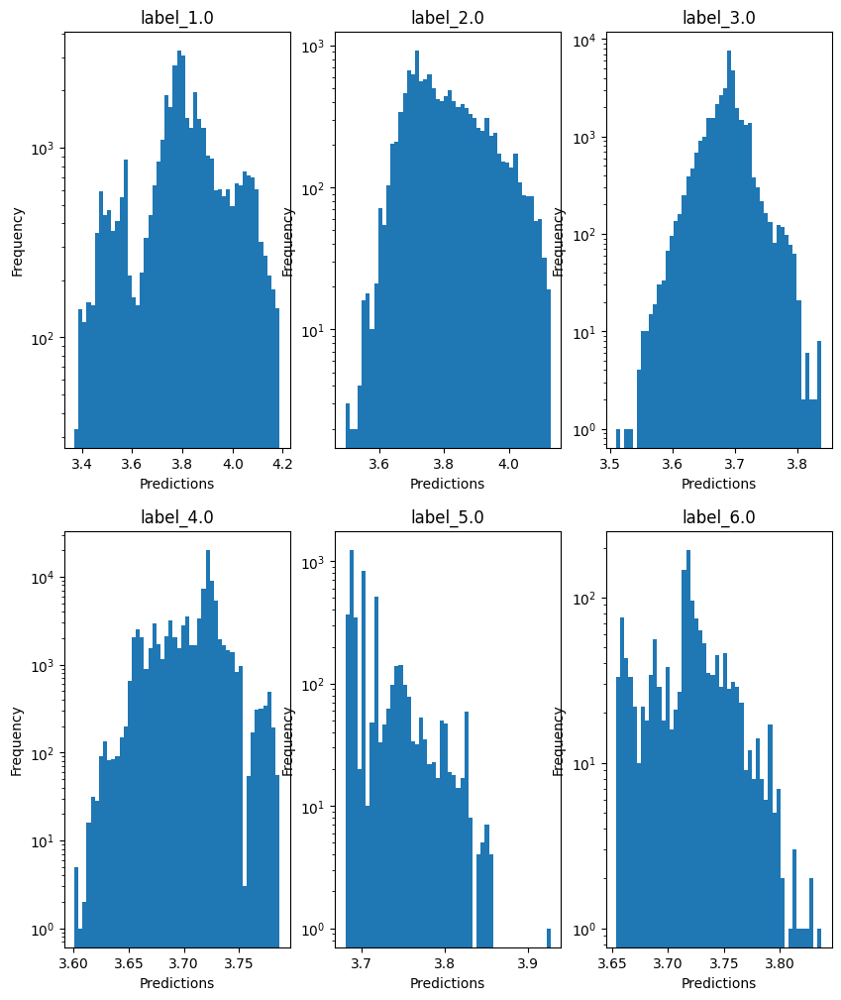

no negative values

log_g results for the label category with a value of 1.0
  value range :  3.465 - 5.345
  RVE :  -0.21372743099124003
  RMSE :  0.3684311737170496
  MAE :  0.10335706411523063
  MedAE :  0.005199999999999427
  CORR :  0.7127792459877859
  MAX_ER :  4.341399999999999
  Percentiles : 
    75th percentile :  0.018799999999999706
    90th percentile :  0.0680000000000005
    95th percentile :  0.7935999999999996
    99th percentile :  1.8969159999999976

log_g results for the label category with a value of 2.0
  value range :  2.456 - 4.299
  RVE :  -2.5068845861149858
  RMSE :  0.8098841803265027
  MAE :  0.4724216773162939
  MedAE :  0.07390000000000008
  CORR :  0.05468711496212319
  MAX_ER :  3.9967999999999995
  Percentiles : 
    75th percentile :  0.91525
    90th percentile :  1.3874
    95th percentile :  1.8043499999999981
    99th percentile :  2.7110699999999968

log_g results for the label category with a value of 3.0
  value range :  -0.384 - 3.823
  RVE :

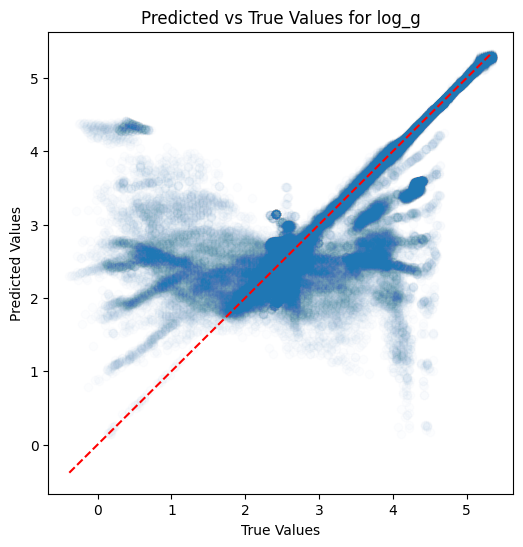

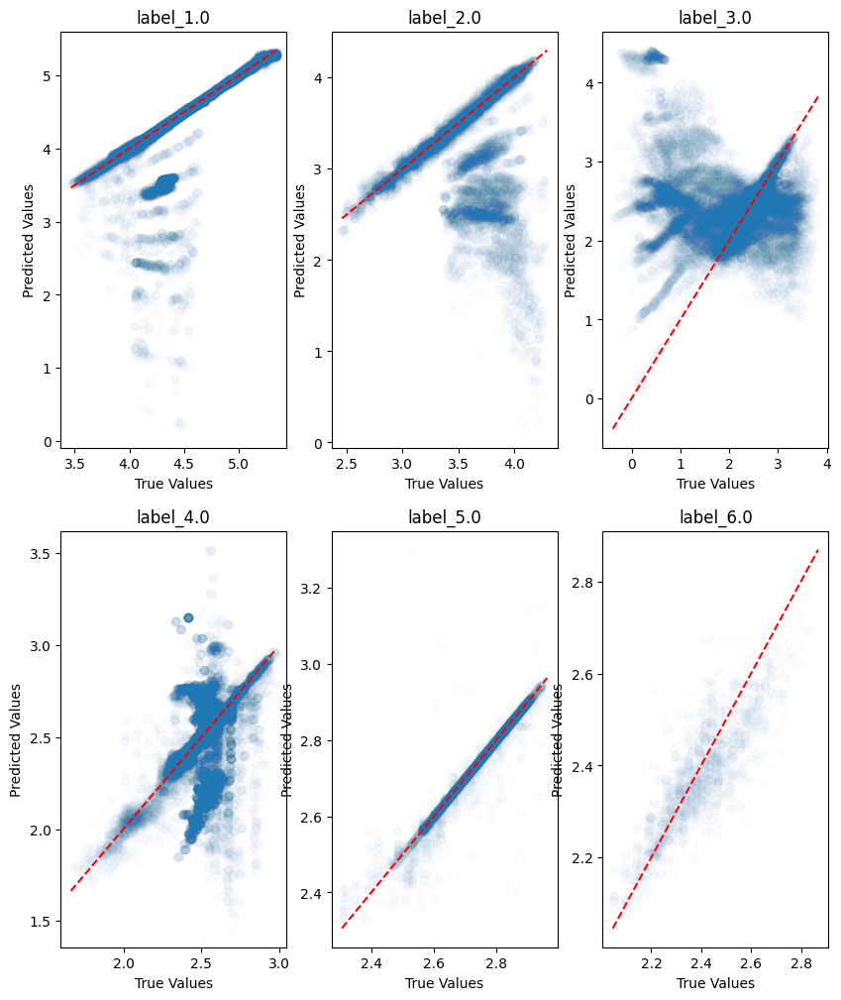

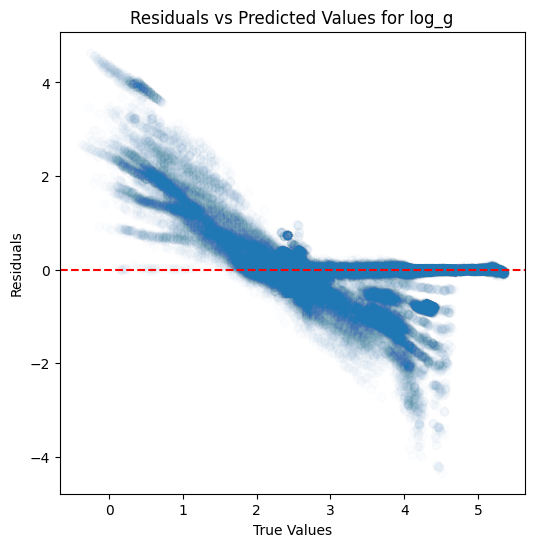

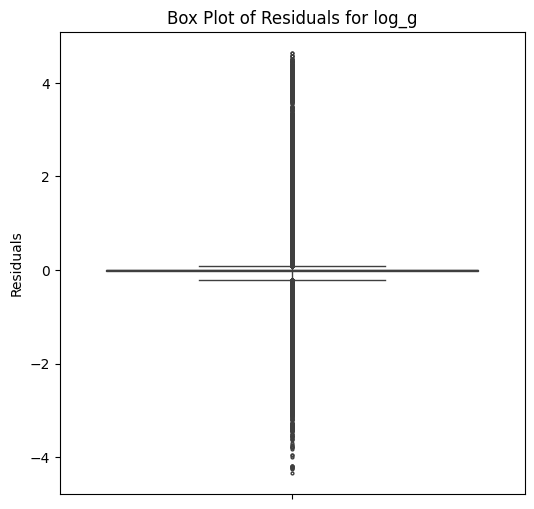

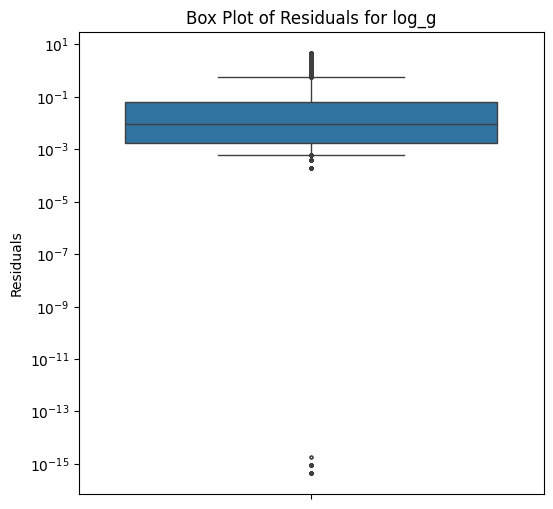

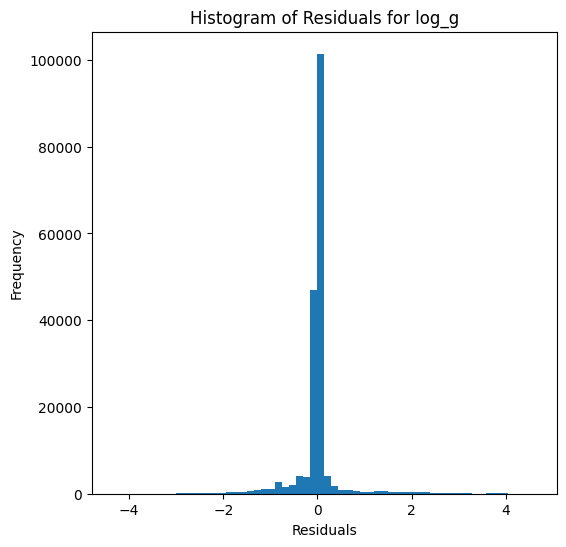

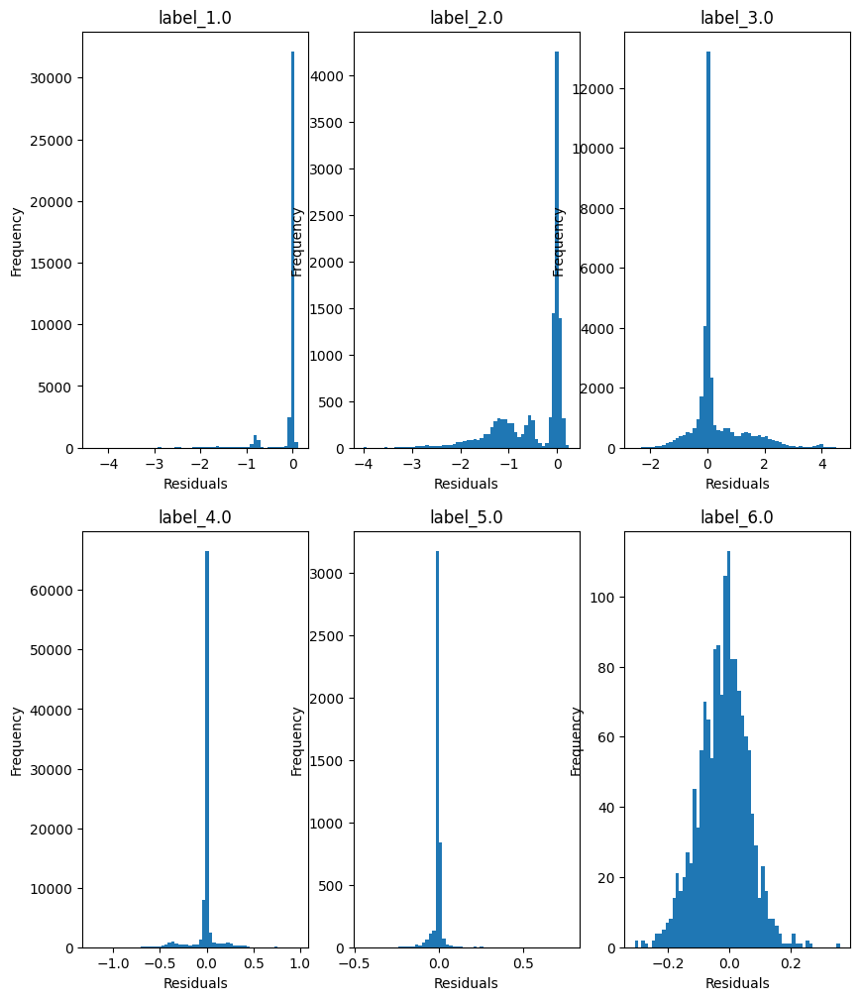

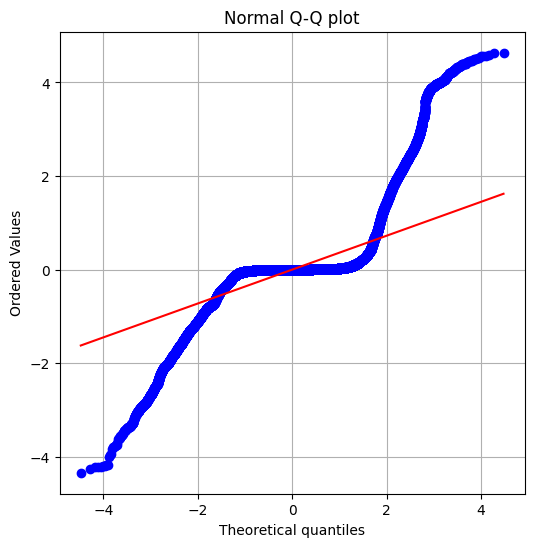

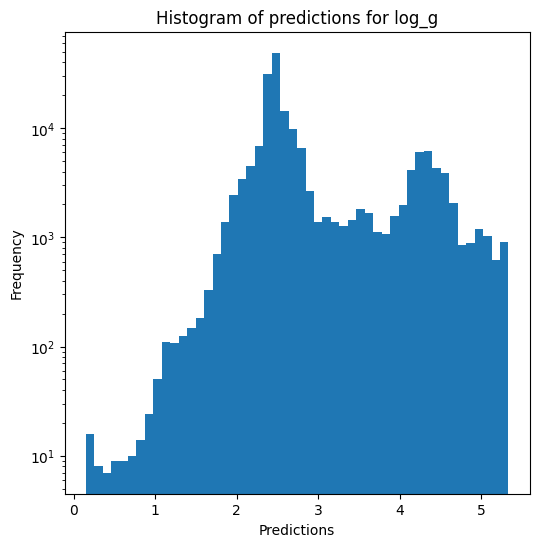

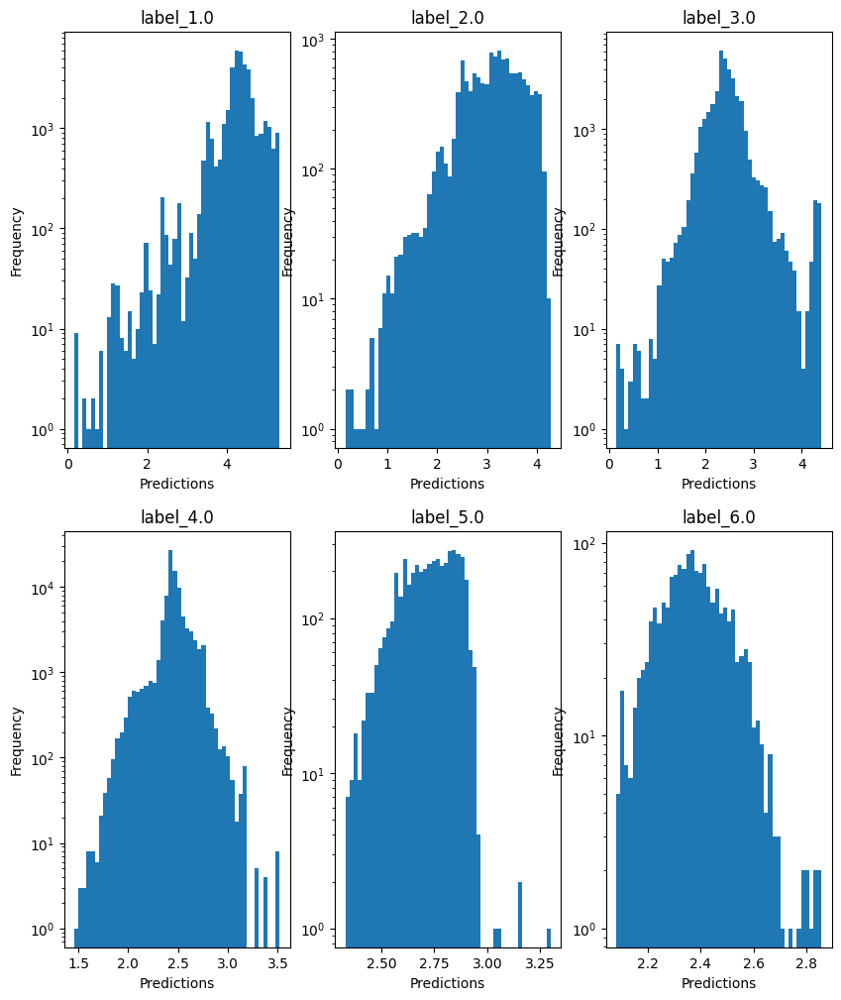


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 0.7228806106869394
  RVE :  0.6478433146027724
  RMSE :  0.18466113789326627
  MAE :  0.054267388740391186
  MedAE :  0.004012748495691439
  CORR :  0.8655486583798956
  MAX_ER :  2.170880800930863
  Percentiles : 
    75th percentile :  0.013907854575656214
    90th percentile :  0.05476624447713824
    95th percentile :  0.39700171302841575
    99th percentile :  0.948181511461603

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 1.2289134059946882
  RVE :  -0.9202566498577154
  RMSE :  0.4049513691727813
  MAE :  0.23628660939138874
  MedAE :  0.037053589010871024
  CORR :  0.14686392564473957
  MAX_ER :  1.9979948798223217
  Percentiles : 
    75th percentile :  0.45759577267987267
    90th percentile :  0.693052792038279
    95th percentile :  0.9024737415912908
    99th percentile :  1.355215664164705

radius results for the label catego

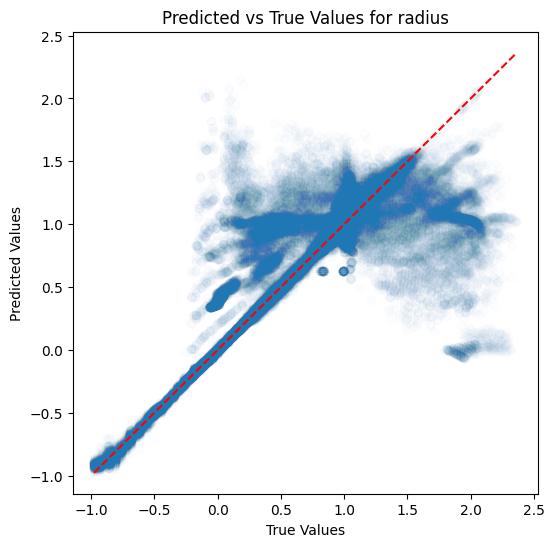

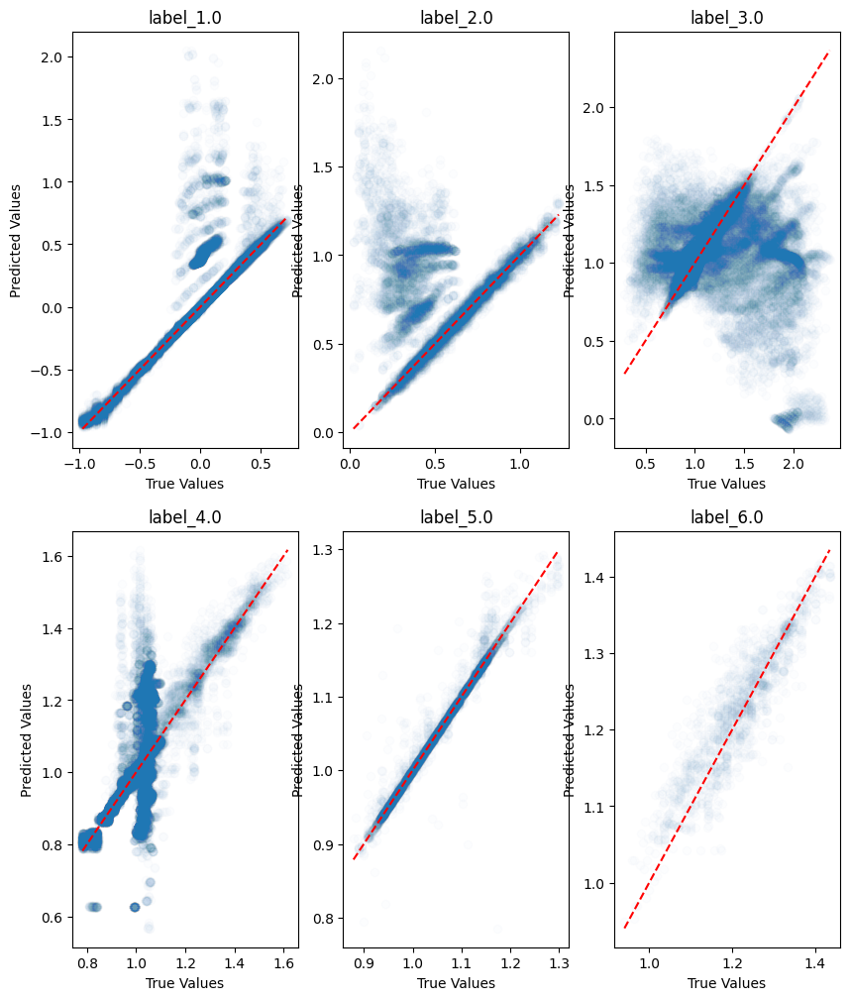

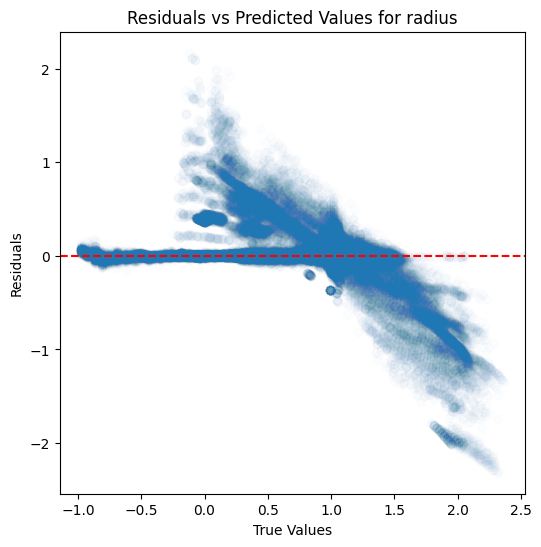

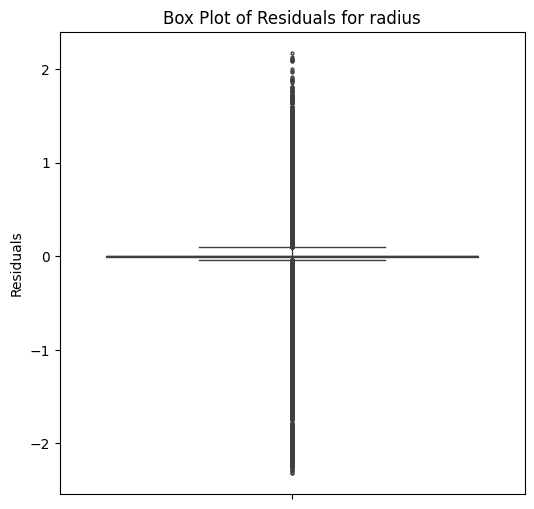

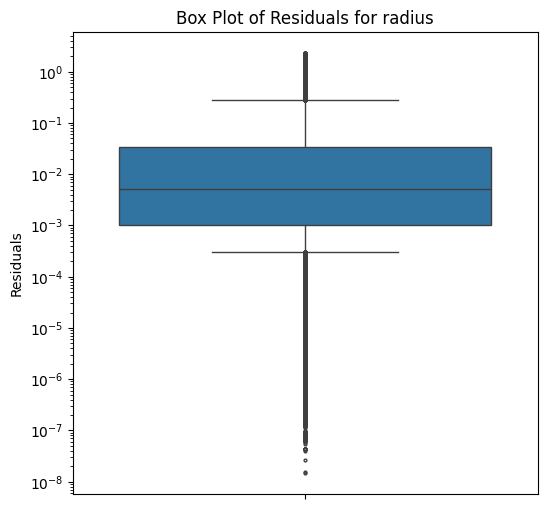

...

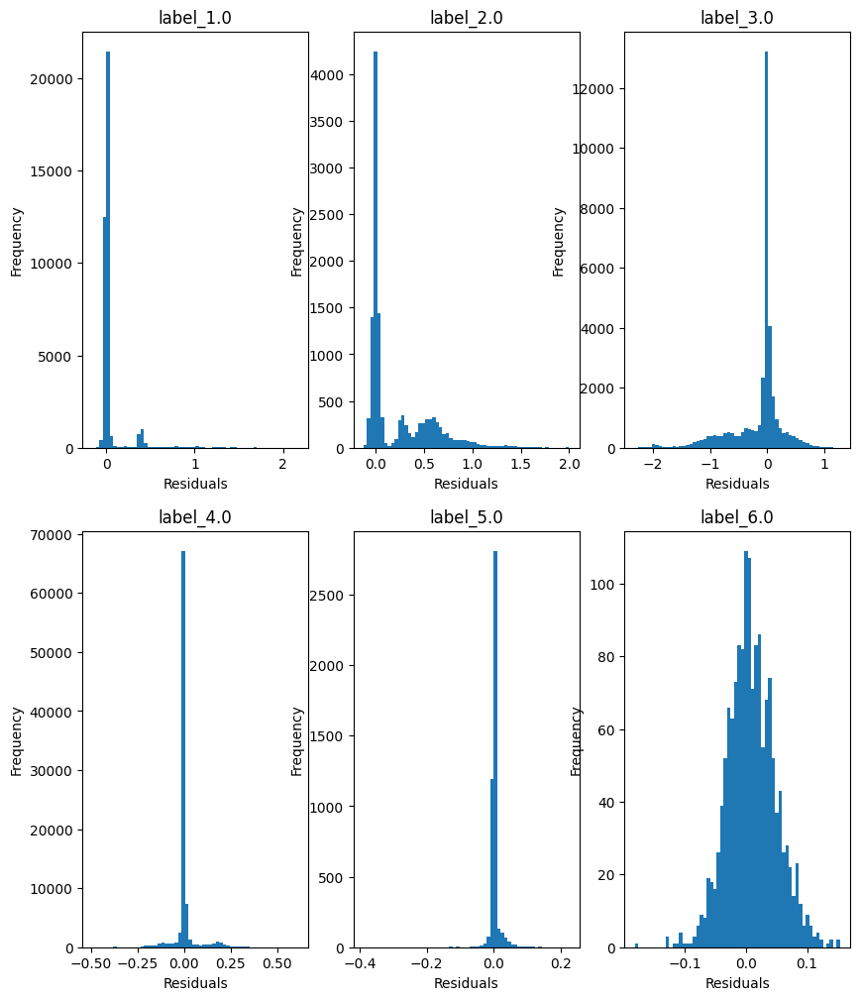

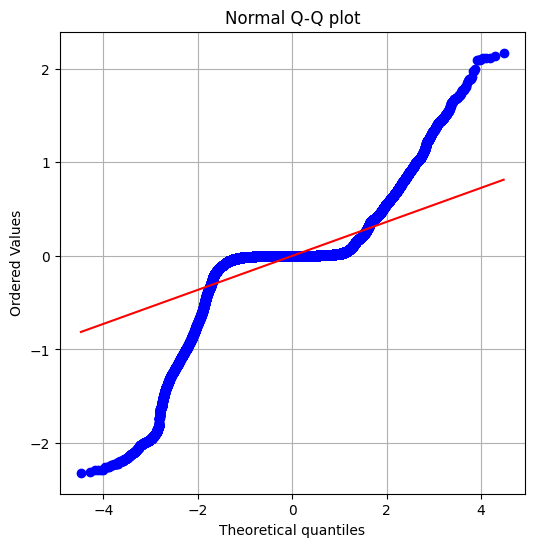

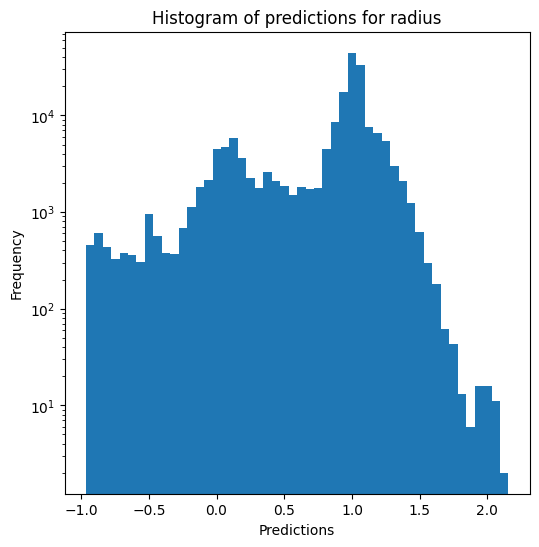

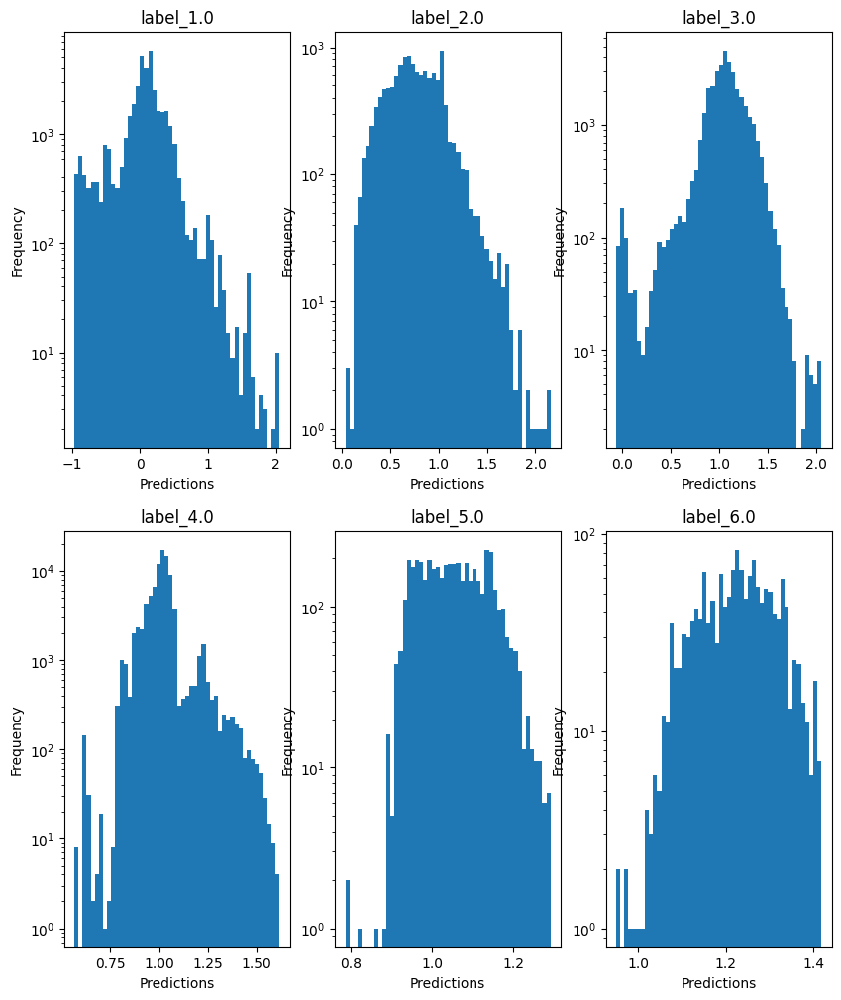

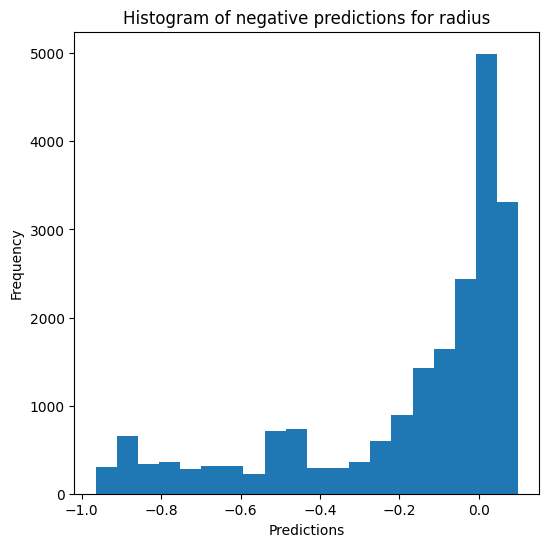

Saving results...


In [18]:
knn_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show)

### Random forests

In [19]:
rf_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.1907
  RVE :  0.9843920547198056
  RMSE :  0.02044262538990222
  MAE :  0.005841865256728682
  MedAE :  0.00015898809523351431
  CORR :  0.9923334481253897
  MAX_ER :  0.24687900000000074
  Percentiles : 
    75th percentile :  0.0021822589285701577
    90th percentile :  0.010832770476184188
    95th percentile :  0.031866533033634244
    99th percentile :  0.10912342659368306

T_eff results for the label category with a value of 2.0
  value range :  3.6813 - 4.1397
  RVE :  0.7442416030826616
  RMSE :  0.05247428964475242
  MAE :  0.03089406866793464
  MedAE :  0.012408954761905067
  CORR :  0.9269223296620183
  MAX_ER :  0.24106511991869795
  Percentiles : 
    75th percentile :  0.036357384523810654
    90th percentile :  0.09812258496225744
    95th percentile :  0.13040631547619036
    99th percentile :  0.1823522949999955

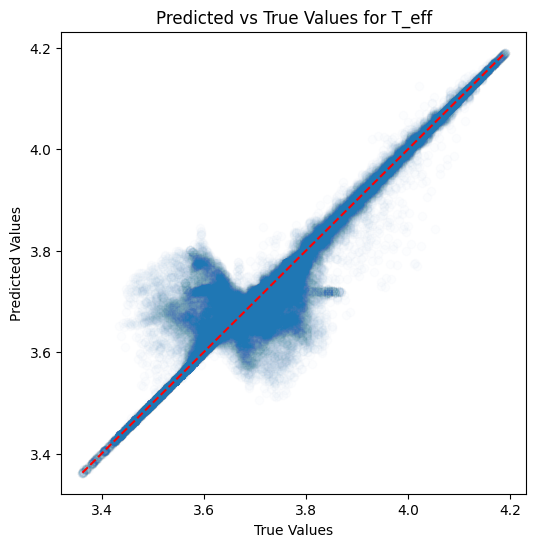

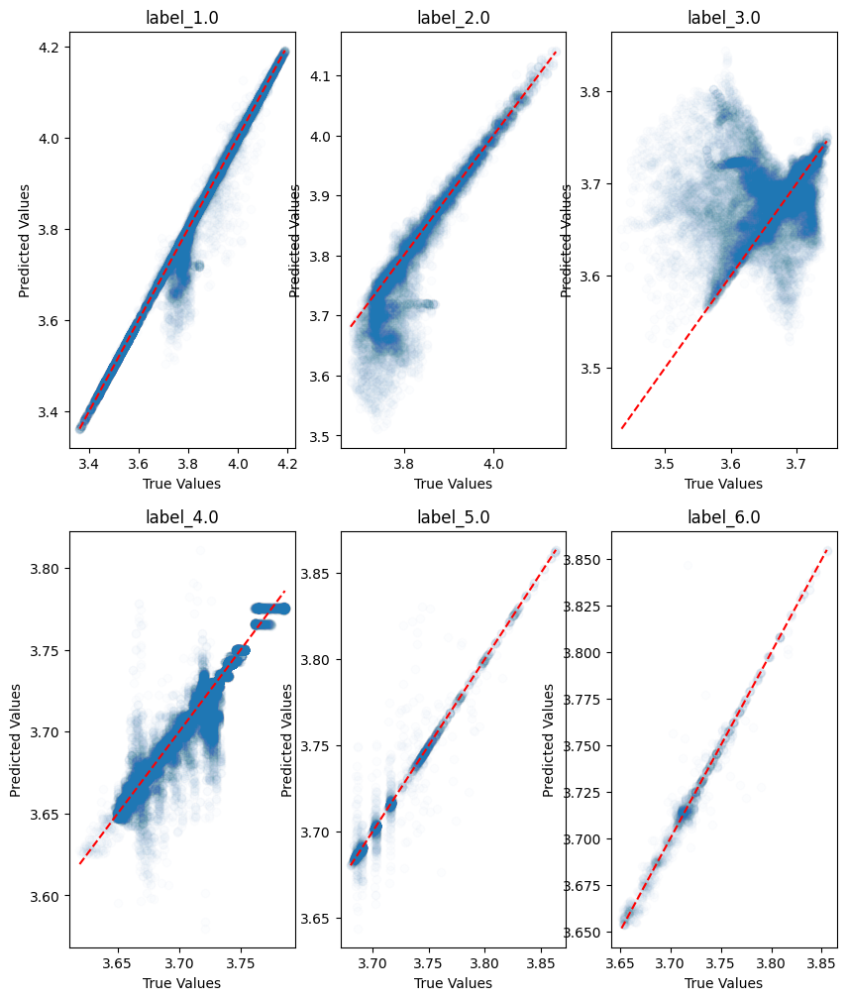

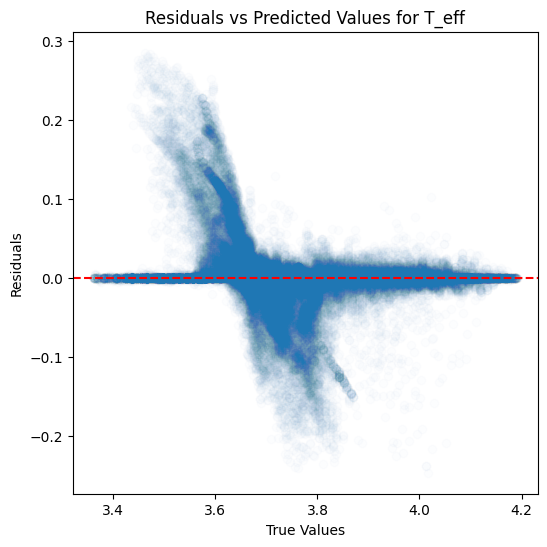

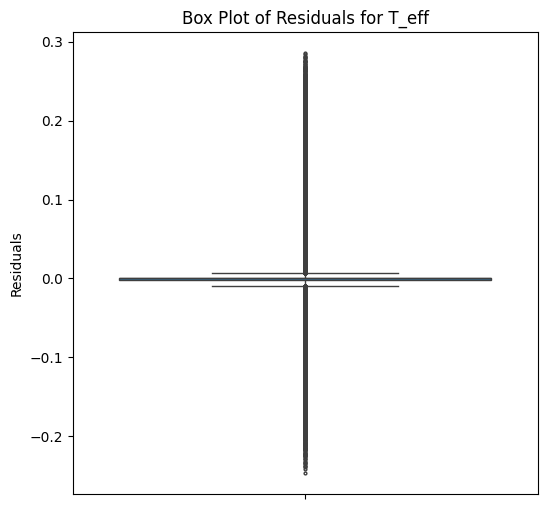

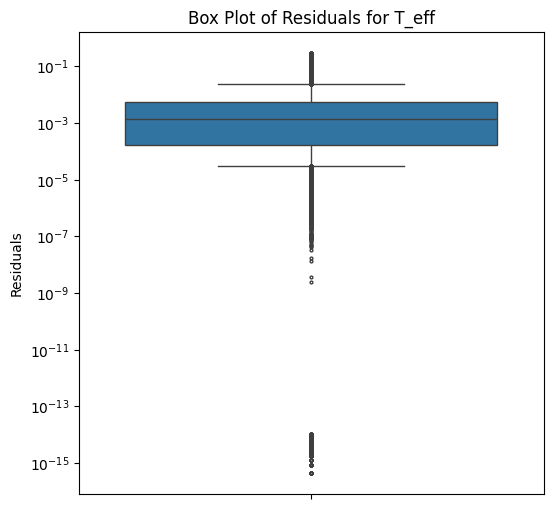

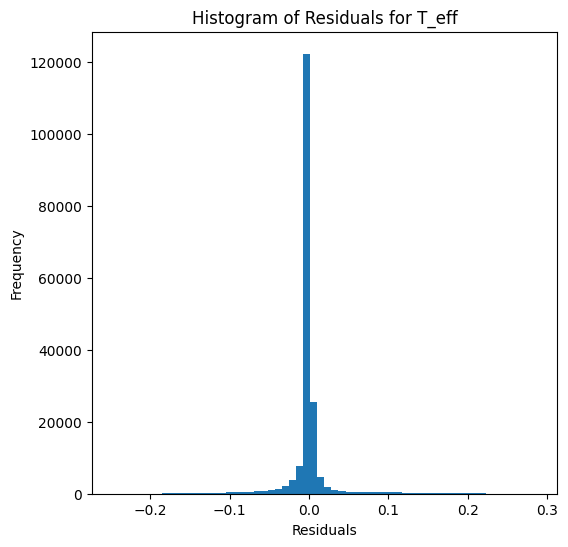

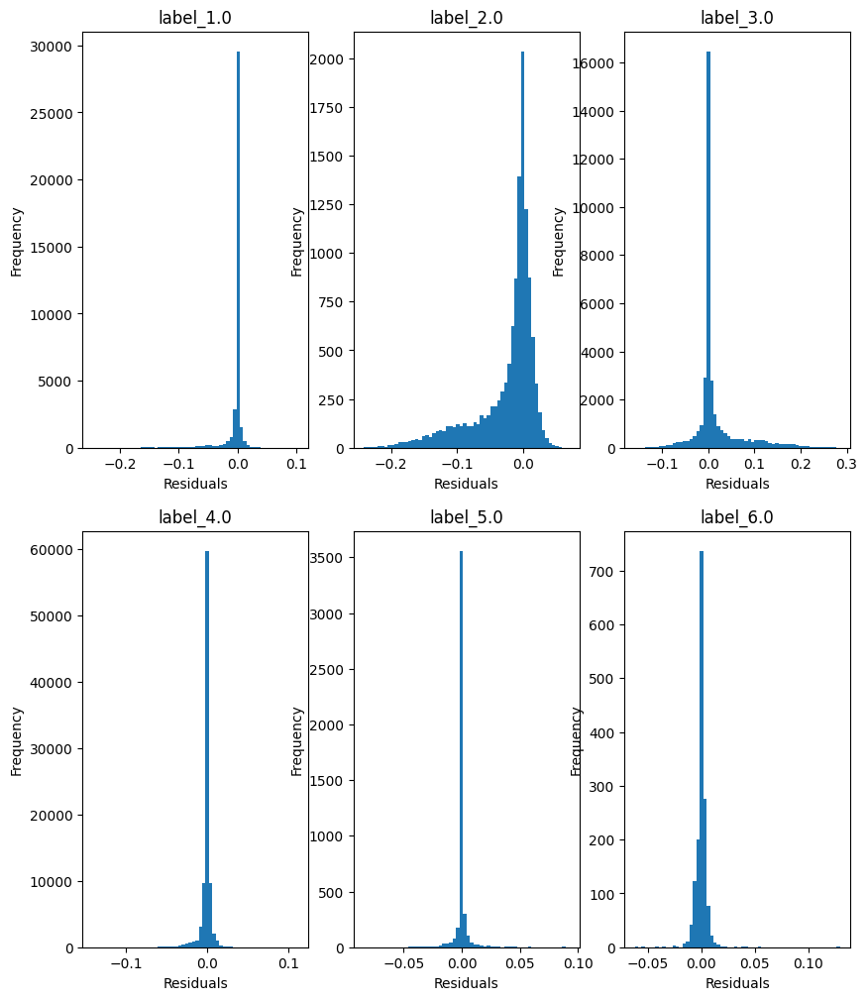

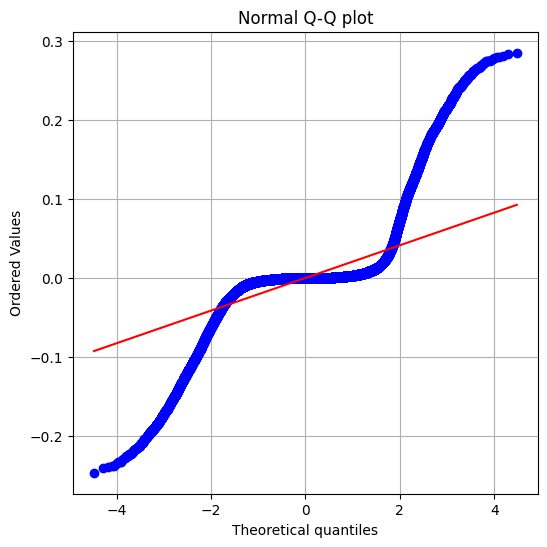

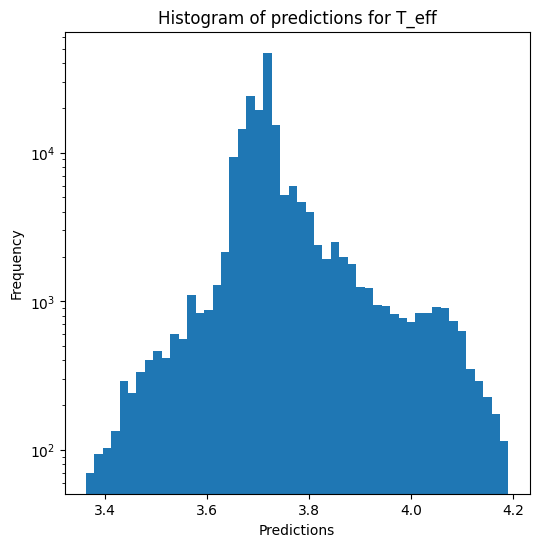

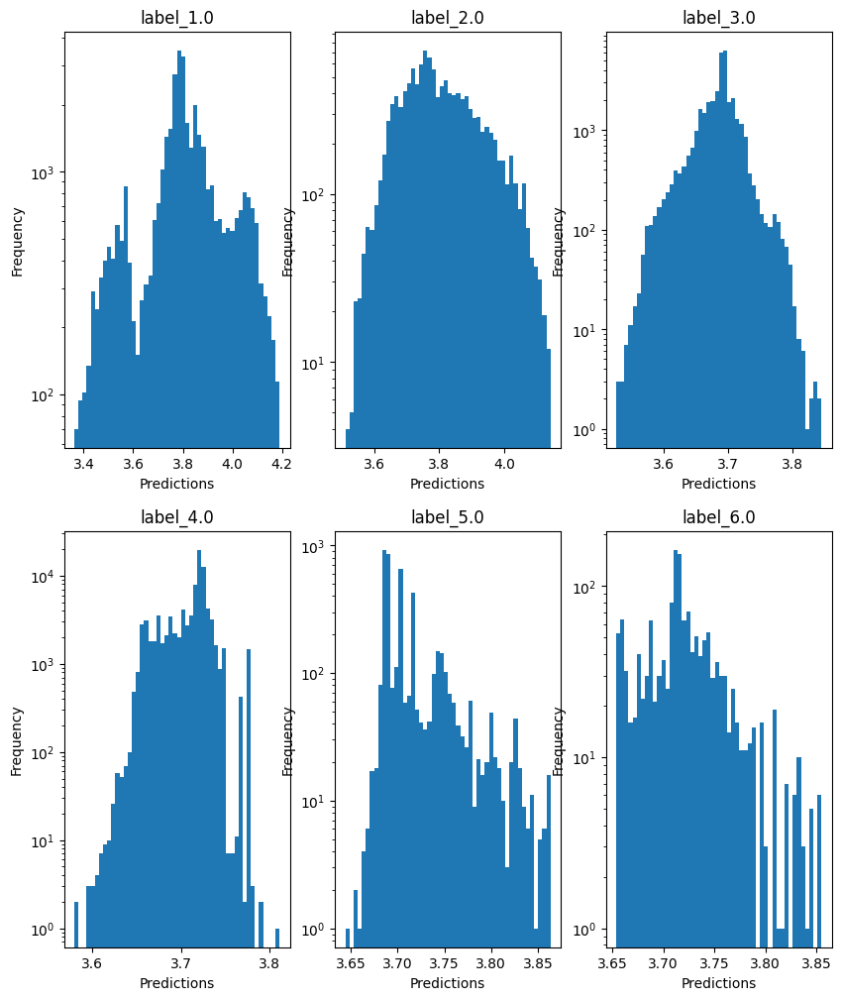

no negative values

log_g results for the label category with a value of 1.0
  value range :  3.465 - 5.345
  RVE :  -0.011329182377379121
  RMSE :  0.33344741344998047
  MAE :  0.0779484265301924
  MedAE :  0.0009199999999998099
  CORR :  0.7416104362495699
  MAX_ER :  4.061556465099716
  Percentiles : 
    75th percentile :  0.005429999999996715
    90th percentile :  0.06491818809523921
    95th percentile :  0.42354805000000073
    99th percentile :  1.798591235169478

log_g results for the label category with a value of 2.0
  value range :  2.456 - 4.299
  RVE :  -3.2568541084898603
  RMSE :  0.8598902436974643
  MAE :  0.44883480568115963
  MedAE :  0.051811014568760694
  CORR :  0.09053666406842789
  MAX_ER :  3.747
  Percentiles : 
    75th percentile :  0.6744863273809519
    90th percentile :  1.61413529825971
    95th percentile :  2.2009593249999995
    99th percentile :  2.8802929999999973

log_g results for the label category with a value of 3.0
  value range :  -0.384 - 

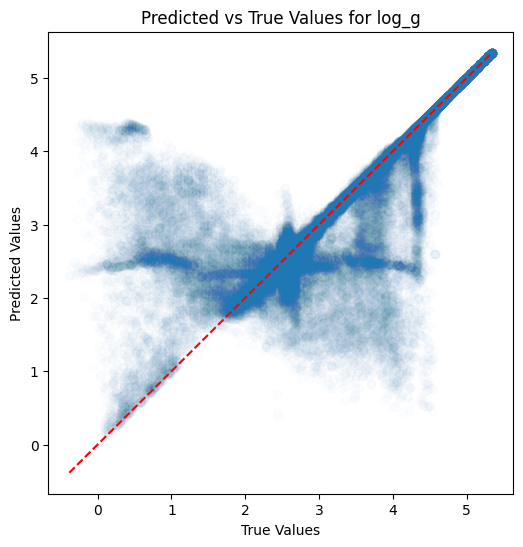

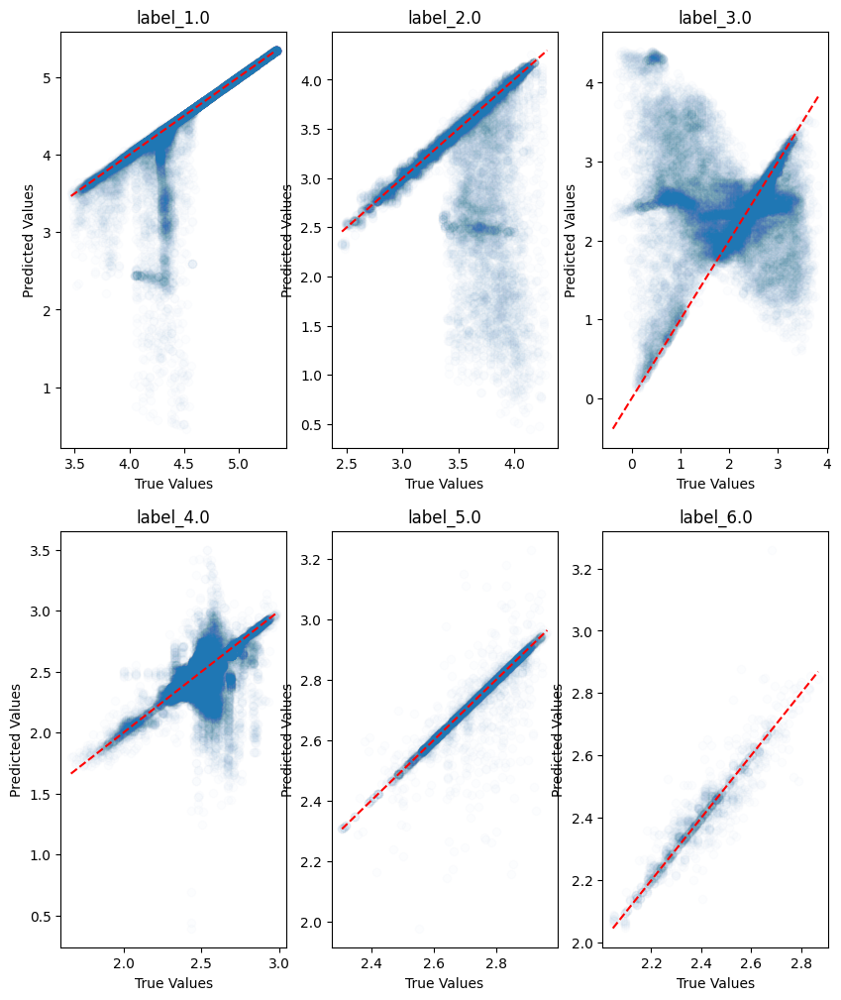

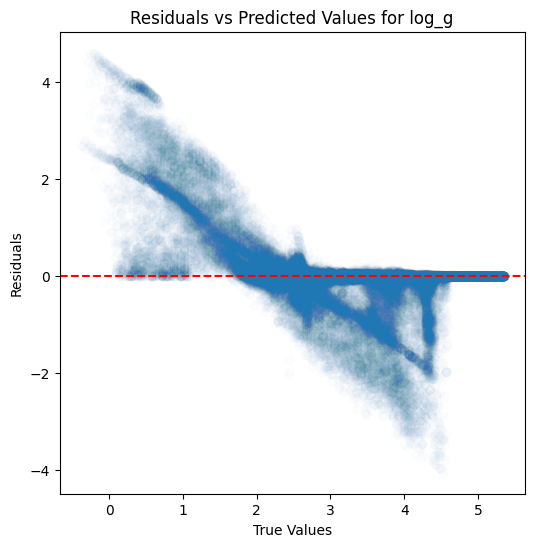

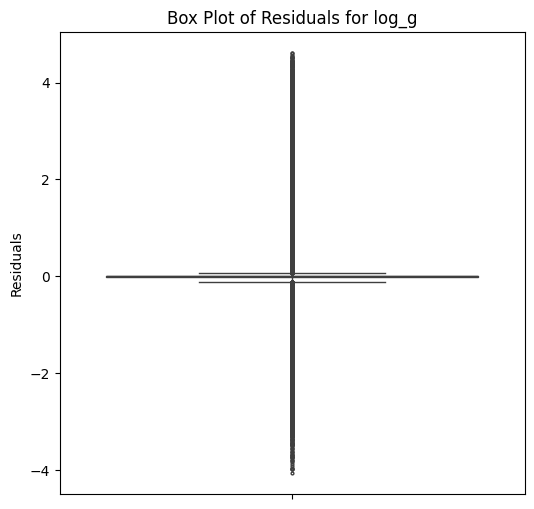

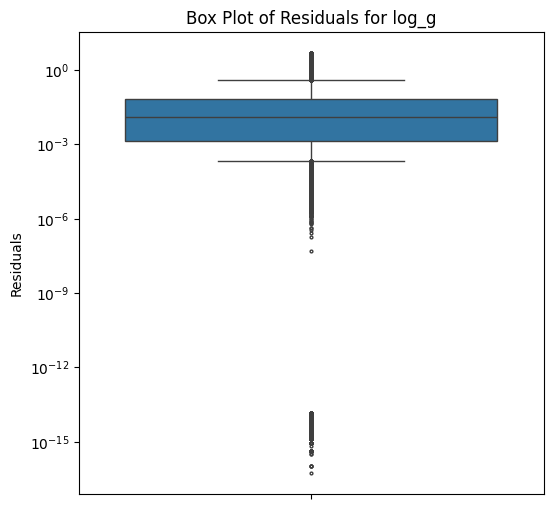

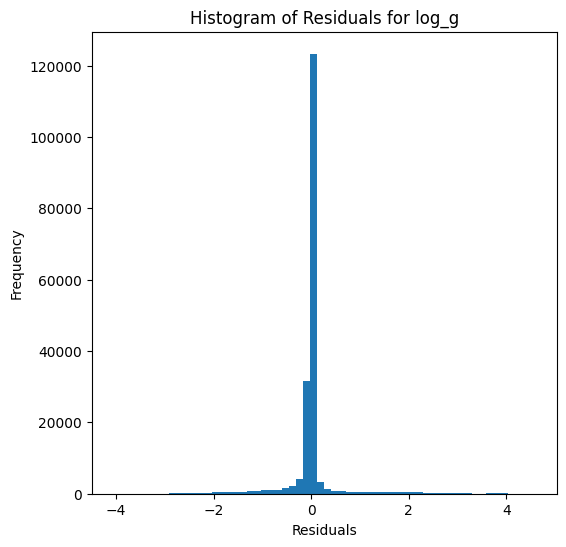

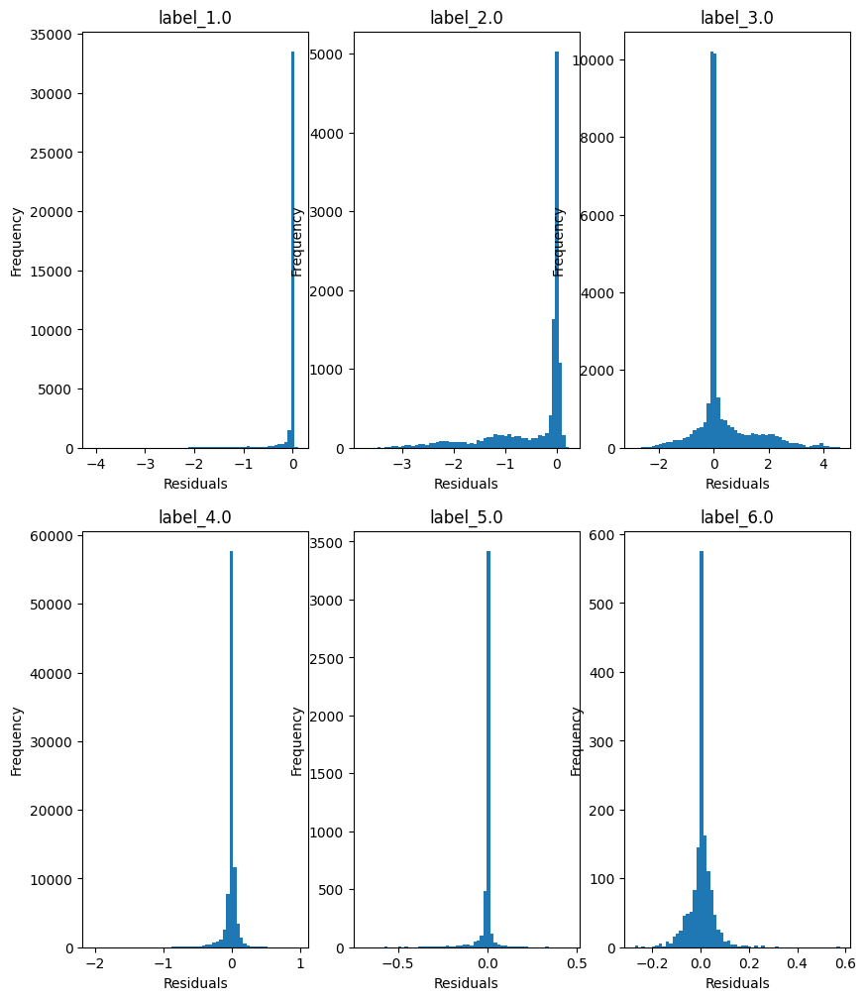

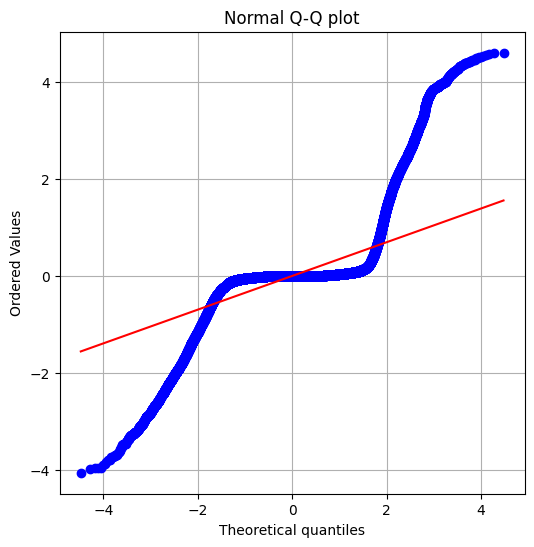

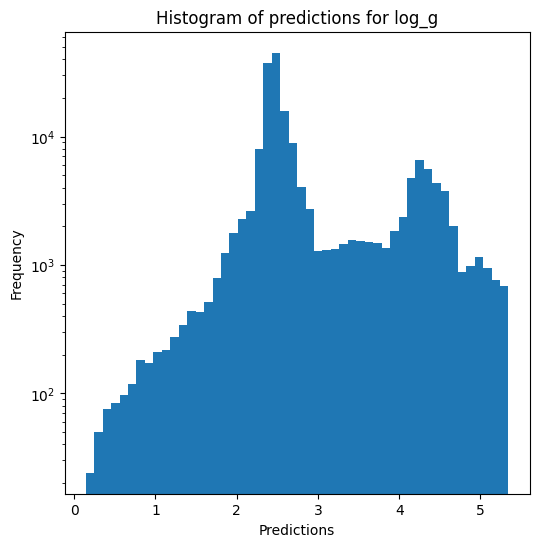

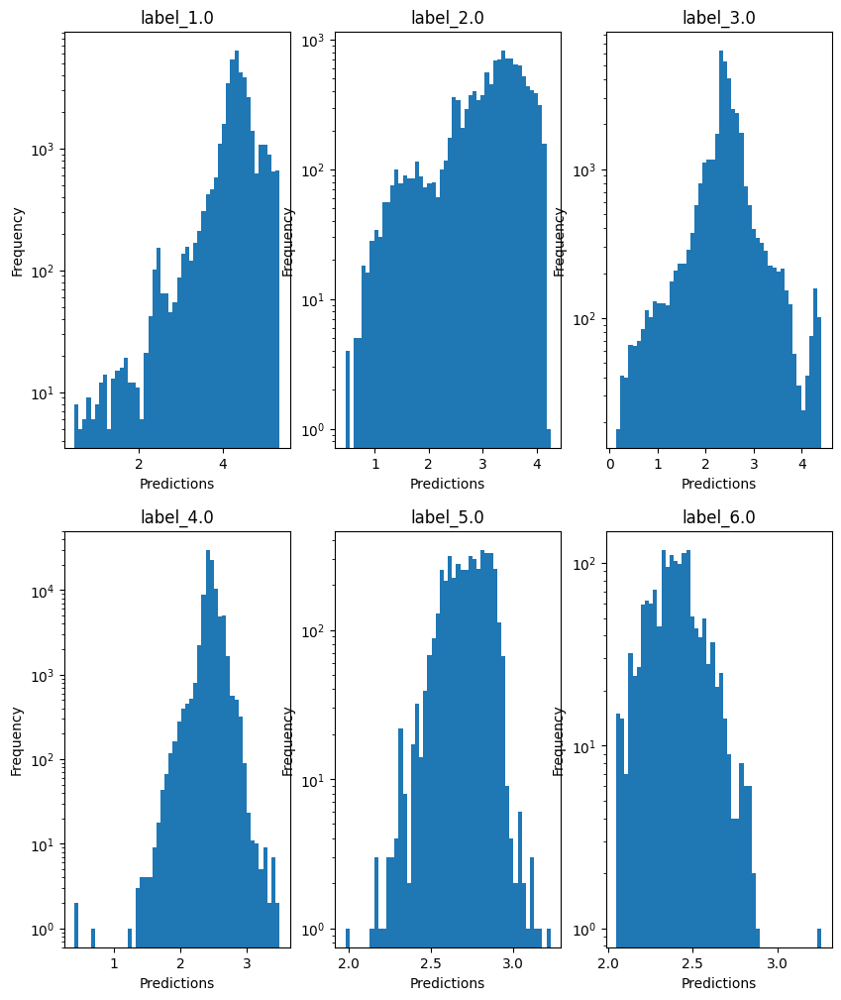


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 0.7228806106869394
  RVE :  0.7078963482896191
  RMSE :  0.1667421390538769
  MAE :  0.03912195237829962
  MedAE :  0.0005257708673146594
  CORR :  0.8848730507935565
  MAX_ER :  2.030694118628242
  Percentiles : 
    75th percentile :  0.003224855509235864
    90th percentile :  0.03279742401883298
    95th percentile :  0.21252717695677797
    99th percentile :  0.8990546317195097

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 1.2289134059946882
  RVE :  -1.3305951778814302
  RMSE :  0.42992643766008815
  MAE :  0.22443456672494236
  MedAE :  0.02599109454173537
  CORR :  0.16662394884988382
  MAX_ER :  1.8728481720300576
  Percentiles : 
    75th percentile :  0.33720078840007667
    90th percentile :  0.8070350575222619
    95th percentile :  1.1004850843785894
    99th percentile :  1.440243646628104

radius results for the label categ

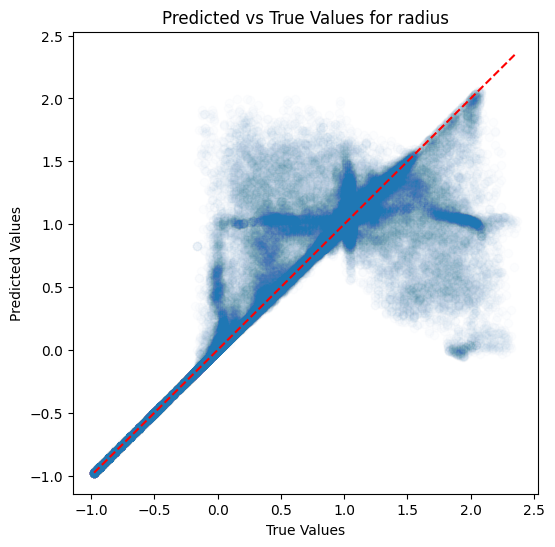

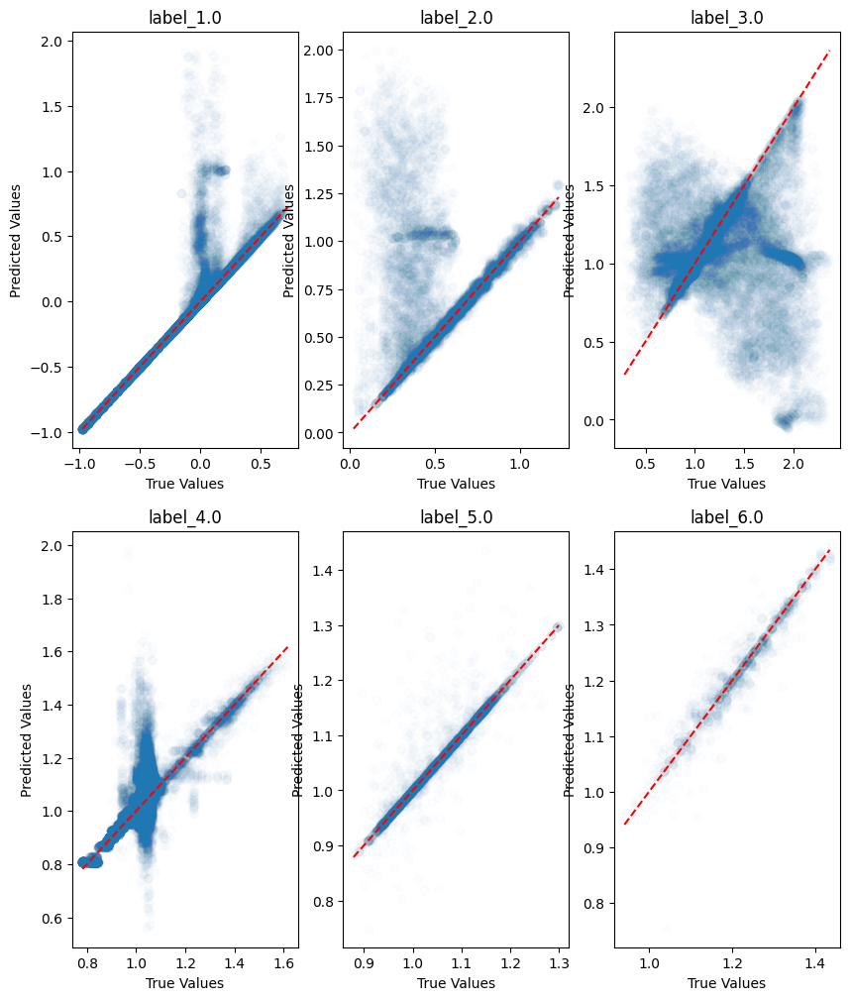

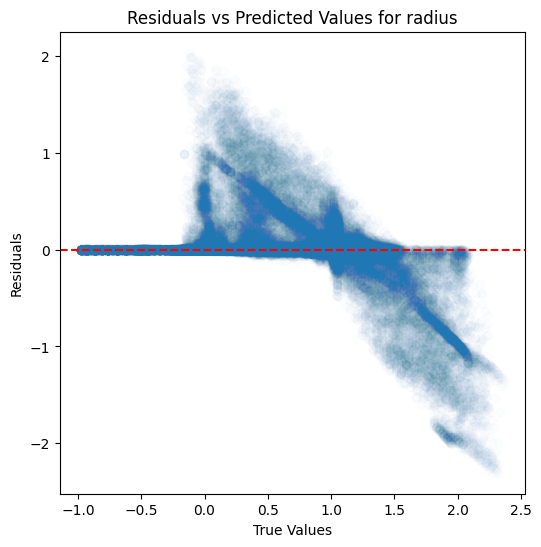

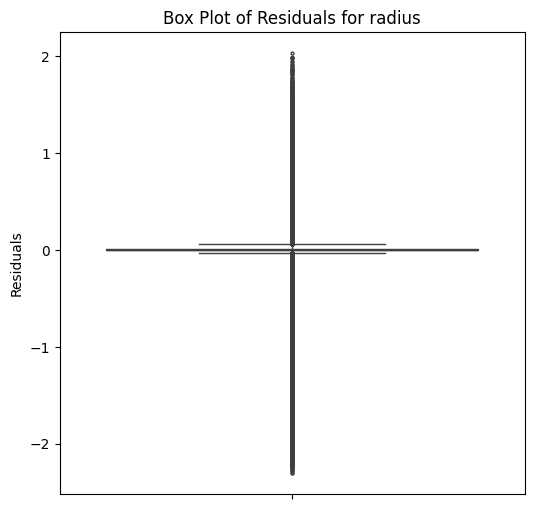

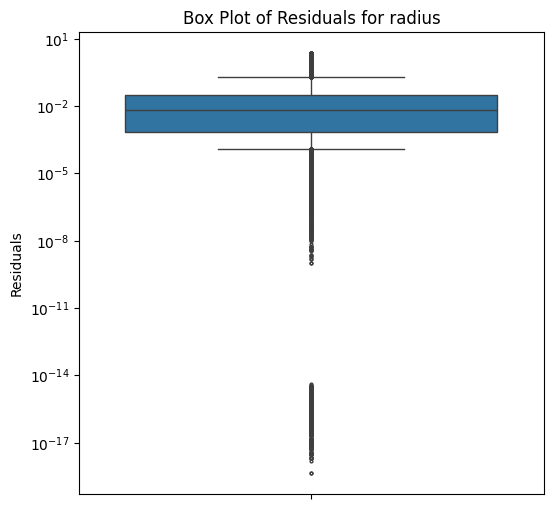

...

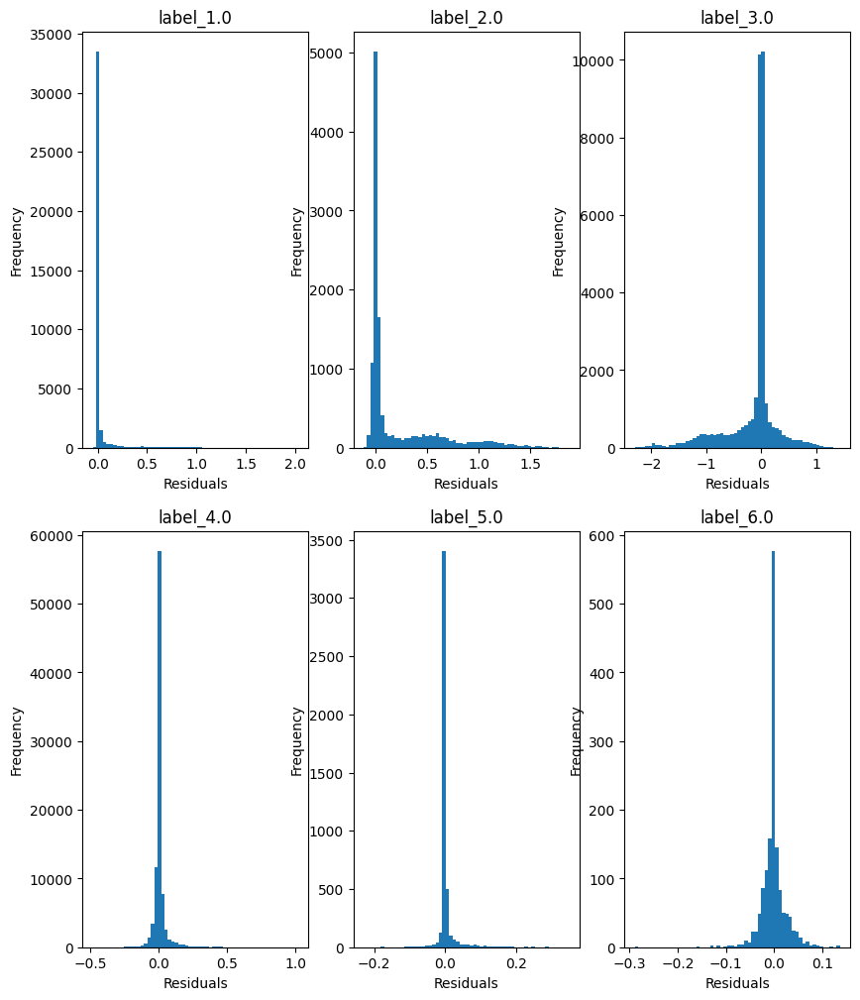

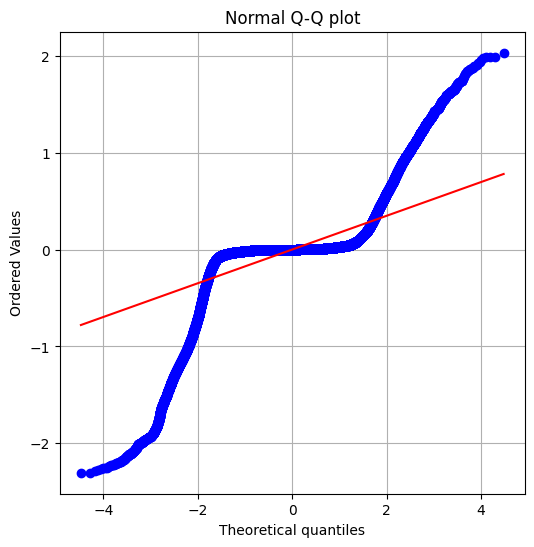

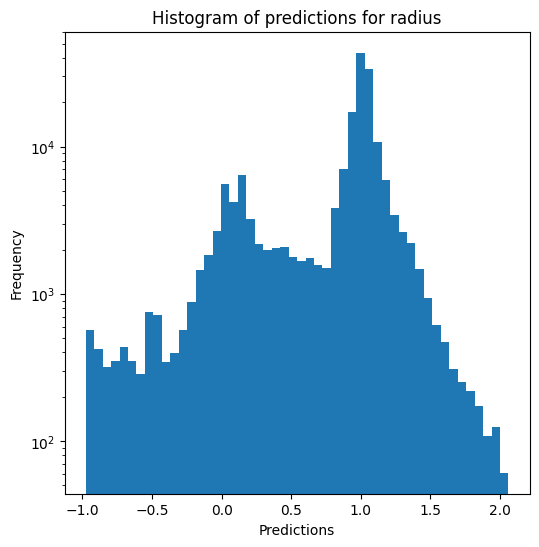

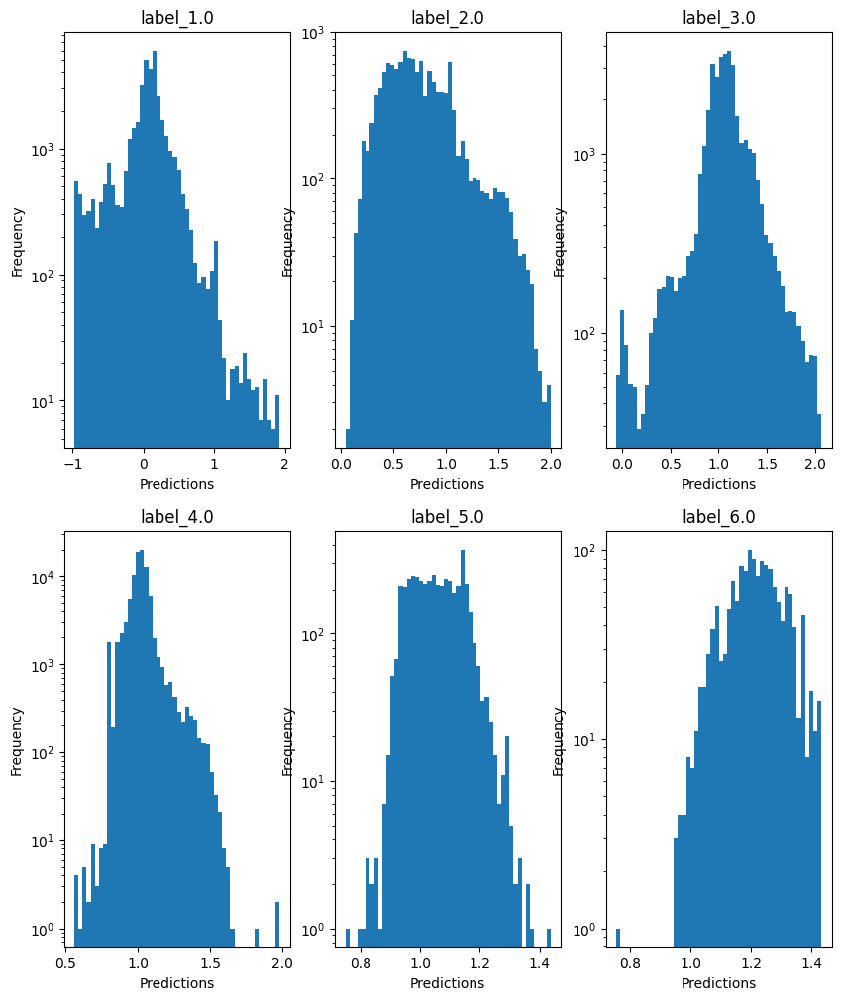

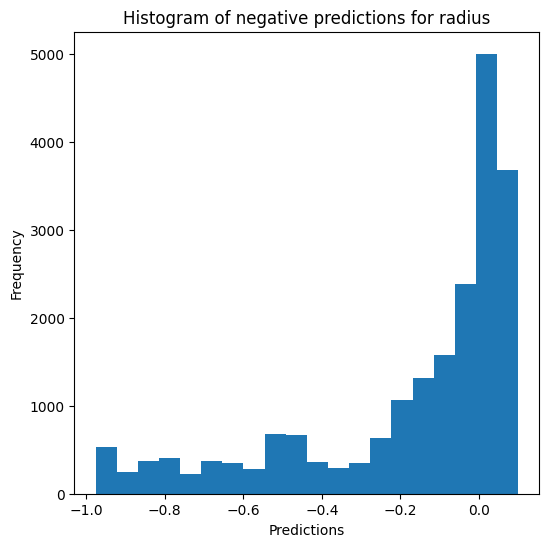

Saving results...


In [20]:
rf_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, n_jobs=5)

### XGBoost

In [21]:
xgb_evaluator = Model_evaluator("xgboost", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.1907
  RVE :  0.9514662316909307
  RMSE :  0.039055830909155265
  MAE :  0.02276255512854454
  MedAE :  0.010862756729125955
  CORR :  0.975709546834514
  MAX_ER :  0.324363548278809
  Percentiles : 
    75th percentile :  0.02805931434631348
    90th percentile :  0.05949844047546372
    95th percentile :  0.08533731727600102
    99th percentile :  0.16150763764953618

T_eff results for the label category with a value of 2.0
  value range :  3.6813 - 4.1397
  RVE :  0.5017650969894539
  RMSE :  0.07935581863957553
  MAE :  0.06510858154638126
  MedAE :  0.05606627845764156
  CORR :  0.7570231687633359
  MAX_ER :  0.3175848976135258
  Percentiles : 
    75th percentile :  0.09127708463668838
    90th percentile :  0.12553449008941642
    95th percentile :  0.1513515975952144
    99th percentile :  0.20764615588760388

T_eff resu

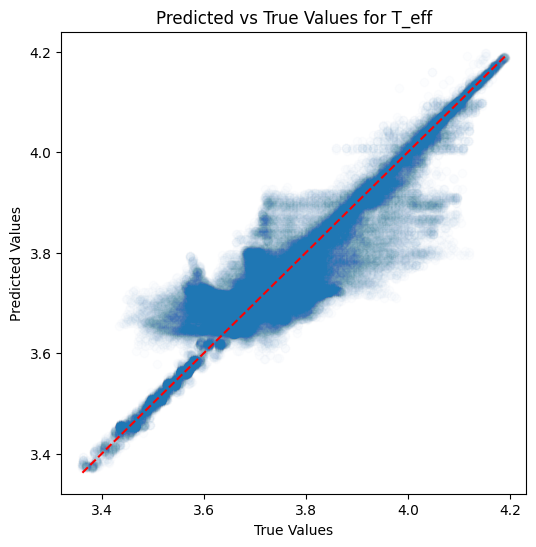

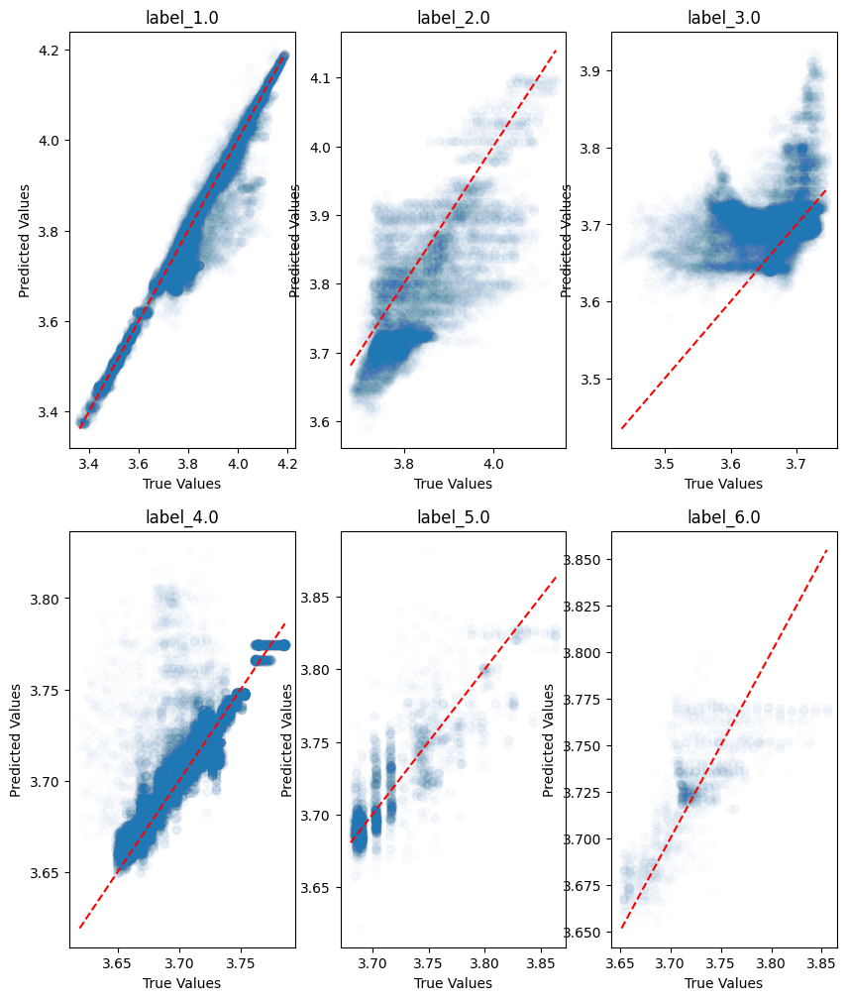

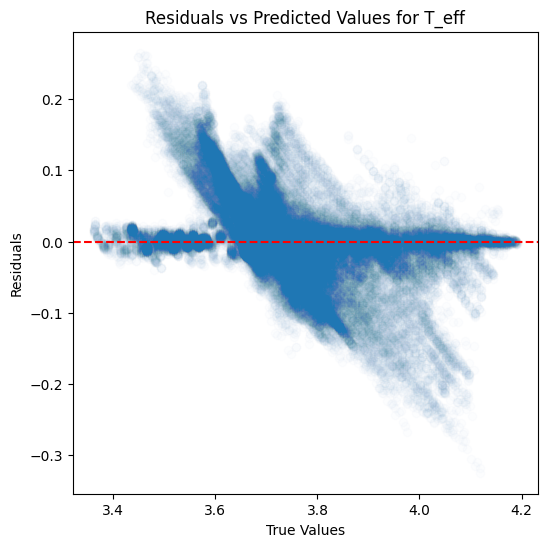

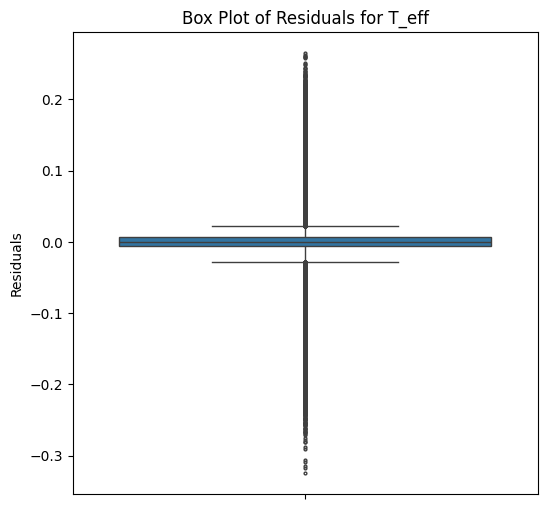

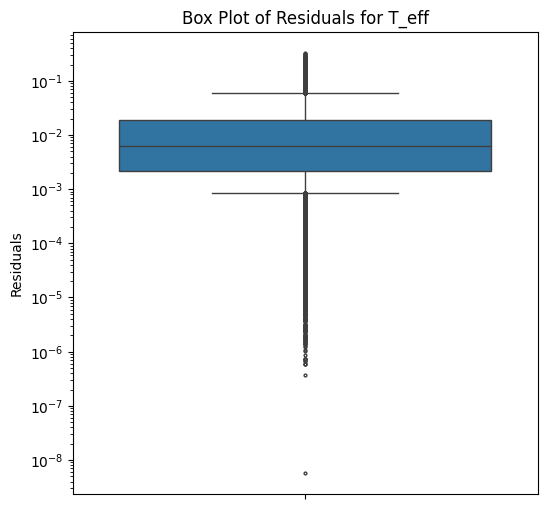

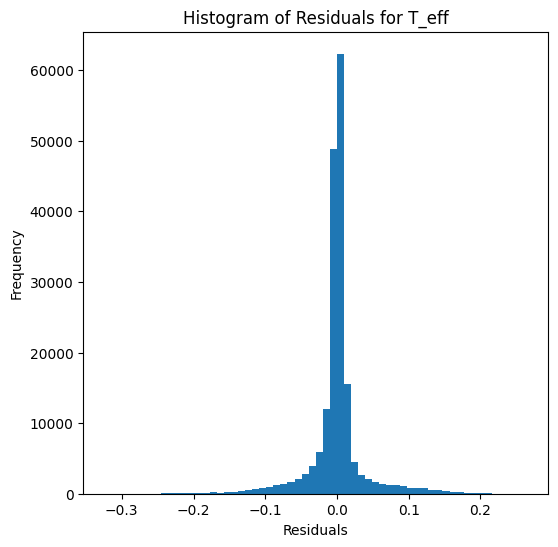

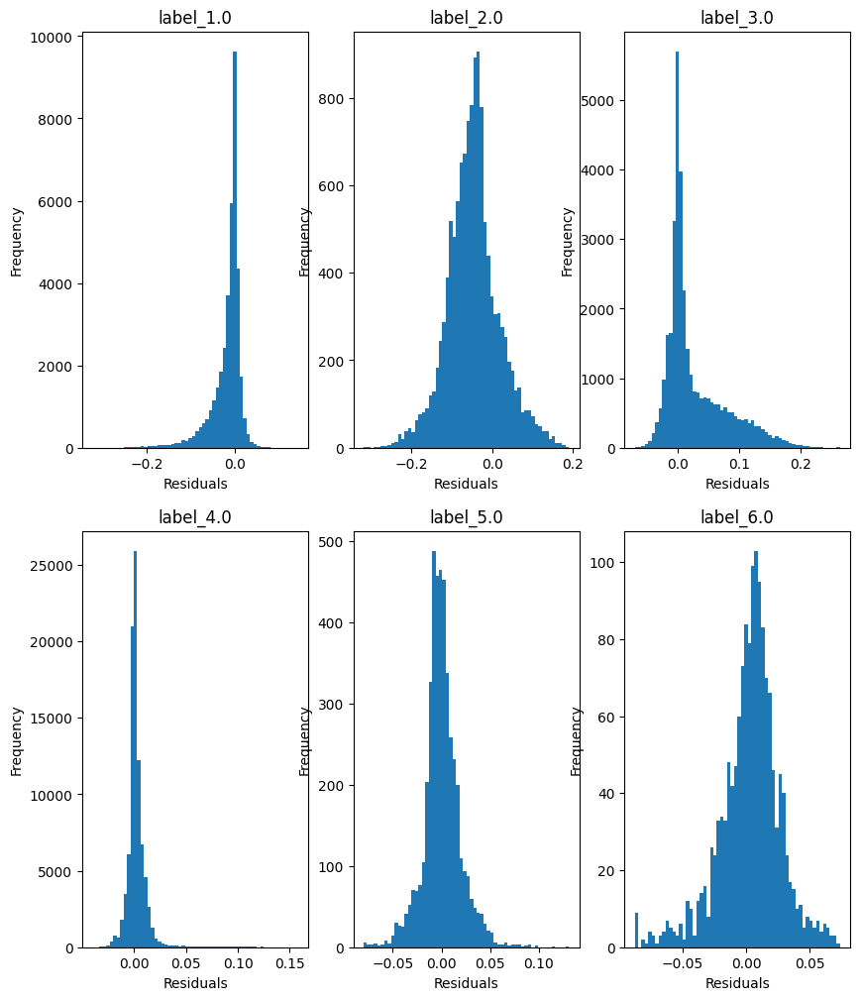

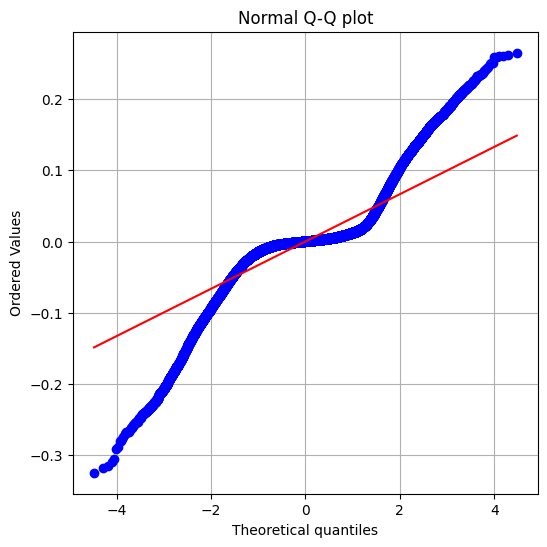

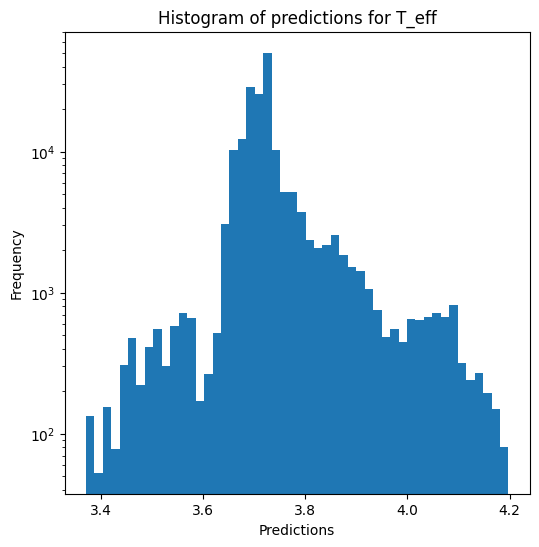

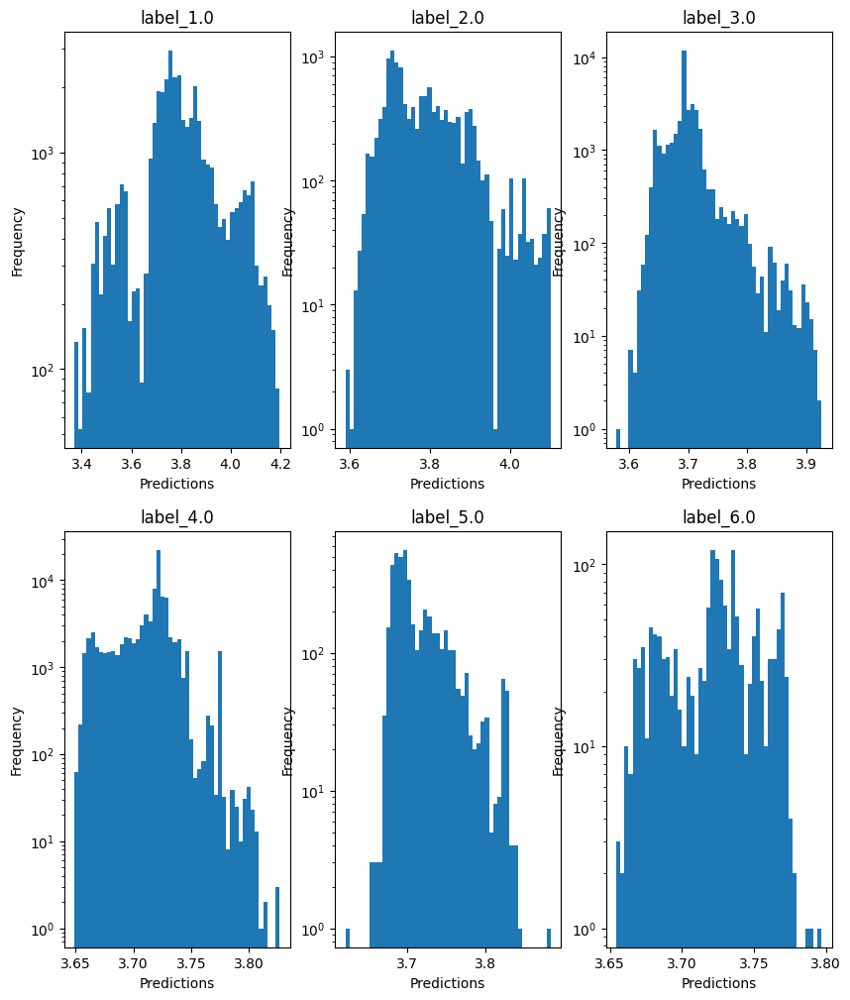

no negative values

log_g results for the label category with a value of 1.0
  value range :  3.465 - 5.345
  RVE :  -0.6001570140062298
  RMSE :  0.4608442281579774
  MAE :  0.25720931950684656
  MedAE :  0.07795264053344741
  CORR :  0.7734199570754127
  MAX_ER :  3.6259056000709533
  Percentiles : 
    75th percentile :  0.3256622705459593
    90th percentile :  0.7979954784393312
    95th percentile :  1.1078369553565977
    99th percentile :  1.671496445388794

log_g results for the label category with a value of 2.0
  value range :  2.456 - 4.299
  RVE :  -1.3121363760708706
  RMSE :  0.7987716167825999
  MAE :  0.6331751794297094
  MedAE :  0.5260204954147338
  CORR :  0.08962101173691343
  MAX_ER :  2.927567584991455
  Percentiles : 
    75th percentile :  1.0272834000587463
    90th percentile :  1.2996530645370483
    95th percentile :  1.4458022465705869
    99th percentile :  1.799039820423123

log_g results for the label category with a value of 3.0
  value range :  -0.384

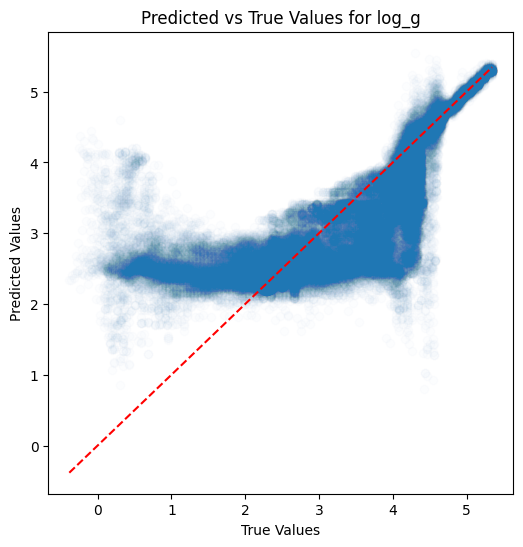

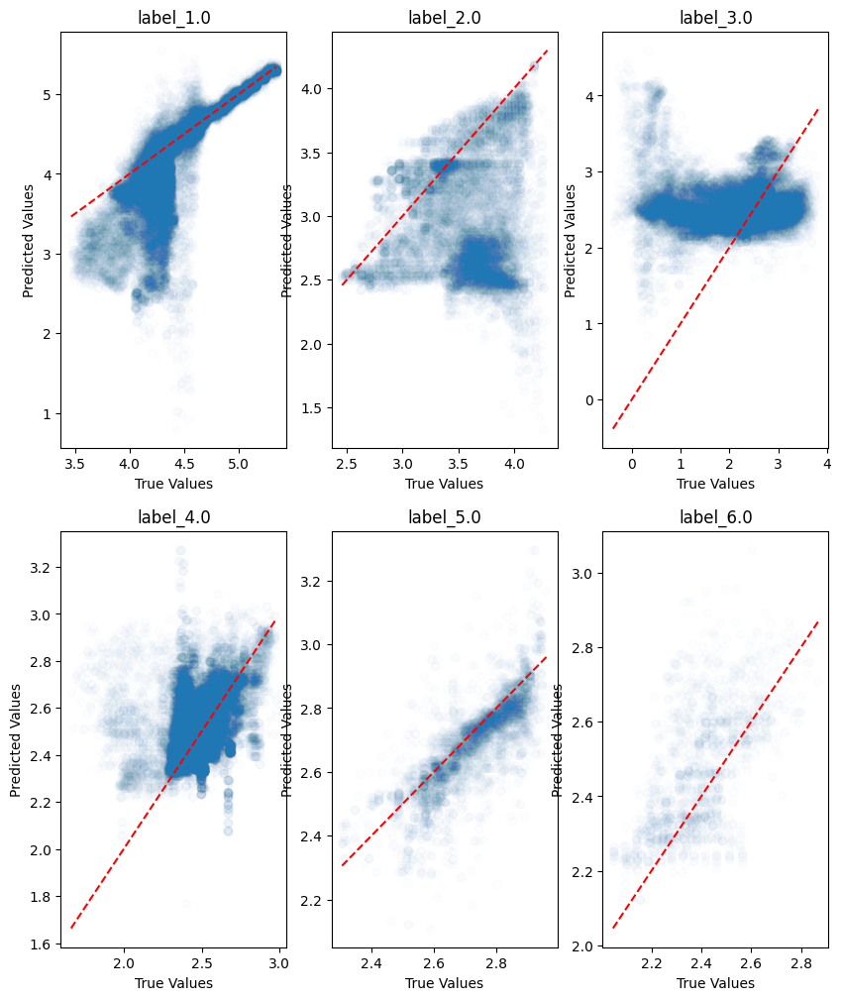

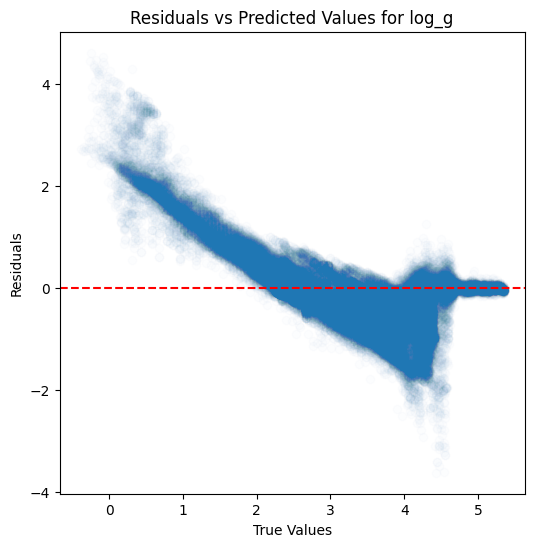

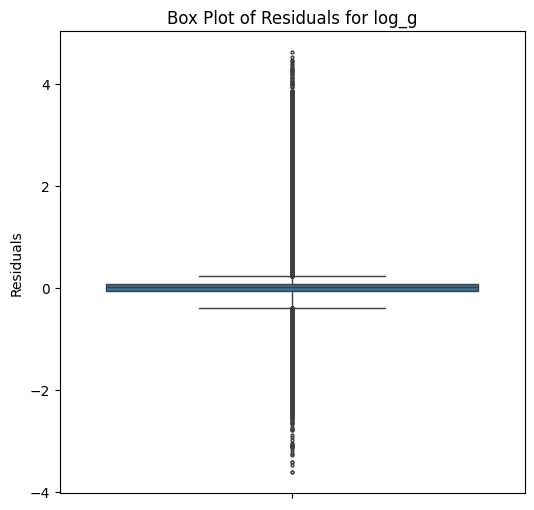

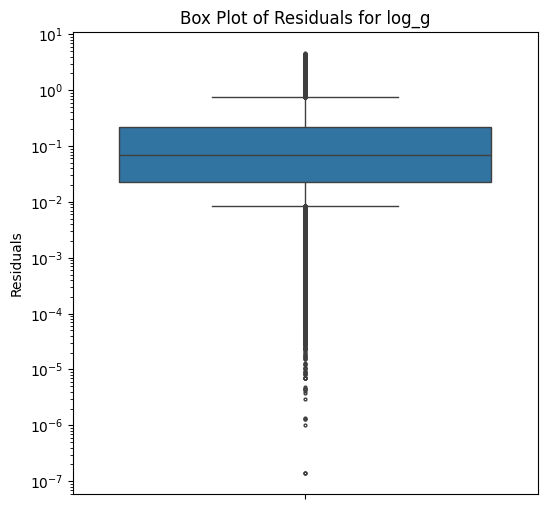

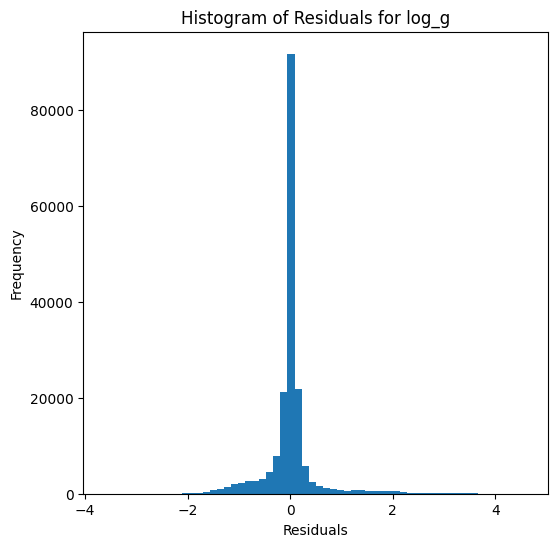

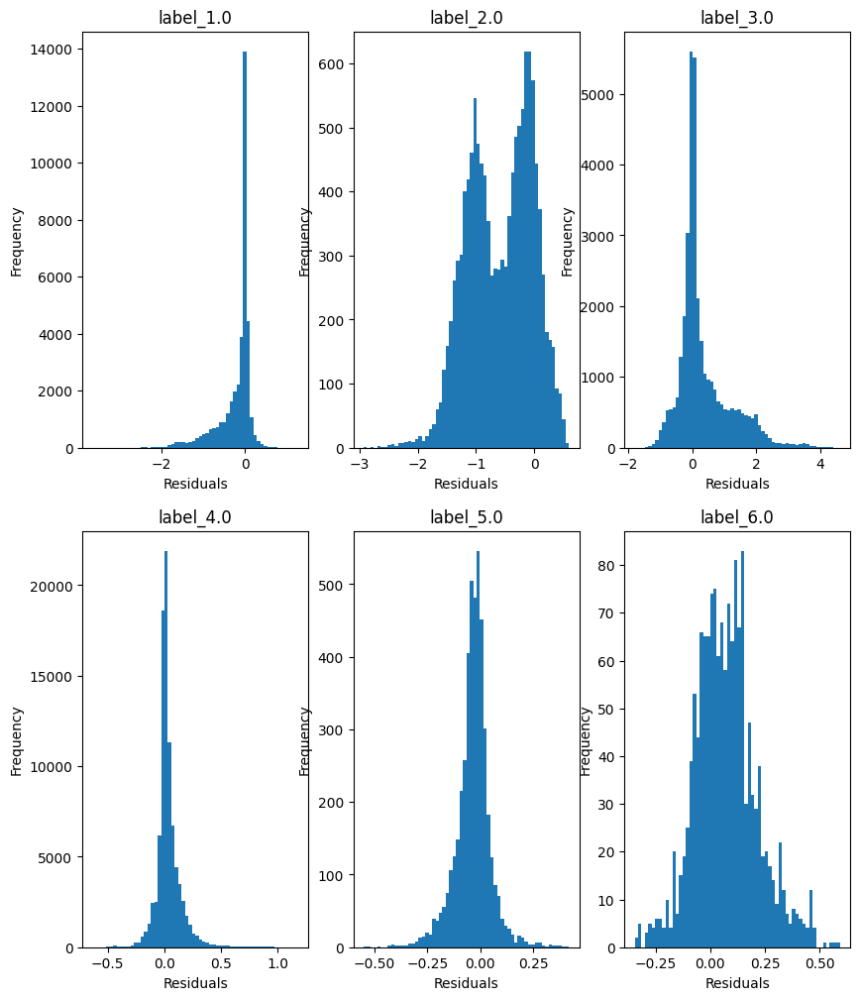

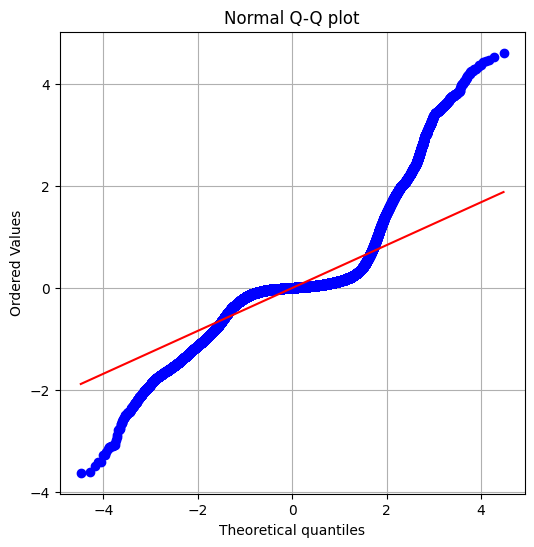

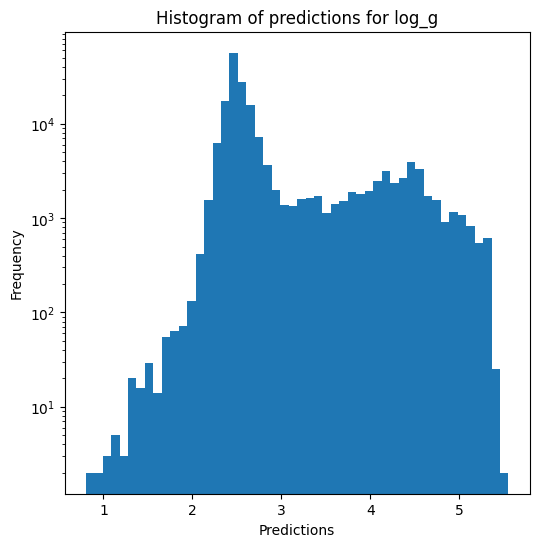

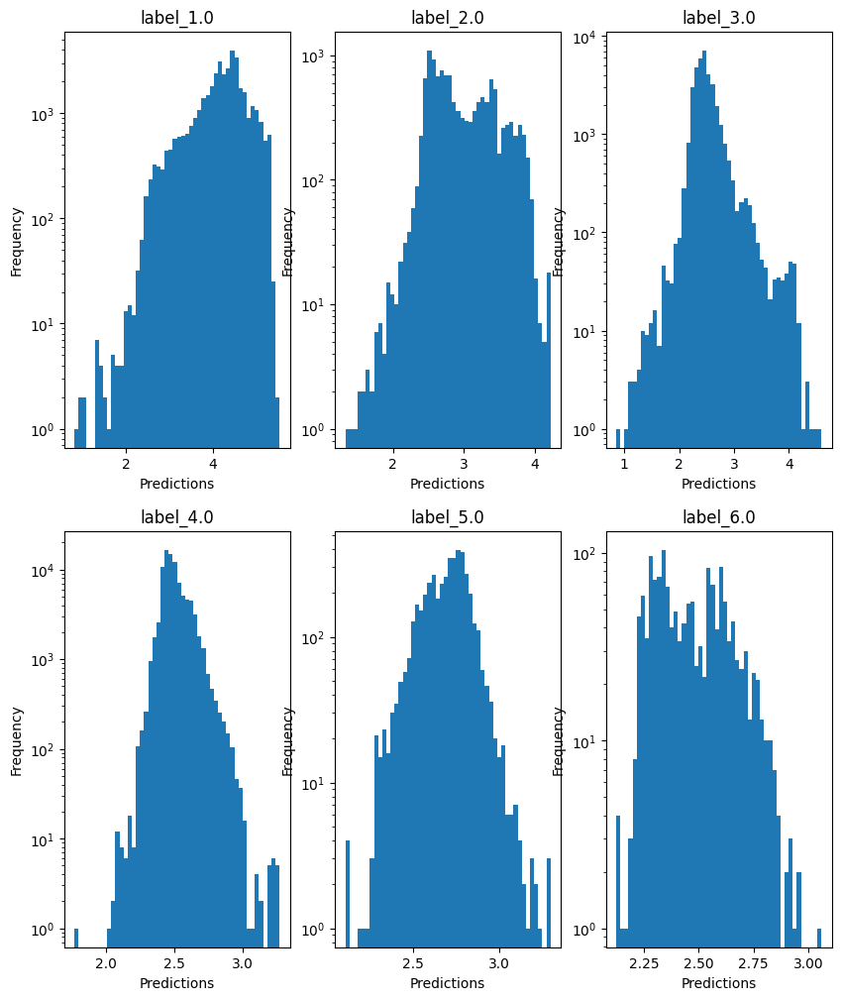


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 0.7228806106869394
  RVE :  0.5422178342312092
  RMSE :  0.22937690365350963
  MAE :  0.12925411294122657
  MedAE :  0.04343078970780857
  CORR :  0.8679802205239031
  MAX_ER :  1.6626087636745353
  Percentiles : 
    75th percentile :  0.1568414310654438
    90th percentile :  0.39389435669659734
    95th percentile :  0.5522914754619052
    99th percentile :  0.8308653989023983

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 1.2289134059946882
  RVE :  -0.25643982288806044
  RMSE :  0.39855546992362545
  MAE :  0.3165983728312409
  MedAE :  0.2661512237171837
  CORR :  0.28534341589559026
  MAX_ER :  1.3281151282144188
  Percentiles : 
    75th percentile :  0.5106690829258206
    90th percentile :  0.650375157048658
    95th percentile :  0.724148876949194
    99th percentile :  0.8962718110846327

radius results for the label category wi

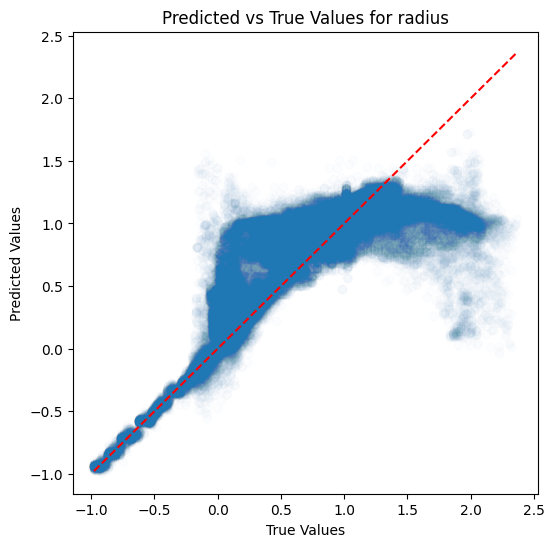

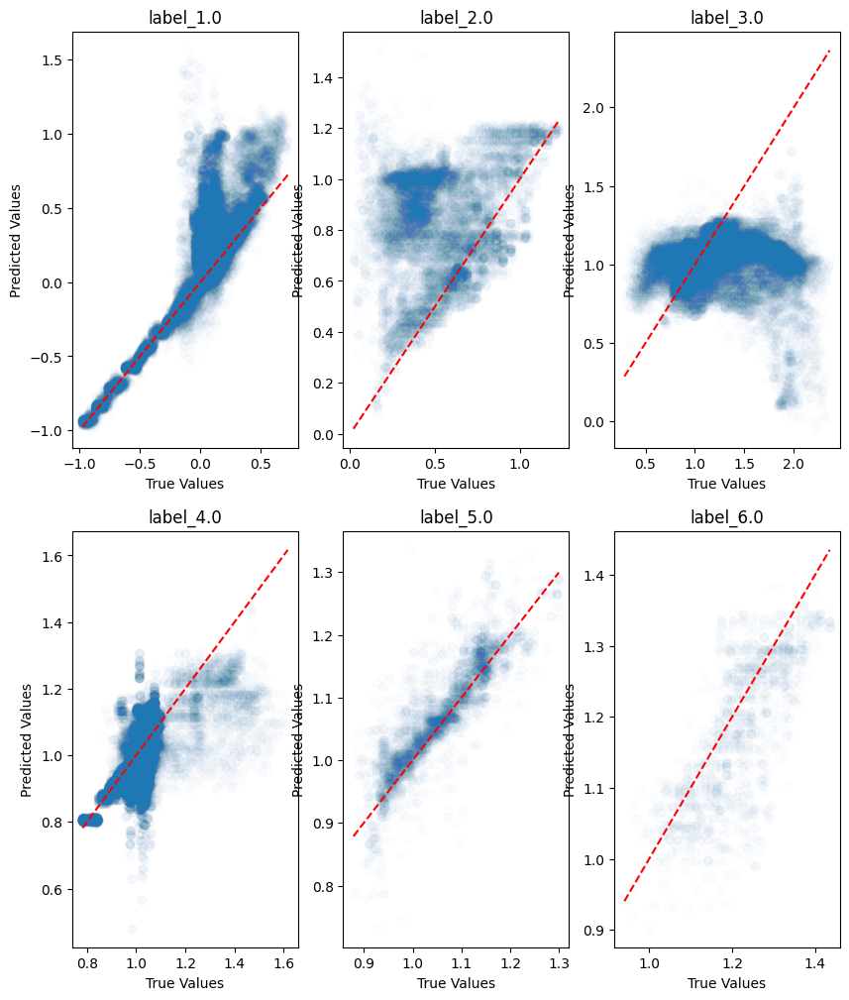

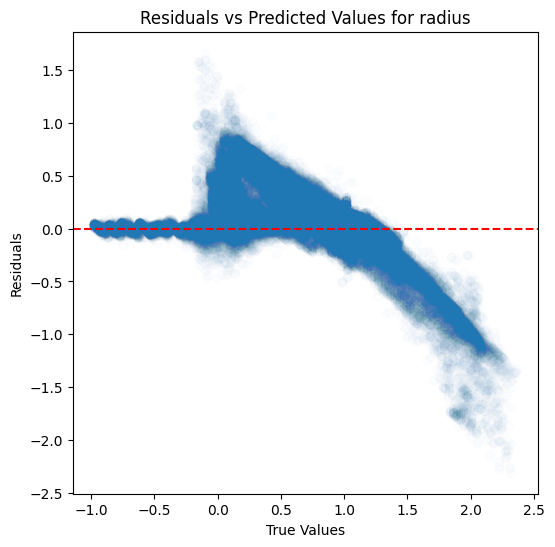

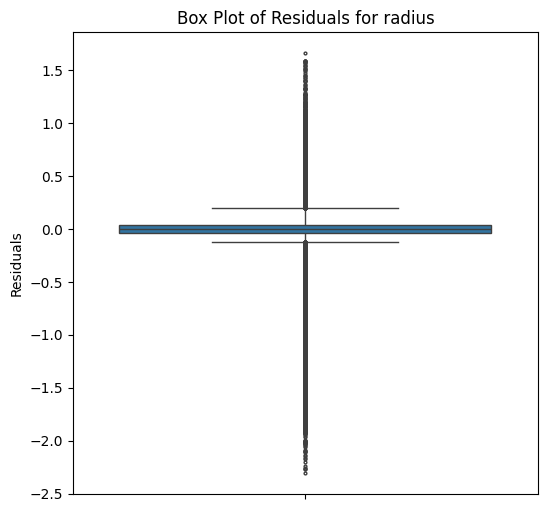

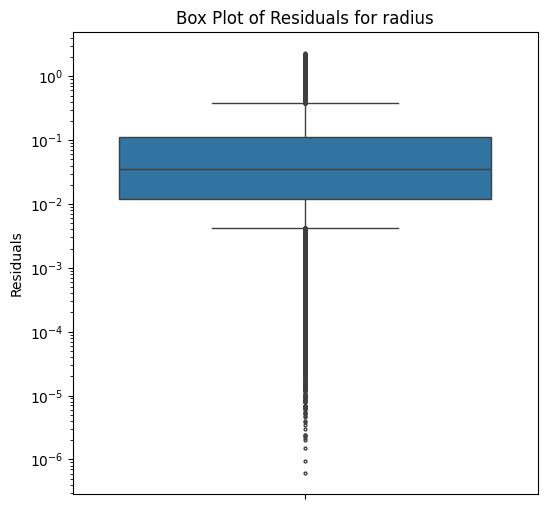

...

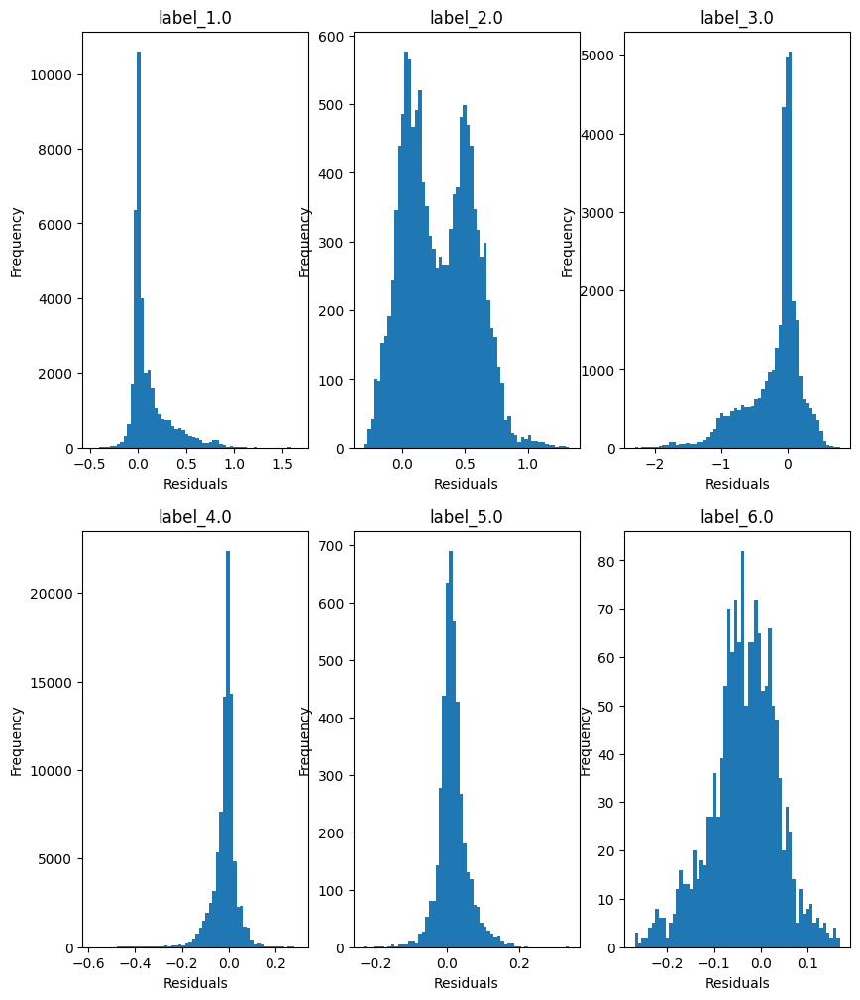

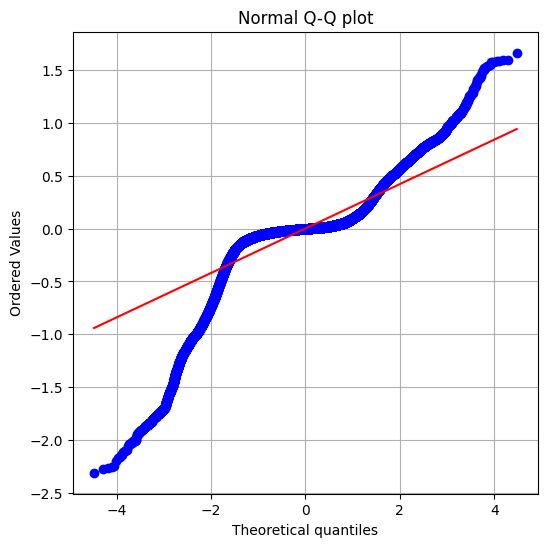

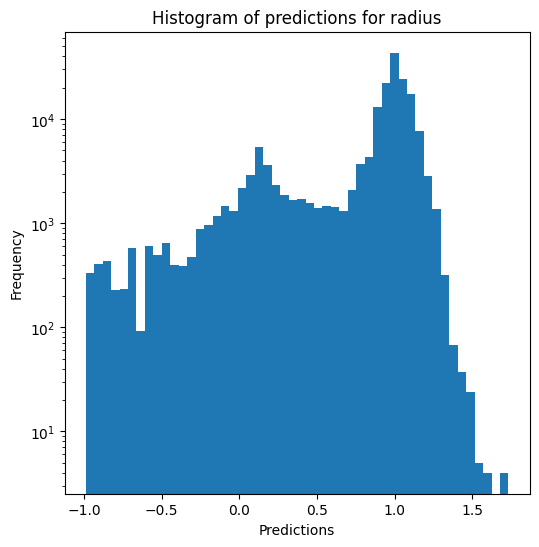

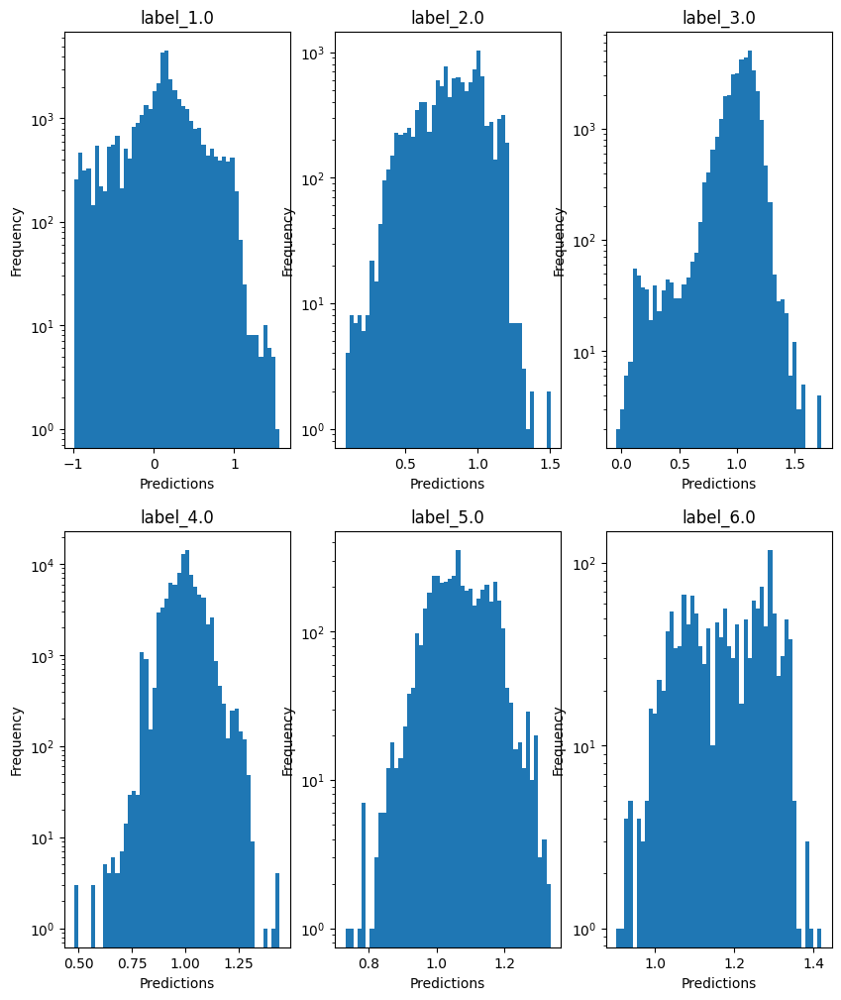

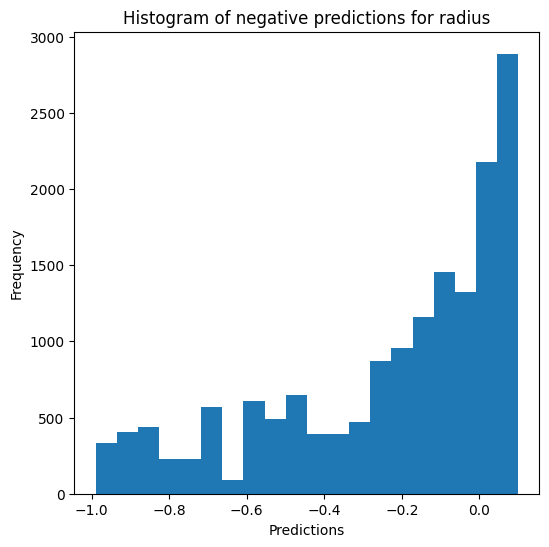

Saving results...


In [22]:
xgb_evaluator.evaluate_Kfold_results(XGBRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, n_jobs=5)

### Multi-layer perceptron

In [23]:
mlp_evaluator = Model_evaluator("mlp", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.1907
  RVE :  0.5607280311364085
  RMSE :  0.11589381843074006
  MAE :  0.09347082372740609
  MedAE :  0.08217875082639203
  CORR :  0.7912014877978358
  MAX_ER :  0.6336879767814234
  Percentiles : 
    75th percentile :  0.1355200382279219
    90th percentile :  0.18751984224440862
    95th percentile :  0.21801229268179617
    99th percentile :  0.2809484507580591

T_eff results for the label category with a value of 2.0
  value range :  3.6813 - 4.1397
  RVE :  0.040501860137208356
  RMSE :  0.11580973375261623
  MAE :  0.09758225236026025
  MedAE :  0.08883450516525526
  CORR :  0.5177989569662957
  MAX_ER :  0.3220619560000175
  Percentiles : 
    75th percentile :  0.14003479245025707
    90th percentile :  0.18644232236385563
    95th percentile :  0.21327452721726728
    99th percentile :  0.253176394374811

T_eff resul

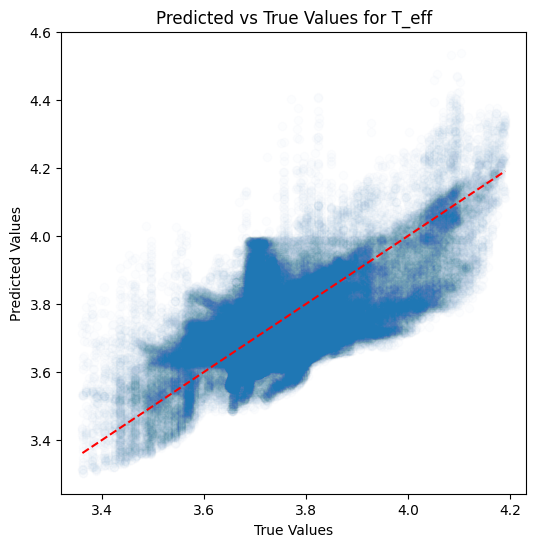

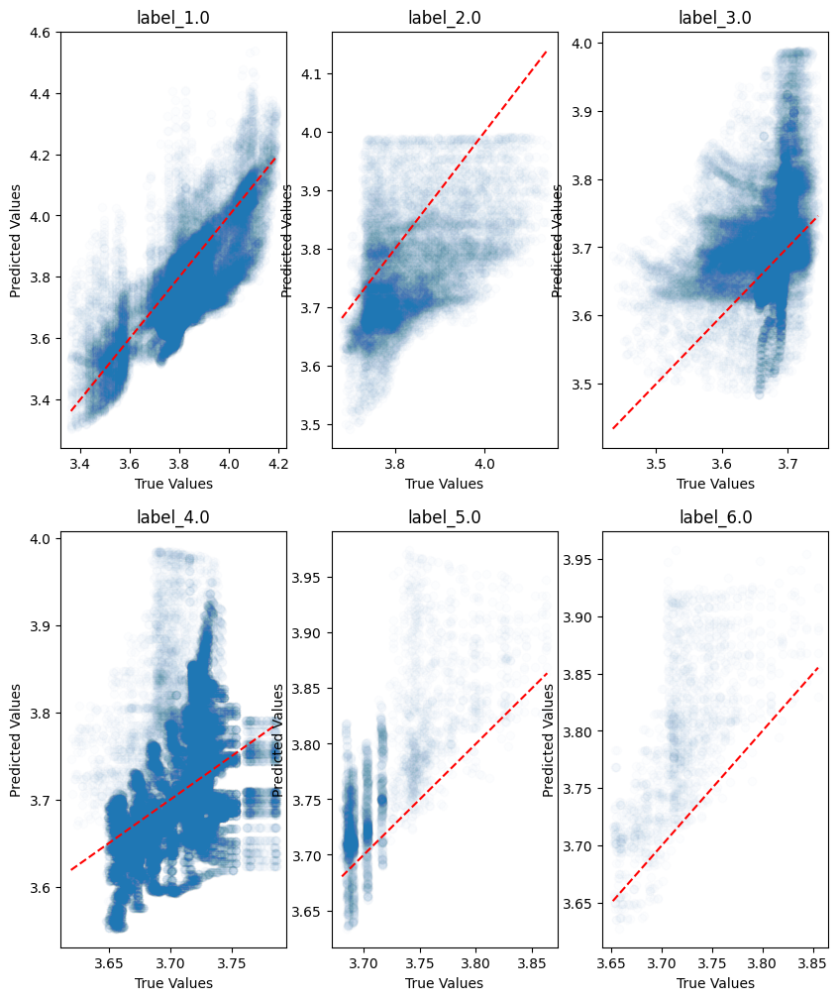

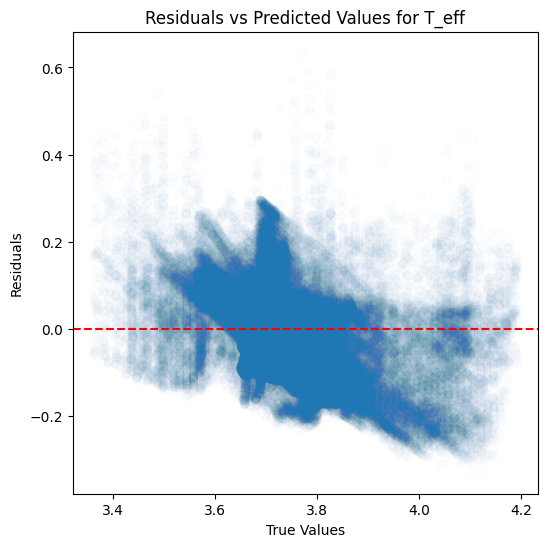

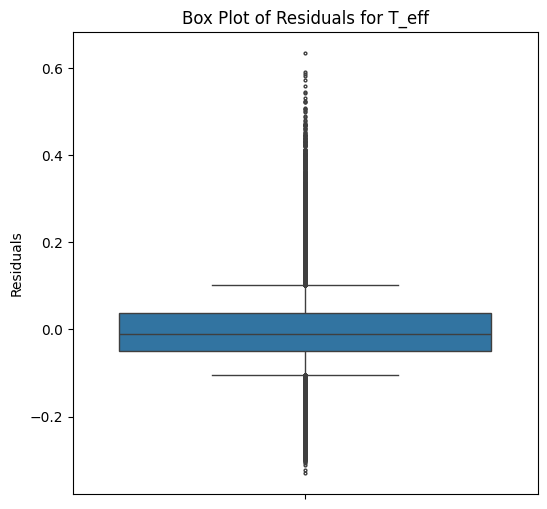

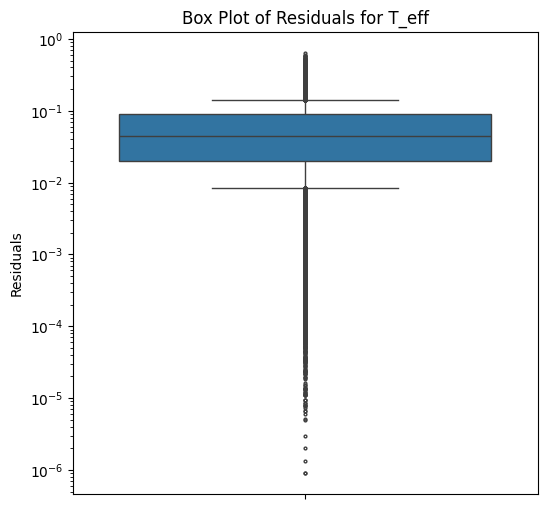

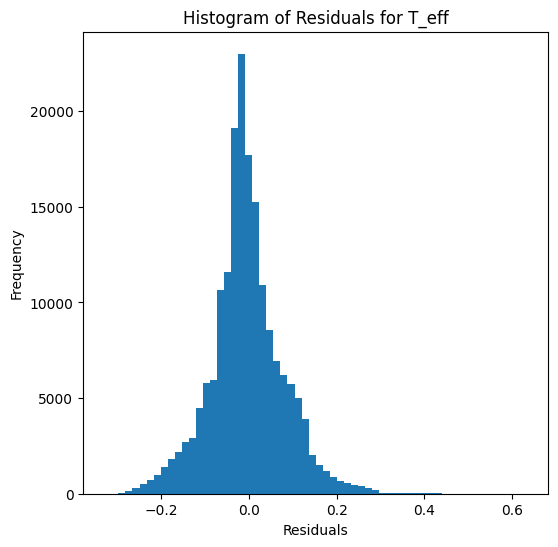

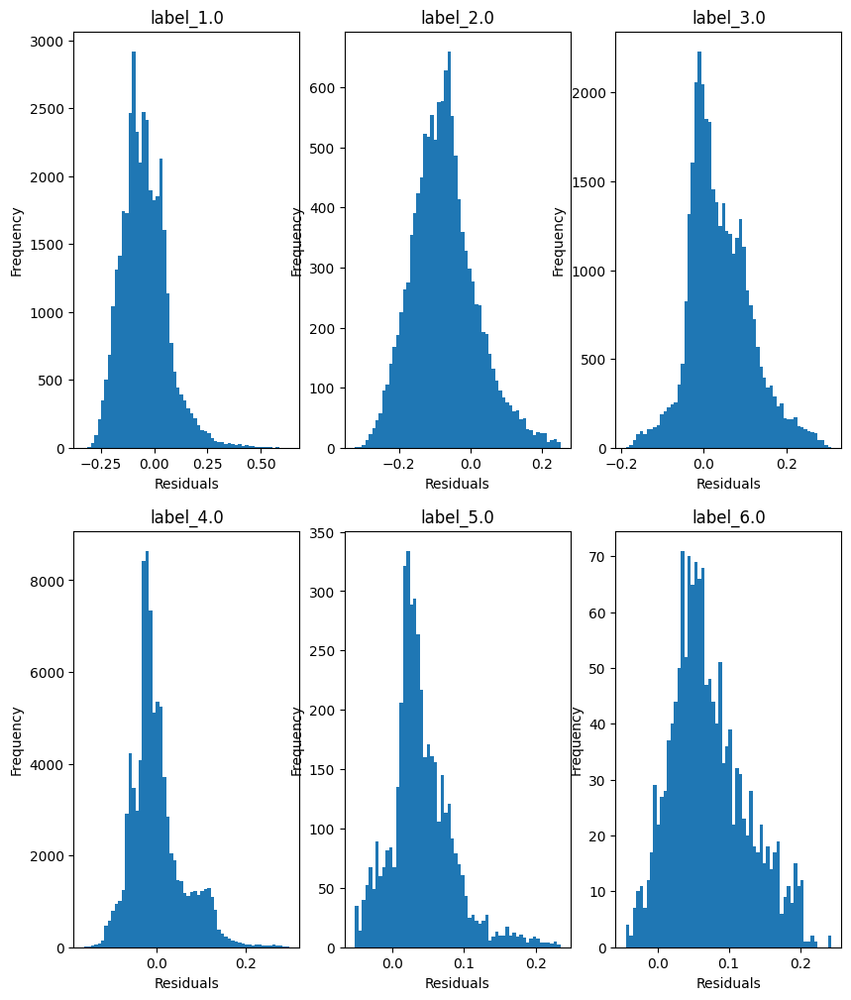

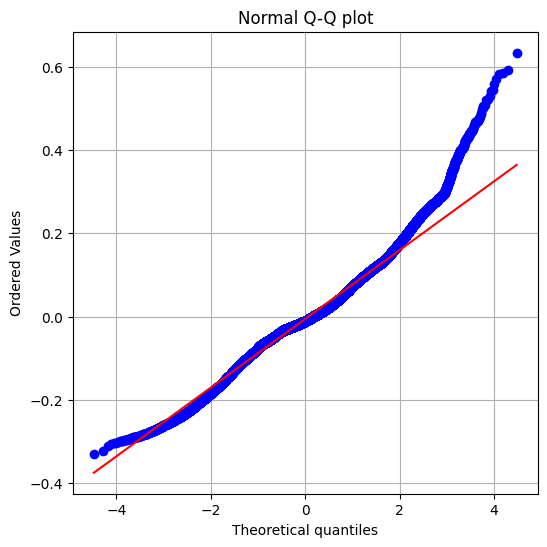

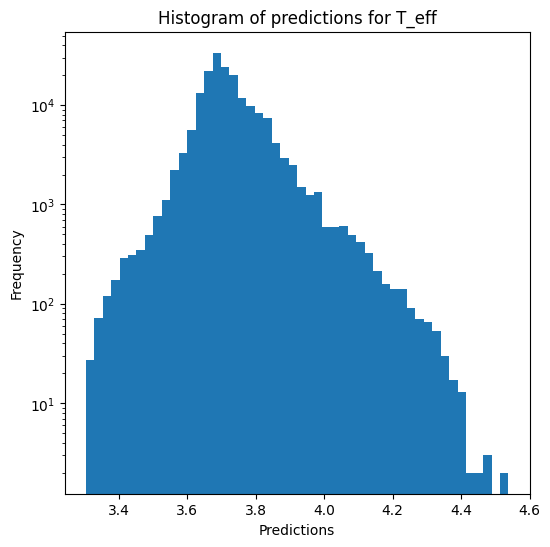

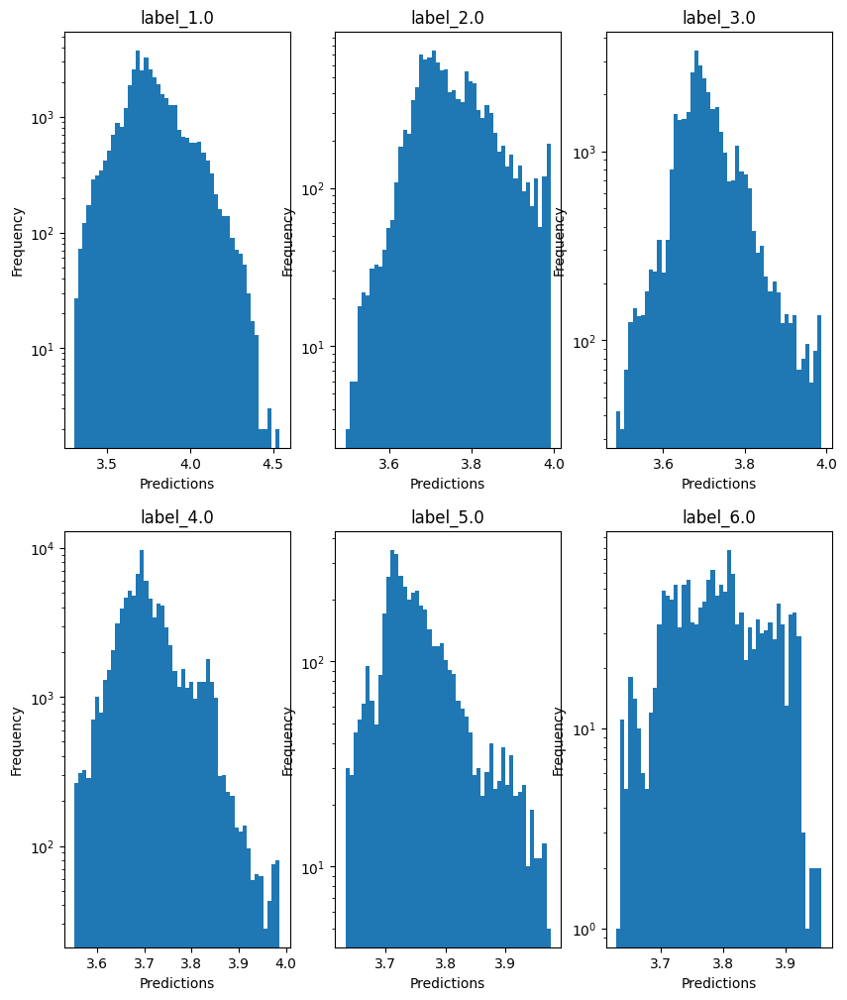

no negative values

log_g results for the label category with a value of 1.0
  value range :  3.465 - 5.345
  RVE :  -3.868650811787682
  RMSE :  0.938630709588942
  MAE :  0.6733604896505861
  MedAE :  0.3018774212820845
  CORR :  0.7249651329375316
  MAX_ER :  1.965581096787684
  Percentiles : 
    75th percentile :  1.3369963868960937
    90th percentile :  1.6746445904665745
    95th percentile :  1.7660339301812389
    99th percentile :  1.8673684616014725

log_g results for the label category with a value of 2.0
  value range :  2.456 - 4.299
  RVE :  -0.9837728761605316
  RMSE :  0.9294766901798789
  MAE :  0.8202772569017484
  MedAE :  0.8687189969637106
  CORR :  -0.26171239282065073
  MAX_ER :  1.8524857842642022
  Percentiles : 
    75th percentile :  1.180803567261067
    90th percentile :  1.3675307606484293
    95th percentile :  1.4622192134808787
    99th percentile :  1.6385266862998629

log_g results for the label category with a value of 3.0
  value range :  -0.384 -

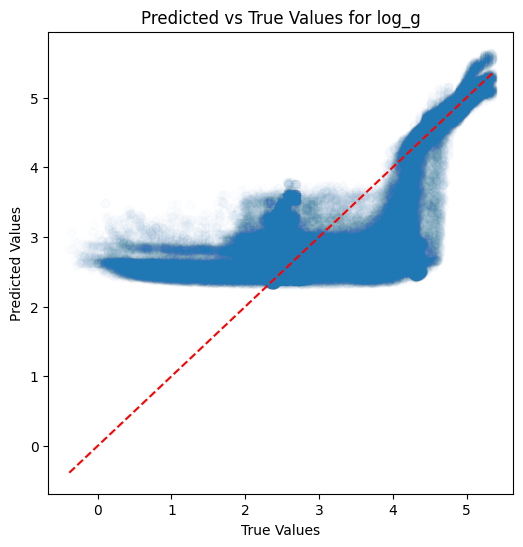

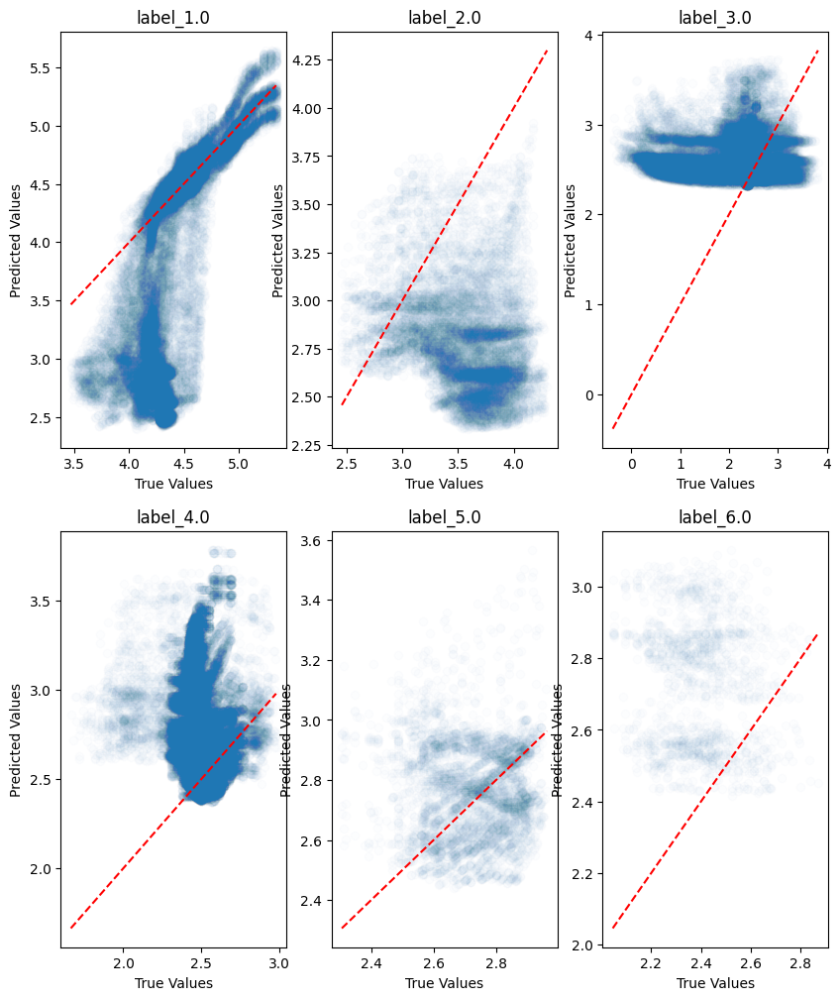

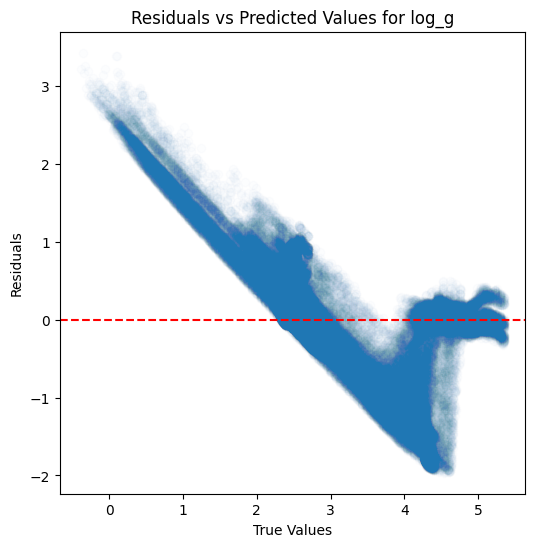

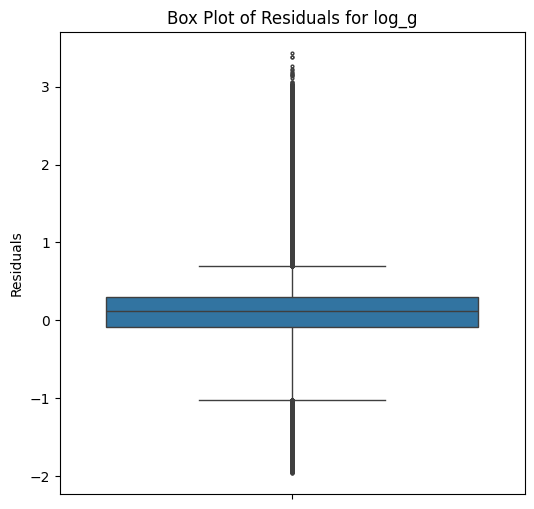

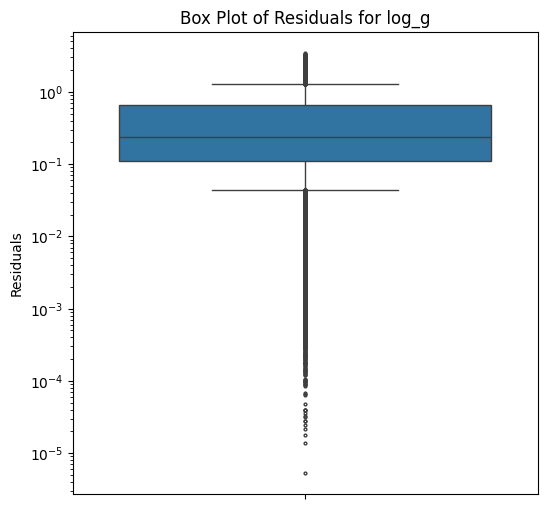

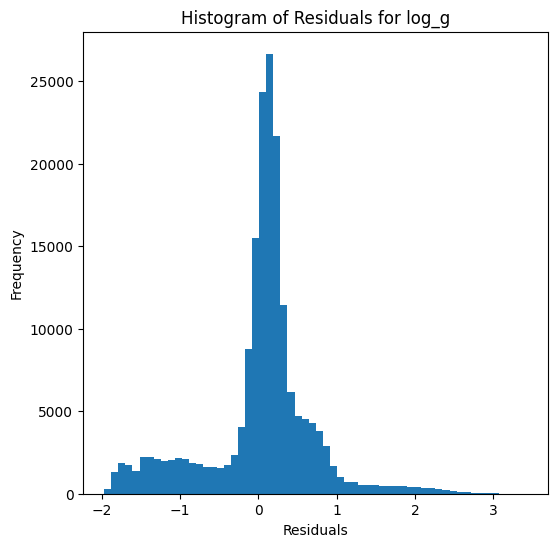

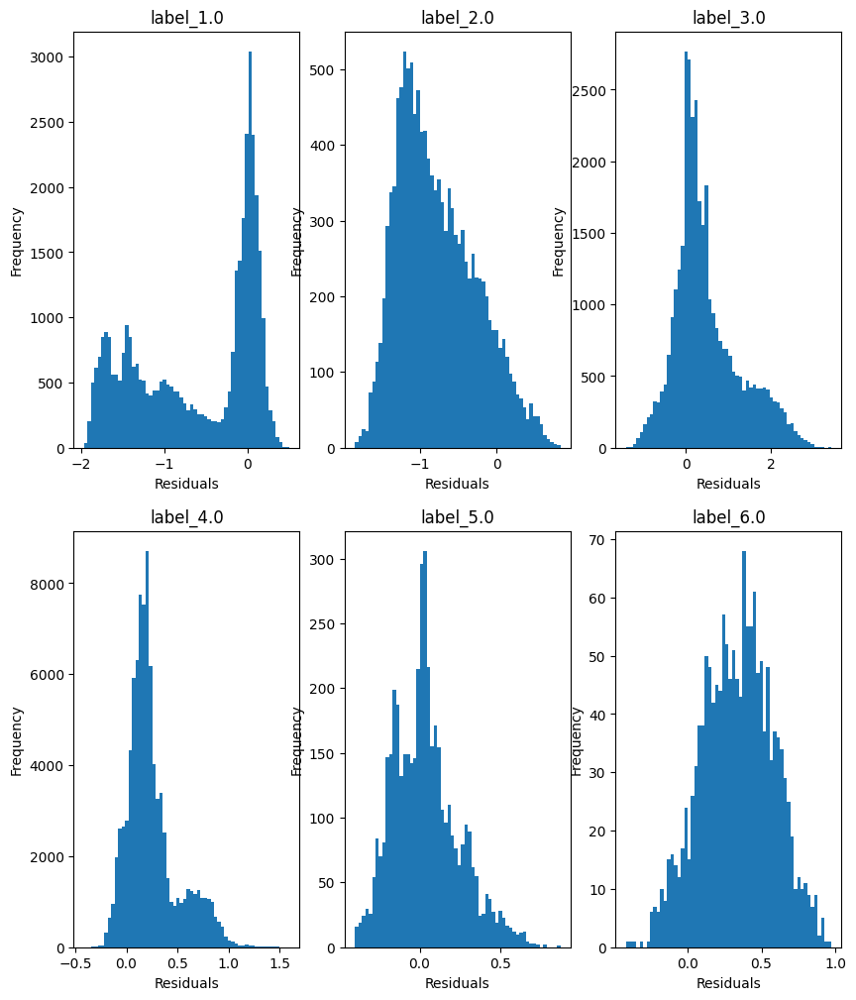

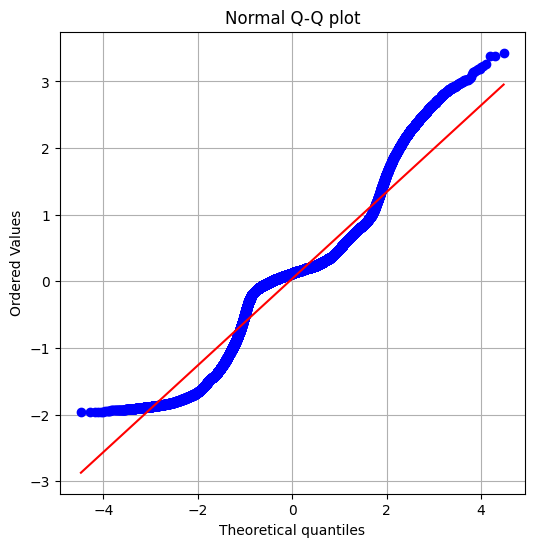

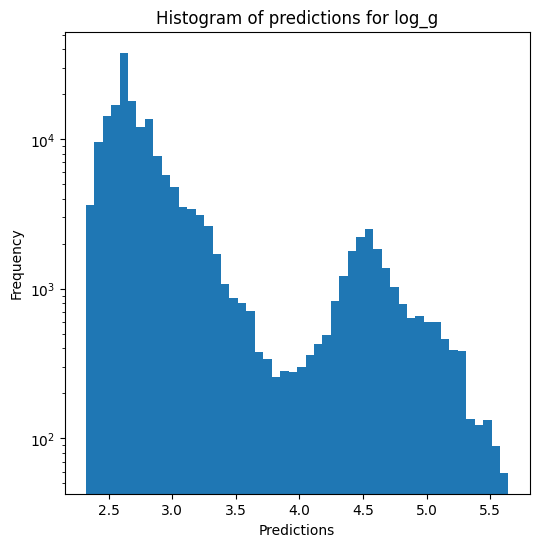

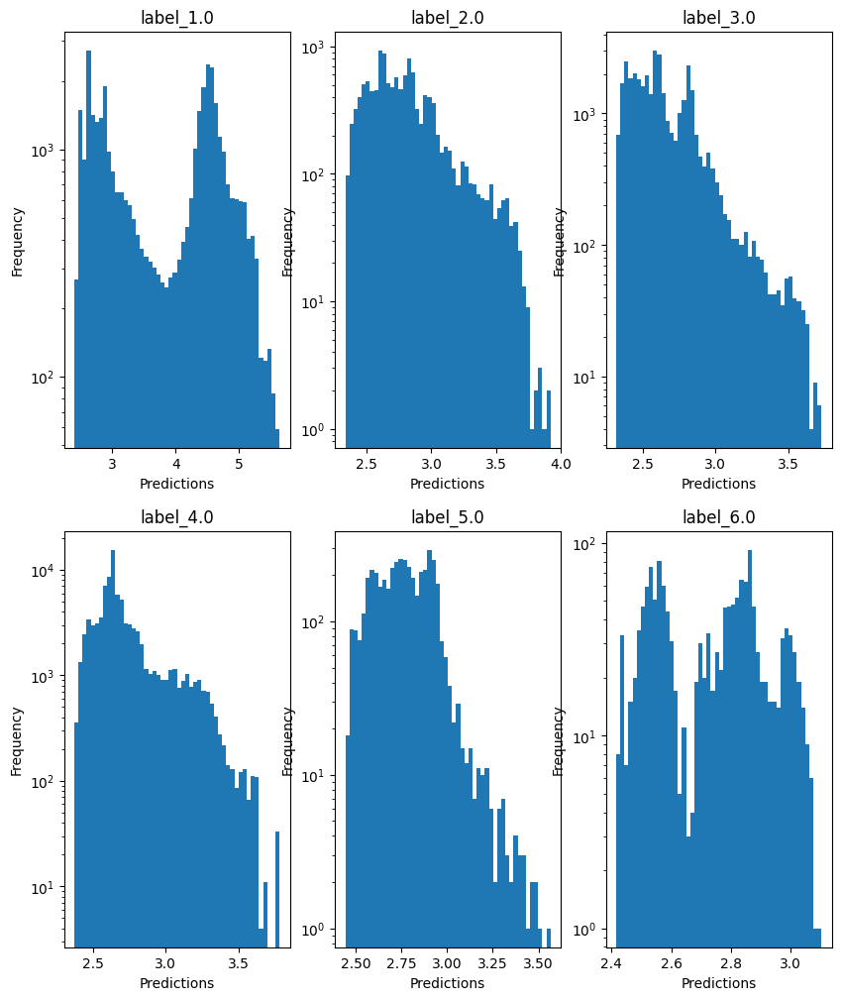


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 0.7228806106869394
  RVE :  -0.34828652576951313
  RMSE :  0.472819399821771
  MAE :  0.33536675165391694
  MedAE :  0.14235719581670492
  CORR :  0.7675803839055694
  MAX_ER :  1.013206438629486
  Percentiles : 
    75th percentile :  0.6704589449993519
    90th percentile :  0.8352137163752795
    95th percentile :  0.8826426866799715
    99th percentile :  0.9510814346863556

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 1.2289134059946882
  RVE :  0.005650543995053381
  RMSE :  0.47330015800807174
  MAE :  0.4212535662836884
  MedAE :  0.4519084128446092
  CORR :  0.22248759544396704
  MAX_ER :  0.949951254765336
  Percentiles : 
    75th percentile :  0.5932672303854596
    90th percentile :  0.6833403229307736
    95th percentile :  0.7322883366553786
    99th percentile :  0.8202161828682581

radius results for the label category wit

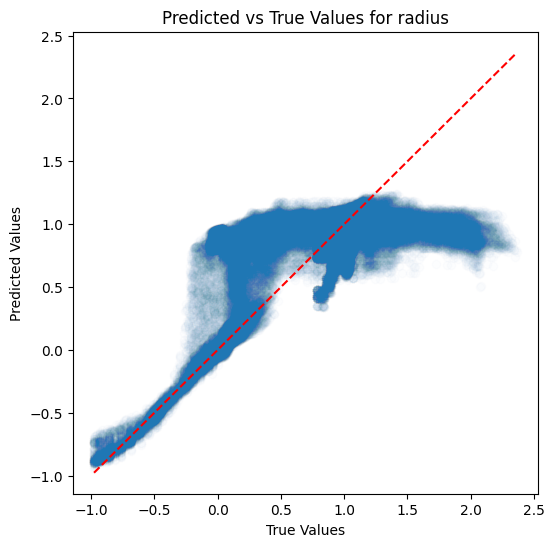

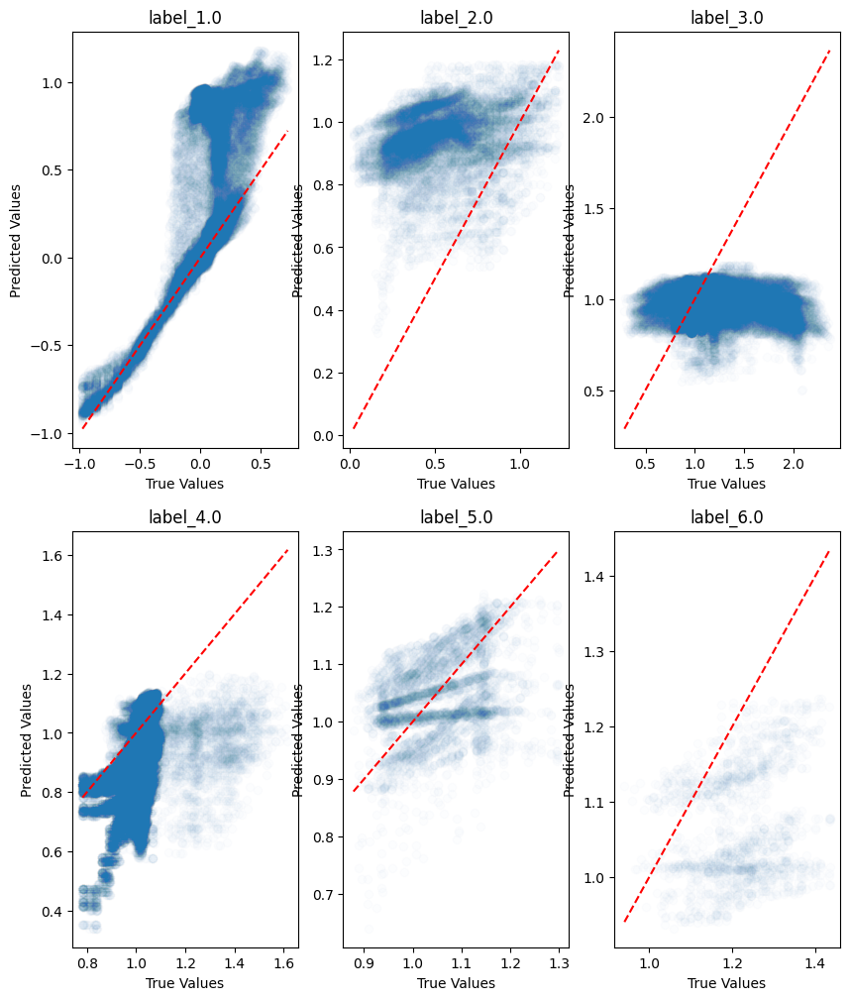

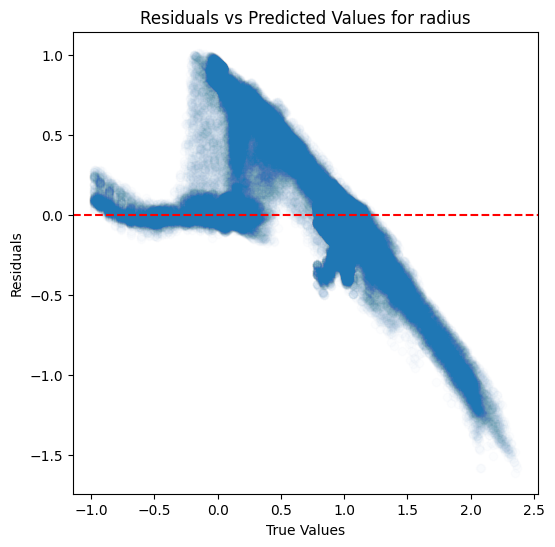

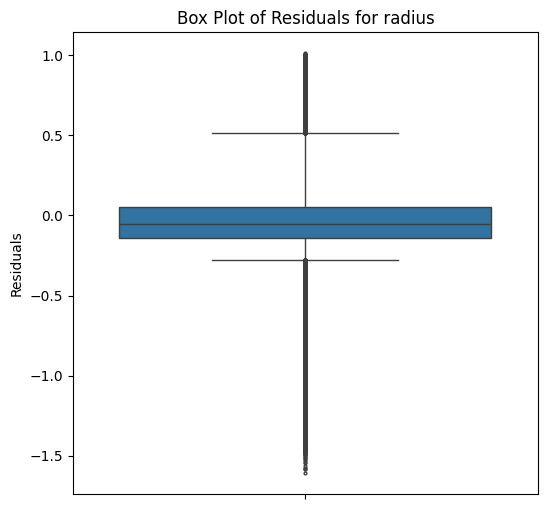

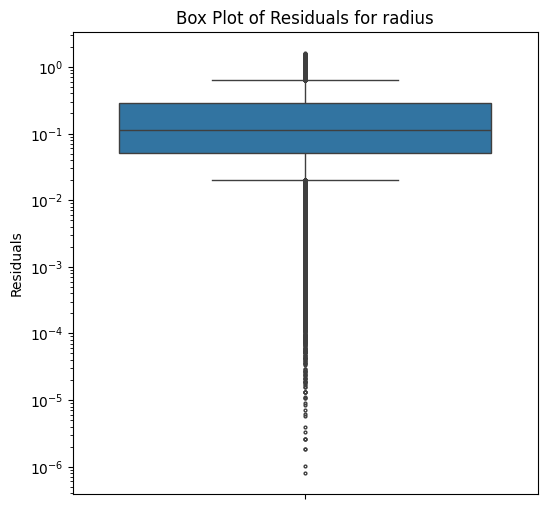

...

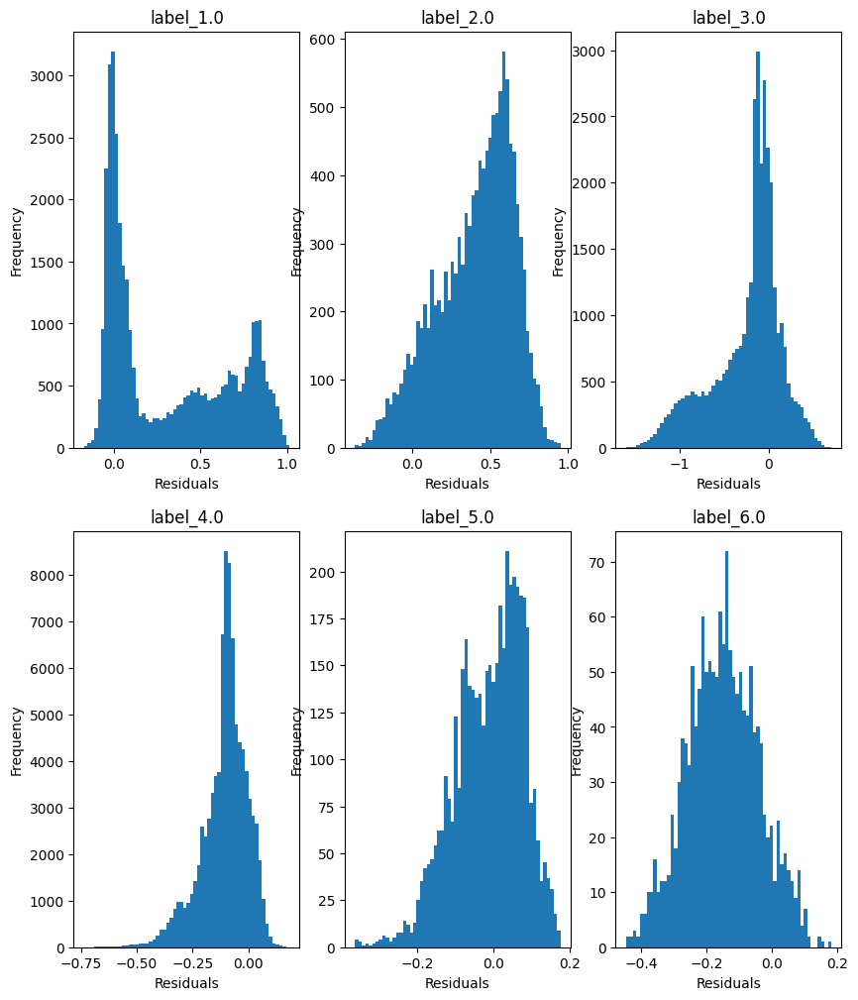

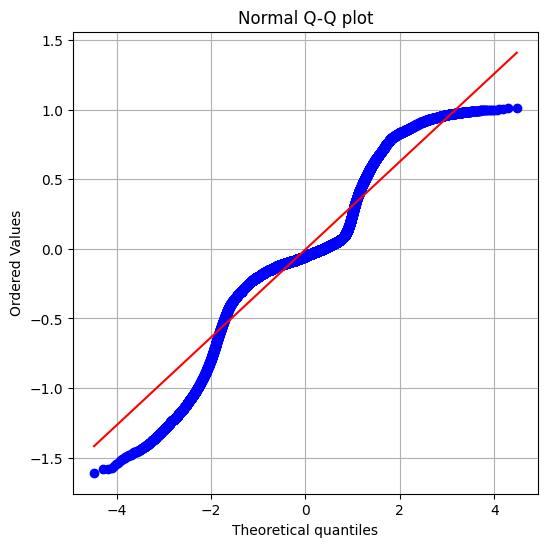

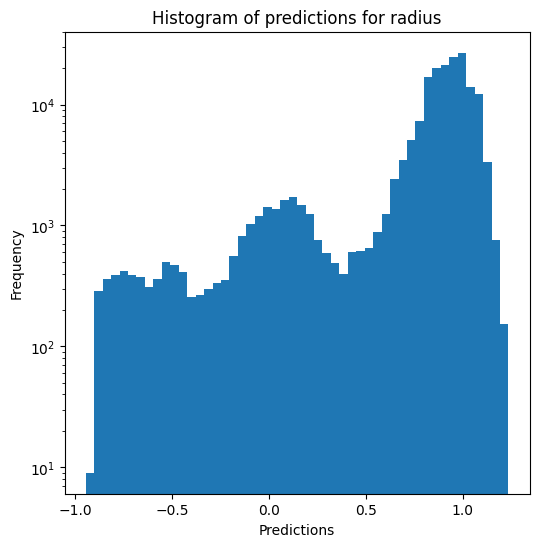

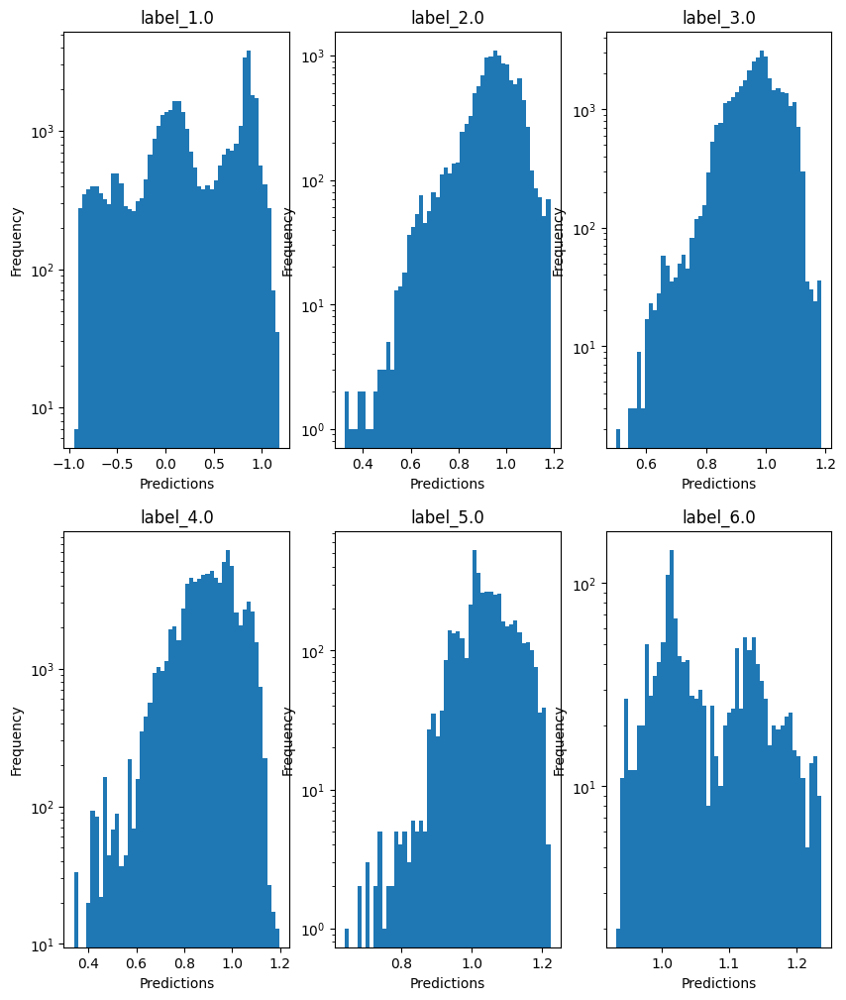

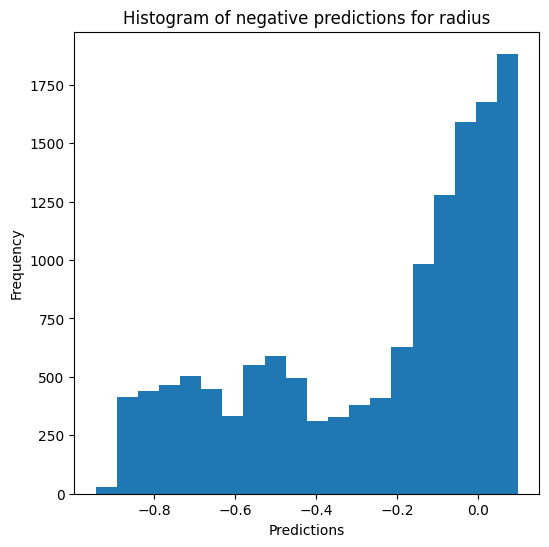

Saving results...


In [24]:
mlp_evaluator.evaluate_Kfold_results(MLPRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, n_splits=5, random_state=12, override=override, use_preds=use_preds, save=save, show=show, 
                                     hidden_layer_sizes = (100, 100, 100, 100), max_iter=20, batch_size=400) #, override=False, use_preds=True)